## Project Title

Comparative analysis of PCA, ICA, t-SNE and  UMAP in projecting multidimensional dataset into lower dimensional subspace.

## Project Description

A dataset is provided with the aim to apply dimensionality reduction techniques on 456 features contained in the dataset. The aim is to compare four dimensionality reduction techniques (PCA, ICA, tSNE, UMAP) on these features of the dataset by applying several unsupervised learning methods.

## **STEP 1**

Import relevant libaries and required dataset.

In [1]:
# Import necessary libries and data
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns; sns.set()
import sklearn
import warnings

In [2]:
# Loading the dataset
dataset = pd.read_csv('cpdata.csv', header=0)
dataset.head()

,Pop_Date,Operator,County,Prod_Zone_Detail,Lateral_Length,Surf_Lat,Surf_Long,Bh_Lat,Bh_Long,Tvd,...,S_448,S_449,S_450,S_451,S_452,S_453,S_454,S_455,S_456,Well_ID
0,8/11/2018 16:00,PXD,Martin,267-5 SPBY M A1,10482.0,32.354496,-102.236481,32.384785,-102.246117,8865,...,29.031245,32.824860,0.176982,0.345420,0.678986,0.144534,0.201185,0.280786,0.586926,64
1,8/13/2018 20:00,PXD,Martin,267-5 SPBY M A1,10382.0,32.354549,-102.236343,32.385426,-102.243294,8853,...,28.994297,32.758404,0.174164,0.335883,0.656753,0.140314,0.198216,0.274363,0.577001,65
2,9/17/2011 0:00,Laredo,Glasscock,267-5 SPBY M A1,3534.0,31.684450,-101.480377,31.673170,-101.476723,5643,...,30.033335,33.607426,0.213166,0.293703,0.413689,0.042500,0.243172,0.288024,0.358632,247
3,3/21/2012 0:00,Laredo,Glasscock,272-0 WFMP A2,3798.0,31.670851,-101.476562,31.659290,-101.473473,7754,...,28.059720,31.298042,0.241315,0.308419,0.498569,0.041000,0.270800,0.298462,0.369000,249
4,4/5/2012 0:00,Laredo,Glasscock,292-0 WFMP D,3632.0,31.767870,-101.522957,31.779249,-101.526413,9657,...,50.093117,55.244366,0.623182,0.784767,0.938185,0.061800,0.708804,0.788375,0.862109,250


In [3]:
# Obtain columns with actual data to be analyzed
data = dataset.loc[:, 'S_1':'S_456']
data.head()

,S_1,S_2,S_3,S_4,S_5,S_6,S_7,S_8,S_9,S_10,...,S_447,S_448,S_449,S_450,S_451,S_452,S_453,S_454,S_455,S_456
0,12819.28587,1.446280,1.461819,300.586586,224.087670,289.219797,66.104855,336.212861,163.285306,217.256738,...,21.405738,29.031245,32.824860,0.176982,0.345420,0.678986,0.144534,0.201185,0.280786,0.586926
1,12780.02848,1.447915,1.463602,305.257917,222.509371,291.191134,67.415027,334.335544,160.904644,209.478327,...,21.548638,28.994297,32.758404,0.174164,0.335883,0.656753,0.140314,0.198216,0.274363,0.577001
2,28565.74272,1.452525,1.460131,226.660616,295.602186,328.660502,61.685706,528.357037,167.947344,282.626983,...,26.334324,30.033335,33.607426,0.213166,0.293703,0.413689,0.042500,0.243172,0.288024,0.358632
3,31994.66973,1.455835,1.462897,224.330794,307.835396,337.355747,57.285980,536.567592,165.459261,266.069091,...,24.413160,28.059720,31.298042,0.241315,0.308419,0.498569,0.041000,0.270800,0.298462,0.369000
4,16206.38050,1.431994,1.445618,241.858086,279.648707,321.798234,82.436954,541.266951,163.244248,253.688562,...,43.863583,50.093117,55.244366,0.623182,0.784767,0.938185,0.061800,0.708804,0.788375,0.862109


## **STEP 2**

Clean data of any missing values.

In [4]:
#Check for missing values
data.isna().sum()

S_1      3
S_2      3
S_3      3
S_4      3
S_5      3
        ..
S_452    4
S_453    4
S_454    4
S_455    4
S_456    4
Length: 456, dtype: int64

In [5]:
#Determine the number of rows and columns in the original data.
data.shape

(876, 456)

In [6]:
# Since there are very few missing values and it will be difficult to make a matrix plot, it is best advised to determine the level of dispersion amongst the data in order to determine the possibility to replace these missing values with either the mean or median. If the dispersion is very high, then it will be difficult to replace with the mean or median, hence the confirmation  to remove the missing values. 
data.describe()

,S_1,S_2,S_3,S_4,S_5,S_6,S_7,S_8,S_9,S_10,...,S_447,S_448,S_449,S_450,S_451,S_452,S_453,S_454,S_455,S_456
count,873.000000,873.000000,873.000000,873.000000,873.000000,873.000000,873.000000,873.000000,873.000000,873.000000,...,872.000000,872.000000,872.000000,872.000000,872.000000,872.000000,872.000000,872.000000,872.000000,872.000000
mean,20591.634324,1.493063,1.528155,280.084129,264.988441,290.223351,91.382439,425.820432,187.573550,274.670859,...,23.488216,29.189189,34.894402,0.367785,0.508763,0.707956,0.071873,0.422366,0.500625,0.609022
std,7122.178733,0.061276,0.051168,16.478153,19.668630,11.188418,10.618749,22.618360,17.150917,45.006452,...,6.269892,6.032468,6.602151,0.102453,0.112998,0.120748,0.032832,0.110628,0.121294,0.122102
min,11657.630040,1.367956,1.397835,178.438036,222.509371,254.778820,40.879563,334.335544,111.970521,191.575565,...,7.785182,13.357081,20.538397,0.045600,0.279239,0.413689,0.019900,0.134598,0.267495,0.358632
25%,13818.712460,1.459715,1.498126,268.711924,249.120647,283.793145,83.601842,414.001386,181.116491,232.641786,...,19.326656,25.669073,30.637810,0.290766,0.422242,0.621487,0.047800,0.337267,0.407852,0.516910
50%,19120.520350,1.477292,1.525696,281.371317,267.918975,290.370338,91.877094,431.719823,187.756620,272.195195,...,22.592397,28.343012,33.157770,0.372046,0.511145,0.705992,0.065450,0.429011,0.507061,0.602511
75%,25494.789090,1.505856,1.545308,292.849491,277.052645,297.288661,97.731776,439.049883,195.864498,307.084270,...,27.129637,32.380337,37.439841,0.440194,0.601612,0.782788,0.089425,0.498881,0.595992,0.687060
max,44779.393000,1.639343,1.648876,322.248284,310.193671,354.998517,112.393416,554.015942,250.520703,363.456166,...,57.510624,60.667999,63.810963,0.643641,0.784767,1.037638,0.246275,0.725053,0.864189,0.962739


In [7]:
data.fillna(data.mean(), inplace=True) # since dispersion wasn't so noticeable i replaced null values with mean and save a number of useful data

In [8]:
#Check if there are still missing values
data.isna().sum()

S_1      0
S_2      0
S_3      0
S_4      0
S_5      0
        ..
S_452    0
S_453    0
S_454    0
S_455    0
S_456    0
Length: 456, dtype: int64

In [9]:
#Determine the number of rows and columns in the cleaned data.
data.shape

(876, 456)

In [10]:
# Describe the cleaned data
data.describe()

,S_1,S_2,S_3,S_4,S_5,S_6,S_7,S_8,S_9,S_10,...,S_447,S_448,S_449,S_450,S_451,S_452,S_453,S_454,S_455,S_456
count,876.000000,876.000000,876.000000,876.000000,876.000000,876.000000,876.000000,876.000000,876.000000,876.000000,...,876.000000,876.000000,876.000000,876.000000,876.000000,876.000000,876.000000,876.000000,876.000000,876.000000
mean,20591.634324,1.493063,1.528155,280.084129,264.988441,290.223351,91.382439,425.820432,187.573550,274.670859,...,23.488216,29.189189,34.894402,0.367785,0.508763,0.707956,0.071873,0.422366,0.500625,0.609022
std,7109.958800,0.061171,0.051080,16.449880,19.634884,11.169221,10.600530,22.579553,17.121490,44.929232,...,6.255544,6.018664,6.587043,0.102219,0.112739,0.120472,0.032757,0.110375,0.121017,0.121822
min,11657.630040,1.367956,1.397835,178.438036,222.509371,254.778820,40.879563,334.335544,111.970521,191.575565,...,7.785182,13.357081,20.538397,0.045600,0.279239,0.413689,0.019900,0.134598,0.267495,0.358632
25%,13851.959465,1.459921,1.498177,268.745913,249.149637,283.880537,83.606267,414.111574,181.126603,232.659594,...,19.349392,25.680396,30.655806,0.290942,0.422482,0.621769,0.047875,0.338502,0.408596,0.518190
50%,19123.462720,1.477329,1.525740,281.315891,267.898472,290.303433,91.860083,431.686883,187.724751,272.198434,...,22.618034,28.402322,33.188900,0.371308,0.510502,0.706374,0.065550,0.428083,0.505541,0.602869
75%,25451.818530,1.505394,1.545296,292.828878,277.020138,297.252804,97.689758,439.043194,195.849078,307.036630,...,27.107676,32.337948,37.426780,0.440104,0.599920,0.782020,0.089325,0.498553,0.595684,0.686573
max,44779.393000,1.639343,1.648876,322.248284,310.193671,354.998517,112.393416,554.015942,250.520703,363.456166,...,57.510624,60.667999,63.810963,0.643641,0.784767,1.037638,0.246275,0.725053,0.864189,0.962739


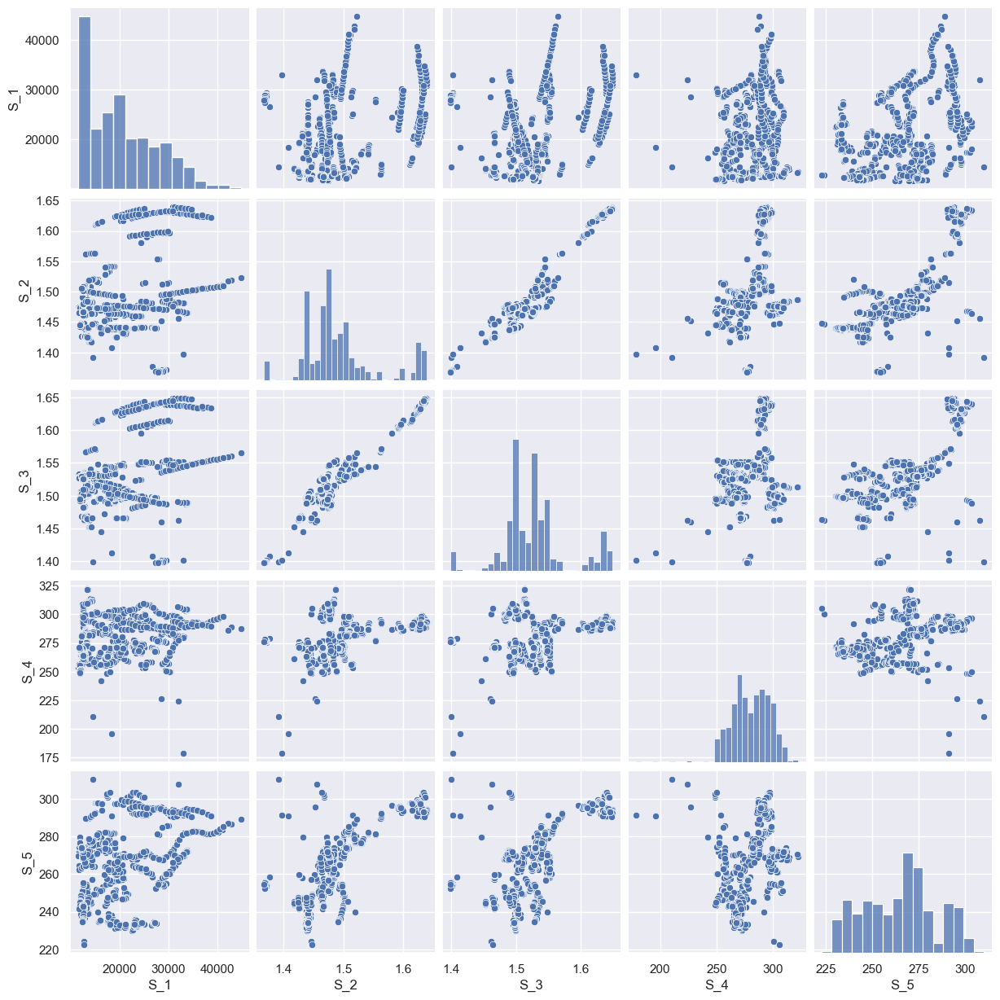

In [11]:
# We can see the implementation of the .fillna didnt affect the dispersion of the data in any way which confirms good practice.
#Plot a matrix plot for the first 5 features and inference from it.
sns.pairplot(data.iloc[:, 0:5])

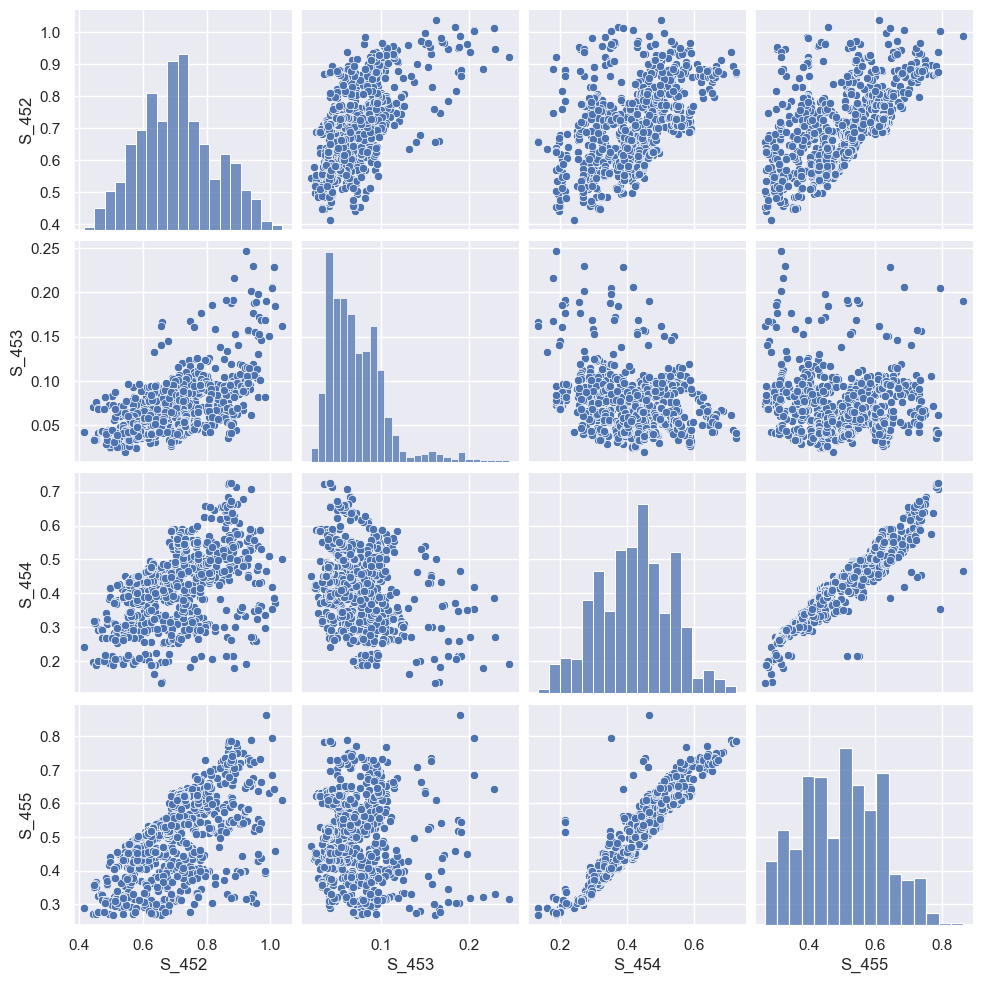

In [12]:
#Plot a matrix plot for the last 5 features and inference from it.
sns.pairplot(data.iloc[:, 451:455])

**Comments**

First, from the plots above we can see that there where slight disparity in the dataset, which suggests some outliers. However, due to the limited access to information on the subject matter (domain knowledge), it will be unjustifiable to carefully eliminate these disparity cross the 456 features. Furthermore, the above matrix plots, we can observe that some of the features have some linear relationship, while some others have a non-linear relationship, while some do not have any contribution or show any relationship. With this inference, we can see that it is clearly important to extract features with high importance to our relationship by reducing the number of features while retaining original information. This process is called feature extraction. This process is the second type of dimensionality reduction technique, with feature selection being the first.

In the subsequent sections, four feature extraction dimensionality reduction techniques will be used to reduce the data and a comparison will be made to determine the best performance.

## **STEP 3**

Scale cleaned data

**Comment**

First, before implementing the dimensionality technique (particurly the PCA and for consistency across all the reduction techniques choice), data needs to be scaled and it is a rule of thumb to make use of the StandardScaler. This is because, for variances to be measured and to have optimal ratio differences, the mean has to be zero with a unit variance. Other scaler methods will not produce this conditions like Standardscalar would, hence the suitability.

**Reference**

1.) https://en.m.wikipedia.org/wiki/Principal_component_analysis

2.) https://www.researchgate.net/post/Is-it-necessary-to-normalize-data-before-performing-principle-component-analysis

**Scaling using StandardScaler**

In [15]:
# Define the required data for standardscaler
df_sd = data.loc[:, 'S_1':'S_456']
df_sd.head()

,S_1,S_2,S_3,S_4,S_5,S_6,S_7,S_8,S_9,S_10,...,S_447,S_448,S_449,S_450,S_451,S_452,S_453,S_454,S_455,S_456
0,12819.28587,1.446280,1.461819,300.586586,224.087670,289.219797,66.104855,336.212861,163.285306,217.256738,...,21.405738,29.031245,32.824860,0.176982,0.345420,0.678986,0.144534,0.201185,0.280786,0.586926
1,12780.02848,1.447915,1.463602,305.257917,222.509371,291.191134,67.415027,334.335544,160.904644,209.478327,...,21.548638,28.994297,32.758404,0.174164,0.335883,0.656753,0.140314,0.198216,0.274363,0.577001
2,28565.74272,1.452525,1.460131,226.660616,295.602186,328.660502,61.685706,528.357037,167.947344,282.626983,...,26.334324,30.033335,33.607426,0.213166,0.293703,0.413689,0.042500,0.243172,0.288024,0.358632
3,31994.66973,1.455835,1.462897,224.330794,307.835396,337.355747,57.285980,536.567592,165.459261,266.069091,...,24.413160,28.059720,31.298042,0.241315,0.308419,0.498569,0.041000,0.270800,0.298462,0.369000
4,16206.38050,1.431994,1.445618,241.858086,279.648707,321.798234,82.436954,541.266951,163.244248,253.688562,...,43.863583,50.093117,55.244366,0.623182,0.784767,0.938185,0.061800,0.708804,0.788375,0.862109


In [16]:
# create list of column names to use later
col_names = list(df_sd)
print(col_names)

['S_1', 'S_2', 'S_3', 'S_4', 'S_5', 'S_6', 'S_7', 'S_8', 'S_9', 'S_10', 'S_11', 'S_12', 'S_13', 'S_14', 'S_15', 'S_16', 'S_17', 'S_18', 'S_19', 'S_20', 'S_21', 'S_22', 'S_23', 'S_24', 'S_25', 'S_26', 'S_27', 'S_28', 'S_29', 'S_30', 'S_31', 'S_32', 'S_33', 'S_34', 'S_35', 'S_36', 'S_37', 'S_38', 'S_39', 'S_40', 'S_41', 'S_42', 'S_43', 'S_44', 'S_45', 'S_46', 'S_47', 'S_48', 'S_49', 'S_50', 'S_51', 'S_52', 'S_53', 'S_54', 'S_55', 'S_56', 'S_57', 'S_58', 'S_59', 'S_60', 'S_61', 'S_62', 'S_63', 'S_64', 'S_65', 'S_66', 'S_67', 'S_68', 'S_69', 'S_70', 'S_71', 'S_72', 'S_73', 'S_74', 'S_75', 'S_76', 'S_77', 'S_78', 'S_79', 'S_80', 'S_81', 'S_82', 'S_83', 'S_84', 'S_85', 'S_86', 'S_87', 'S_88', 'S_89', 'S_90', 'S_91', 'S_92', 'S_93', 'S_94', 'S_95', 'S_96', 'S_97', 'S_98', 'S_99', 'S_100', 'S_101', 'S_102', 'S_103', 'S_104', 'S_105', 'S_106', 'S_107', 'S_108', 'S_109', 'S_110', 'S_111', 'S_112', 'S_113', 'S_114', 'S_115', 'S_116', 'S_117', 'S_118', 'S_119', 'S_120', 'S_121', 'S_122', 'S_123', 

In [17]:
from sklearn.preprocessing import StandardScaler

s_scaler = StandardScaler()
df_s = s_scaler.fit_transform(df_sd)

df_s = pd.DataFrame(df_s, columns=col_names)
df_s.head()


,S_1,S_2,S_3,S_4,S_5,S_6,S_7,S_8,S_9,S_10,...,S_447,S_448,S_449,S_450,S_451,S_452,S_453,S_454,S_455,S_456
0,-1.093788,-0.765231,-1.299394,1.247071,-2.084257,-0.089901,-2.385921,-3.970794,-1.419393,-1.278609,...,-0.333091,-0.026257,-0.314363,-1.867671,-1.449686,-0.240610,2.219420,-2.005055,-1.817642,-0.181481
1,-1.099313,-0.738474,-1.264471,1.531207,-2.164685,0.086697,-2.262255,-4.053984,-1.558518,-1.451834,...,-0.310234,-0.032400,-0.324458,-1.895258,-1.534325,-0.425270,2.090510,-2.031966,-1.870751,-0.262999
2,1.122181,-0.663068,-1.332461,-3.249509,1.560042,3.443312,-2.803039,4.543721,-1.146946,0.177182,...,0.455234,0.140335,-0.195492,-1.513484,-1.908683,-2.444023,-0.897214,-1.624435,-1.757801,-2.056549
3,1.604728,-0.608935,-1.278295,-3.391221,2.183432,4.222257,-3.218324,4.907556,-1.292348,-0.191561,...,0.147944,-0.187768,-0.546287,-1.237951,-1.778071,-1.739063,-0.943031,-1.373980,-1.671498,-1.971389
4,-0.617129,-0.998898,-1.616748,-2.325116,0.747070,2.828570,-0.844354,5.115800,-1.421792,-0.467274,...,3.259030,3.475168,3.091158,2.499955,2.449573,1.912154,-0.307695,2.596628,2.379125,2.078705


In [18]:
df_s.describe()

,S_1,S_2,S_3,S_4,S_5,S_6,S_7,S_8,S_9,S_10,...,S_447,S_448,S_449,S_450,S_451,S_452,S_453,S_454,S_455,S_456
count,8.760000e+02,8.760000e+02,8.760000e+02,8.760000e+02,8.760000e+02,8.760000e+02,8.760000e+02,8.760000e+02,8.760000e+02,8.760000e+02,...,8.760000e+02,8.760000e+02,8.760000e+02,876.000000,8.760000e+02,8.760000e+02,8.760000e+02,8.760000e+02,8.760000e+02,8.760000e+02
mean,-4.704507e-16,3.017373e-15,9.084565e-16,-1.881803e-15,9.733462e-17,8.111218e-16,3.244487e-17,7.786770e-16,-4.542282e-16,-5.840077e-16,...,-1.297795e-16,-3.244487e-16,-8.922340e-16,0.000000,-8.111218e-17,3.406712e-16,-1.946692e-16,-1.013902e-16,1.480297e-16,4.542282e-16
std,1.000571e+00,1.000571e+00,1.000571e+00,1.000571e+00,1.000571e+00,1.000571e+00,1.000571e+00,1.000571e+00,1.000571e+00,1.000571e+00,...,1.000571e+00,1.000571e+00,1.000571e+00,1.000571,1.000571e+00,1.000571e+00,1.000571e+00,1.000571e+00,1.000571e+00,1.000571e+00
min,-1.257266e+00,-2.046364e+00,-2.552727e+00,-6.182669e+00,-2.164685e+00,-3.175224e+00,-4.766906e+00,-4.053984e+00,-4.418203e+00,-1.850527e+00,...,-2.511693e+00,-2.632005e+00,-2.180676e+00,-3.153707,-2.037048e+00,-2.444023e+00,-1.587531e+00,-2.608683e+00,-1.927533e+00,-2.056549e+00
25%,-9.484619e-01,-5.420936e-01,-5.872171e-01,-6.896520e-01,-8.071274e-01,-5.682076e-01,-7.339836e-01,-5.188565e-01,-3.767564e-01,-9.355883e-01,...,-6.620028e-01,-5.833184e-01,-6.438424e-01,-0.752178,-7.657561e-01,-7.158240e-01,-7.330340e-01,-7.602460e-01,-7.609058e-01,-7.460337e-01
50%,-2.066131e-01,-2.573616e-01,-4.729448e-02,7.492243e-02,1.482919e-01,7.174040e-03,4.508418e-02,2.599610e-01,8.836108e-03,-5.506074e-02,...,-1.391851e-01,-1.308126e-01,-2.590656e-01,0.034491,1.543352e-02,-1.313926e-02,-1.931509e-01,5.182980e-02,4.064051e-02,-5.053760e-02
75%,6.839647e-01,2.016904e-01,3.357728e-01,7.752050e-01,6.131215e-01,6.297188e-01,5.953403e-01,5.859423e-01,4.836177e-01,7.207838e-01,...,5.789309e-01,5.234646e-01,3.846680e-01,0.707895,8.090338e-01,6.151278e-01,5.330569e-01,6.906527e-01,7.859459e-01,6.369612e-01
max,3.403898e+00,2.392679e+00,2.364708e+00,2.564653e+00,2.303607e+00,5.802747e+00,1.983201e+00,5.680748e+00,3.678600e+00,1.977243e+00,...,5.441868e+00,5.233187e+00,4.392423e+00,2.700221,2.449573e+00,2.738152e+00,5.327105e+00,2.743928e+00,3.005960e+00,2.905210e+00


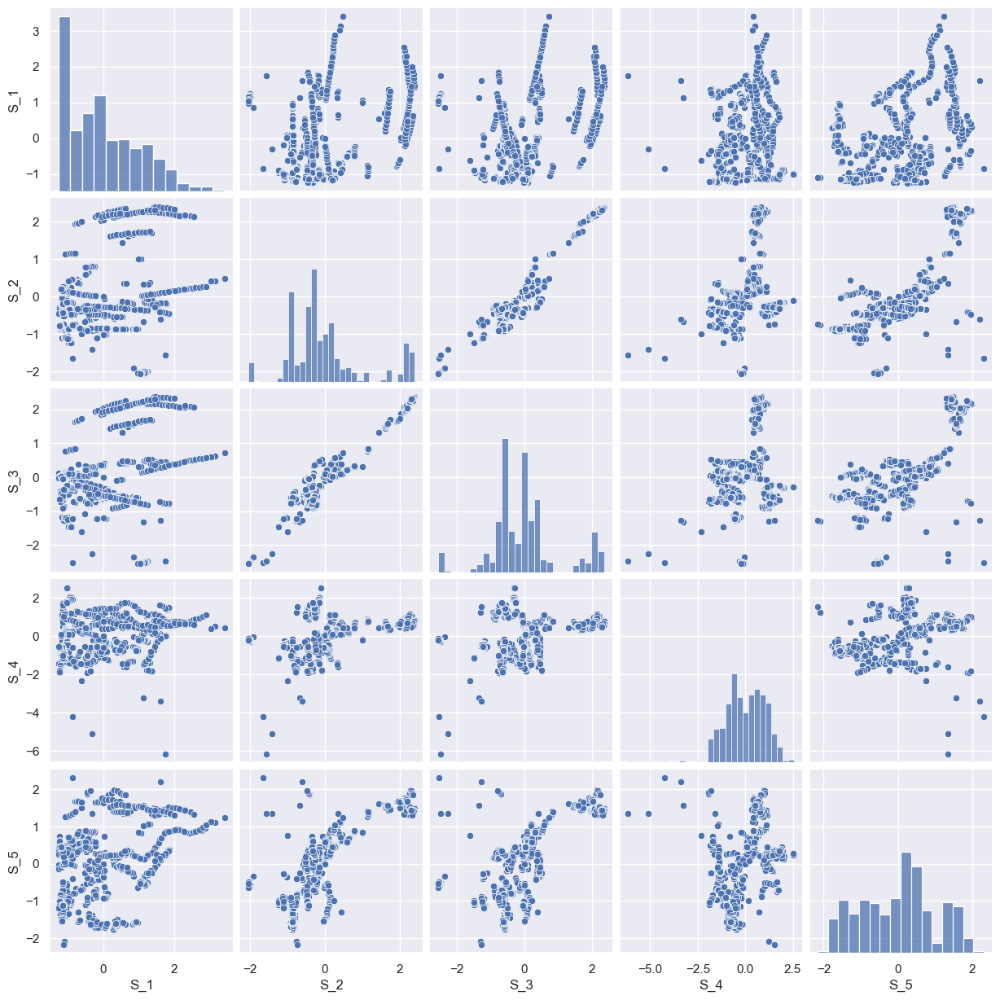

In [19]:
#Plot a matrix plot for the first 5 features to visualize after scaling
sns.pairplot(df_s.iloc[:, 0:5])

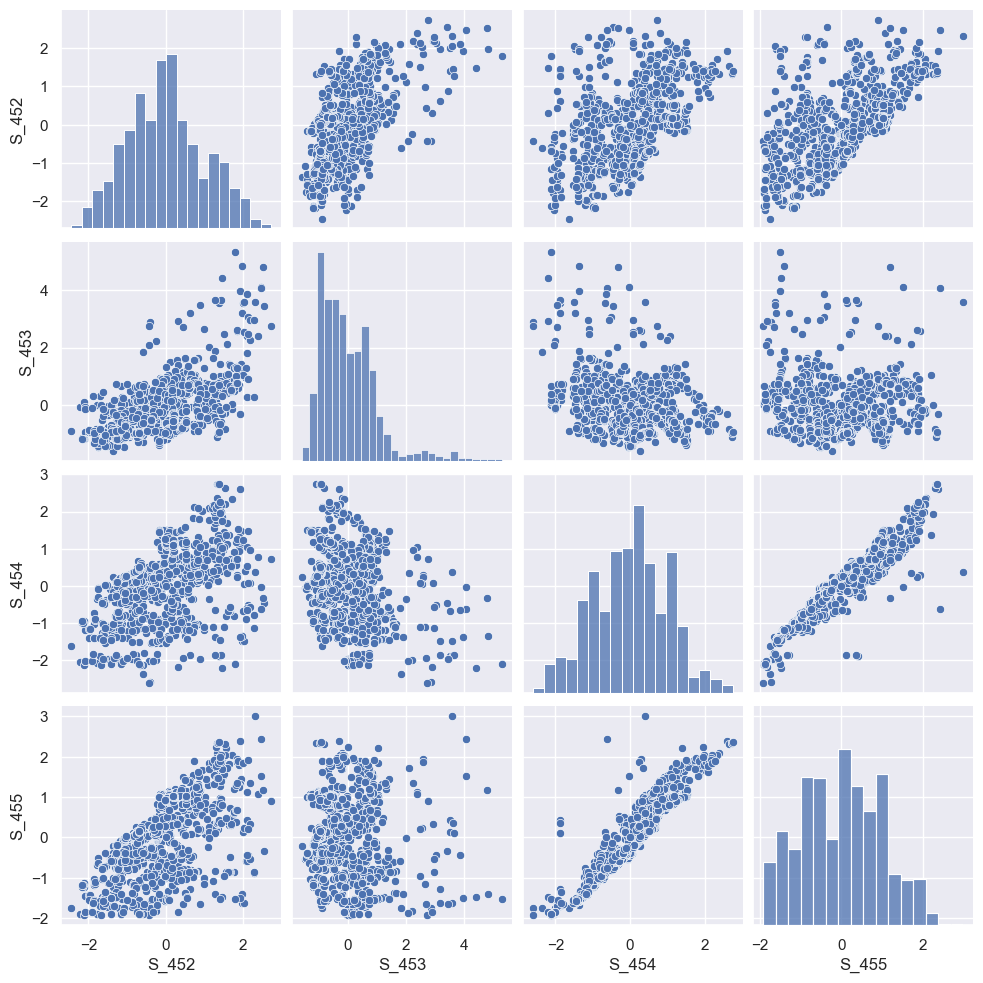

In [20]:
#Plot a matrix plot for the last 5 features to visualize after scaling
sns.pairplot(df_s.iloc[:, 451:455])

## **STEP 4**

Apply Kmeans on the scaled data

In [21]:
# Define the required data for Kmeans application
df_s_kmeans = df_s.loc[:, 'S_1':'S_456']

In [24]:
#Using SSW to determine optimum number of clusters
from sklearn.cluster import KMeans
SSW_original = np.zeros(10) # Initialize the list SSW to be empty

for k in range(1,10):
    
    kmeans_for_original_data = KMeans(n_clusters = k, random_state=42).fit(df_s_kmeans) # All the other K-Means options are defaulted
    
    SSW_original[k] = kmeans_for_original_data.inertia_ # Compute the sum of squares within


print('The SSW values are', SSW_original[1:10])

C:\Users\EBEN\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\EBEN\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(
C:\Users\EBEN\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\EBEN\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment v

The SSW values are [399456.         313680.30216583 251793.62285877 225002.36807944
 200187.79942326 187859.98654664 174483.19367521 168597.25183186
 155658.50509673]


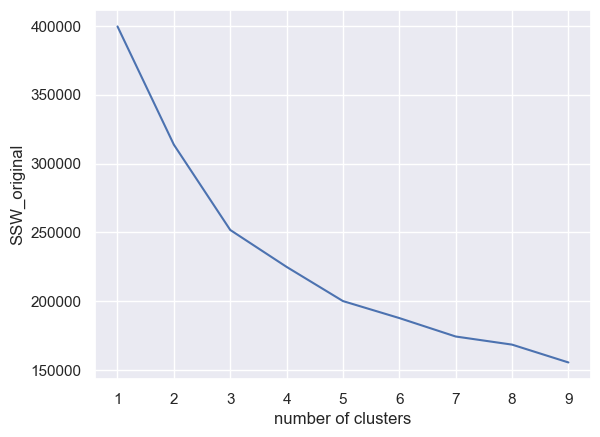

In [25]:
# Plot the SSW values and determine most optimum
clusters = range(1, 10)
plt.ylabel('SSW_original')
plt.xlabel('number of clusters')
plt.plot(clusters, SSW_original[1:10])

In [28]:
# Create a model using KMeans algorithm with the option of 3 clusters as questions stated
from sklearn.cluster import KMeans
Original_data_kmeans = KMeans(n_clusters = 3, init = 'k-means++', n_init = 10, max_iter = 300, random_state = 42)
cluster_labels = Original_data_kmeans.fit_predict(df_s_kmeans)

print(Original_data_kmeans.labels_)
print(Original_data_kmeans.cluster_centers_)

C:\Users\EBEN\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(


[1 1 1 1 2 1 2 1 1 1 2 1 1 0 1 1 2 1 1 1 1 1 1 1 1 1 2 2 1 1 1 0 2 2 2 0 0
 0 1 1 1 0 0 0 1 0 0 2 2 2 0 2 1 1 1 2 2 2 0 0 0 2 2 1 1 1 1 1 1 1 1 2 2 2
 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 0 1 1 1 2 2 0 1 1 2 2 2 2 1 1 2 2 2 2 2
 1 2 2 2 2 2 0 2 2 1 2 2 2 2 1 2 2 2 2 2 2 2 1 1 1 1 2 2 2 2 2 2 2 1 1 2 2
 2 2 2 2 0 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 0 0 0 2 1 1 1 1 1 1 0 0 0
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 2 0 0 0 2 2 2 2 2 2 0 2 1 0 0 2 2 2 1
 1 1 1 1 1 0 0 2 0 0 2 0 0 0 1 1 2 2 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 0 0 0 0
 1 0 1 1 1 1 2 2 1 1 1 2 2 2 1 1 1 1 1 1 1 2 2 2 2 2 1 1 2 2 2 2 2 1 1 1 1
 1 2 2 2 2 1 1 1 2 1 1 2 1 1 1 2 2 2 1 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1
 1 1 1 1 1 1 2 2 2 1 1 1 1 1 2 2 2 2 2 0 2 2 1 1 2 2 2 2 2 2 1 1 1 1 1 2 1
 1 2 0 2 2 0 2 2 2 0 1 1 2 2 1 2 1 2 1 2 2 0 2 2 2 2 0 2 0 1 0 2 0 2 2 2 0
 0 2 0 0 0 2 1 1 0 2 1 2 0 2 2 0 2 0 2 1 2 2 2 2 2 2 2 0 1 1 1 2 0 2 2 2 0
 1 1 2 2 2 0 2 2 2 0 2 2 2 0 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 0 0 0 0 0 0 

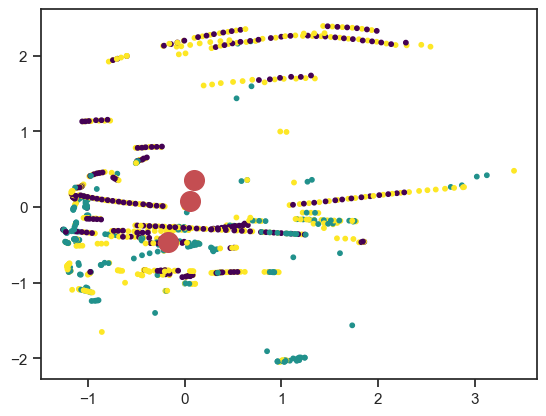

In [29]:
# Make a scatter plot to view clusters
plt.scatter(df_s_kmeans.iloc[:, 0], df_s_kmeans.iloc[:, 1], c=cluster_labels, s=10, cmap='viridis')
plt.scatter(Original_data_kmeans.cluster_centers_[:, 0], Original_data_kmeans.cluster_centers_[:, 1], c='r', s=200);

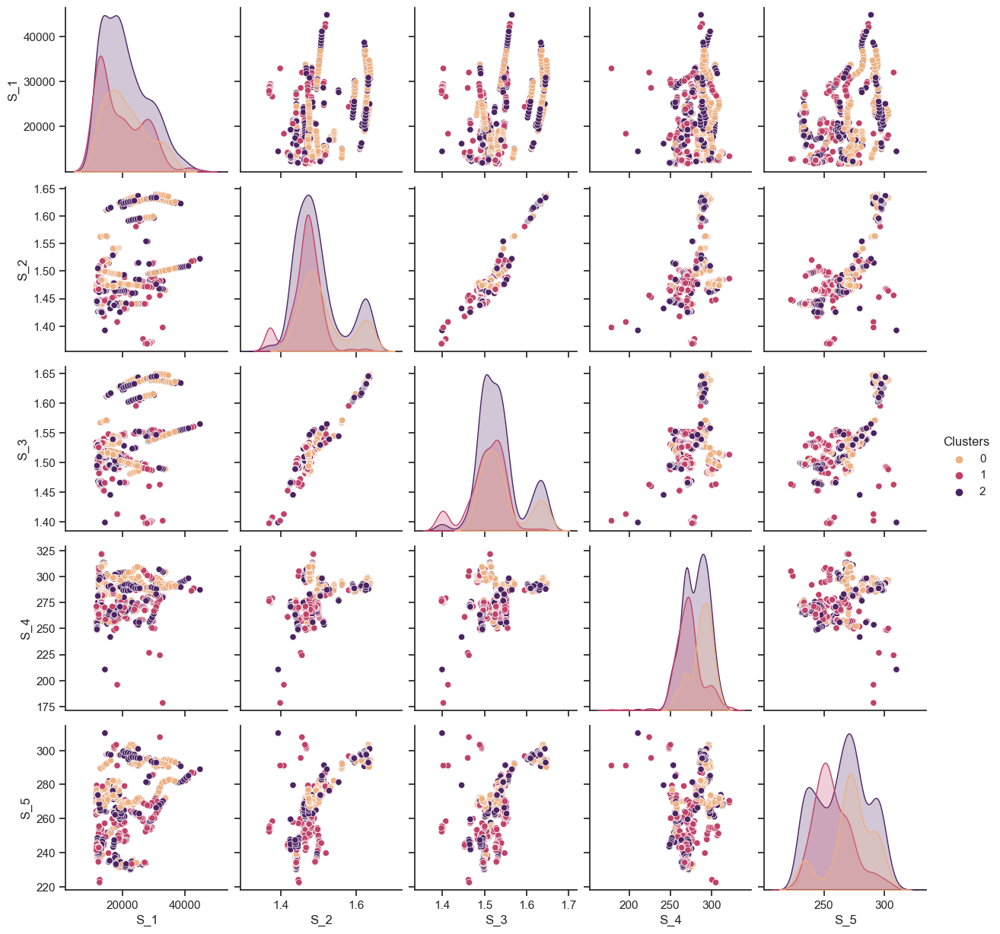

In [30]:
sns.set(style = 'ticks') # Set the background to ticks

data['Clusters'] = cluster_labels

sns.pairplot(data, vars=['S_1','S_2','S_3','S_4','S_5'], hue = 'Clusters', palette = 'flare') # Create a matrix scatterplot

<Axes: xlabel='Clusters', ylabel='S_1'>

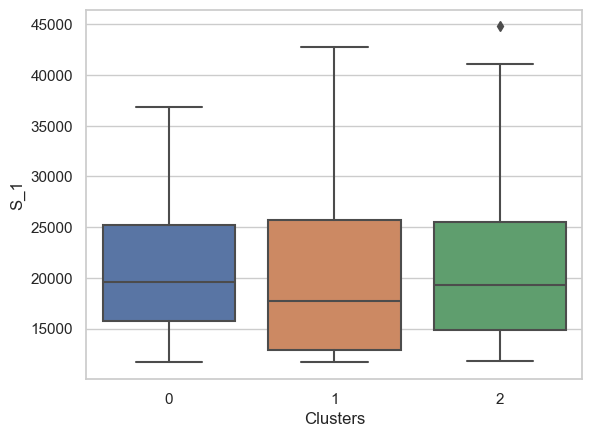

In [31]:
sns.set(style="whitegrid")
sns.boxplot(x=data['Clusters'], y=data['S_1'])

<Axes: xlabel='Clusters', ylabel='S_2'>

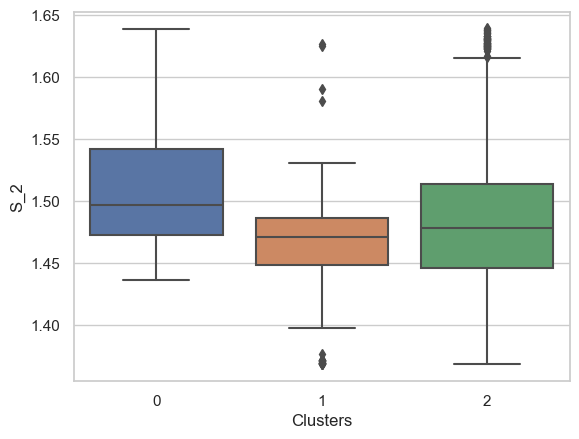

In [32]:
sns.set(style="whitegrid")
sns.boxplot(x=data['Clusters'], y=data['S_2'])

<Axes: xlabel='Clusters', ylabel='S_3'>

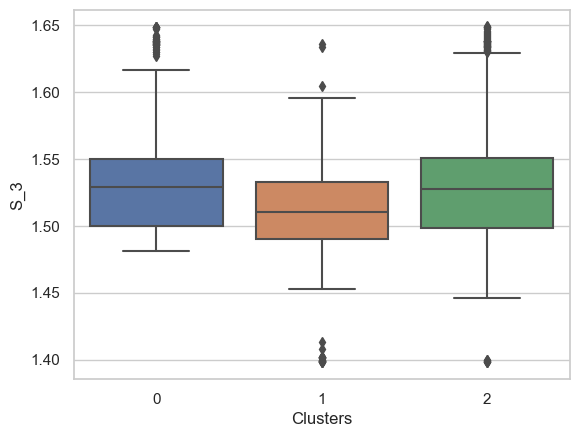

In [33]:
sns.set(style="whitegrid")
sns.boxplot(x=data['Clusters'], y=data['S_3'])

## STEP 5

Apply hierarchy clustering

In [35]:
# Define the required data for partitional clustering
df_s_hc = df_s.loc[:, 'S_1':'S_456']

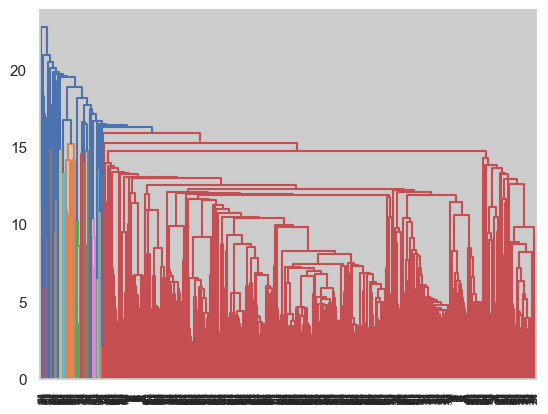

In [36]:
import scipy.cluster.hierarchy as sch
#Visualize the trees using dendogram using single linkage
dendrogram = sch.dendrogram(sch.linkage(df_s_hc, method='single'))

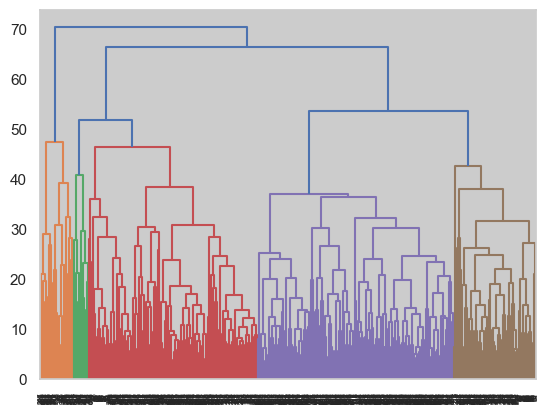

In [37]:
#Visualize the trees using dendogram using complete linkage
dendrogram = sch.dendrogram(sch.linkage(df_s_hc, method='complete'))

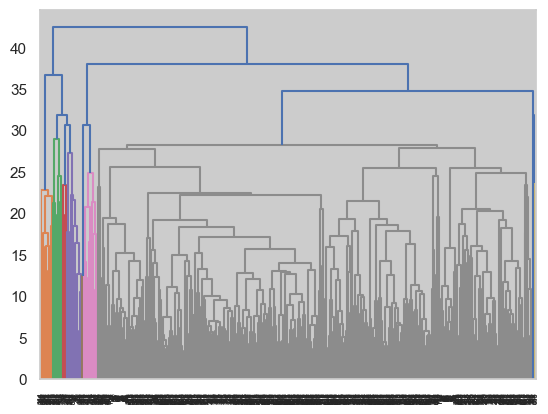

In [38]:
#Visualize the trees using dendogram using average linkage
dendrogram = sch.dendrogram(sch.linkage(df_s_hc, method='average'))

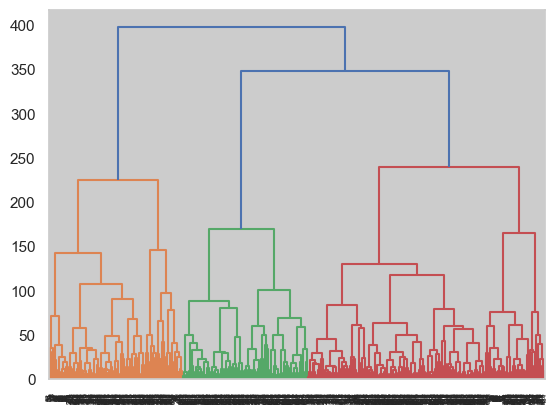

In [39]:
#Visualize the trees using dendogram using average linkage
dendrogram = sch.dendrogram(sch.linkage(df_s_hc, method='ward'))

In [40]:
# Define the model using complete and ward linkage since it had a better balance. Also using 3 clusters since we had determined 3 clusters to be the optimum number using SSW.
from sklearn.cluster import AgglomerativeClustering

hc_c = AgglomerativeClustering(n_clusters=3, affinity = 'euclidean', linkage = 'complete')

In [41]:
# Apply the model to the scaled data and predict the clusters
df_s_hc_c = df_s_hc.loc[:, 'S_1':'S_456']
y_hc_c = hc_c.fit_predict(df_s_hc_c)
print(y_hc_c)

[0 0 0 0 2 0 2 0 2 1 2 2 2 0 1 1 2 1 2 1 1 1 1 1 1 1 2 0 2 2 2 0 2 2 2 0 0
 0 2 2 2 0 0 0 2 0 0 2 2 2 0 0 0 2 0 2 2 2 0 0 0 2 2 0 0 0 2 2 2 2 0 2 2 2
 2 0 0 0 0 1 0 0 0 2 2 0 0 0 0 0 2 0 0 1 0 2 2 0 0 1 0 0 2 0 1 0 2 2 2 2 2
 2 2 2 2 2 2 0 2 2 0 2 2 2 0 0 0 2 2 2 2 2 2 0 0 0 0 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 0 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 0 0 0 0 0 2 0 0 0 0 0 0 0 0 0
 2 2 2 2 0 0 0 0 0 0 0 0 0 0 0 0 2 1 2 0 0 0 2 2 2 2 2 2 0 0 1 0 0 2 2 2 0
 0 0 0 0 0 0 0 2 0 0 2 0 0 0 2 2 2 2 2 2 2 2 2 2 0 0 0 0 0 0 2 0 0 0 0 0 0
 1 0 1 0 0 0 2 2 1 1 1 2 2 2 1 1 1 1 1 1 1 2 2 2 2 2 2 1 2 2 0 0 0 0 0 0 1
 1 2 2 2 2 2 2 1 2 1 1 2 1 1 1 2 2 2 0 2 2 2 2 2 2 2 2 2 2 2 2 0 0 0 0 1 0
 2 2 2 2 2 2 2 2 2 1 0 1 0 1 2 2 2 2 0 0 0 2 0 1 2 0 0 0 0 0 1 1 1 1 0 2 1
 1 0 0 0 0 0 2 2 2 0 0 0 2 2 0 2 0 2 0 2 2 0 2 2 0 0 0 0 0 2 0 0 0 0 0 0 0
 0 0 0 0 0 2 2 1 0 0 0 0 0 0 0 0 0 0 2 1 2 2 2 2 2 2 2 0 1 0 1 2 0 2 0 2 0
 1 0 2 2 2 0 2 2 2 0 0 0 0 0 2 0 0 2 2 2 2 0 2 0 0 0 0 0 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 0 0 0 0 0 0 

C:\Users\EBEN\anaconda3\lib\site-packages\sklearn\cluster\_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


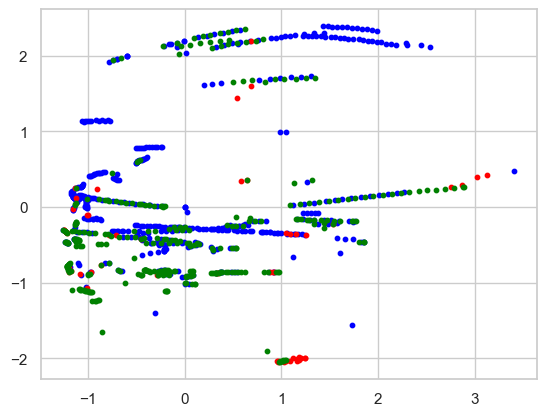

In [42]:
# Make a scatter plot to view the clusters
plt.scatter(df_s_hc_c.iloc[y_hc_c ==0,0],df_s_hc_c.iloc[y_hc_c ==0,1], s=10, c='blue')
plt.scatter(df_s_hc_c.iloc[y_hc_c ==1,0],df_s_hc_c.iloc[y_hc_c ==1,1], s=10, c='red')
plt.scatter(df_s_hc_c.iloc[y_hc_c ==2,0],df_s_hc_c.iloc[y_hc_c ==2,1], s=10, c='green')

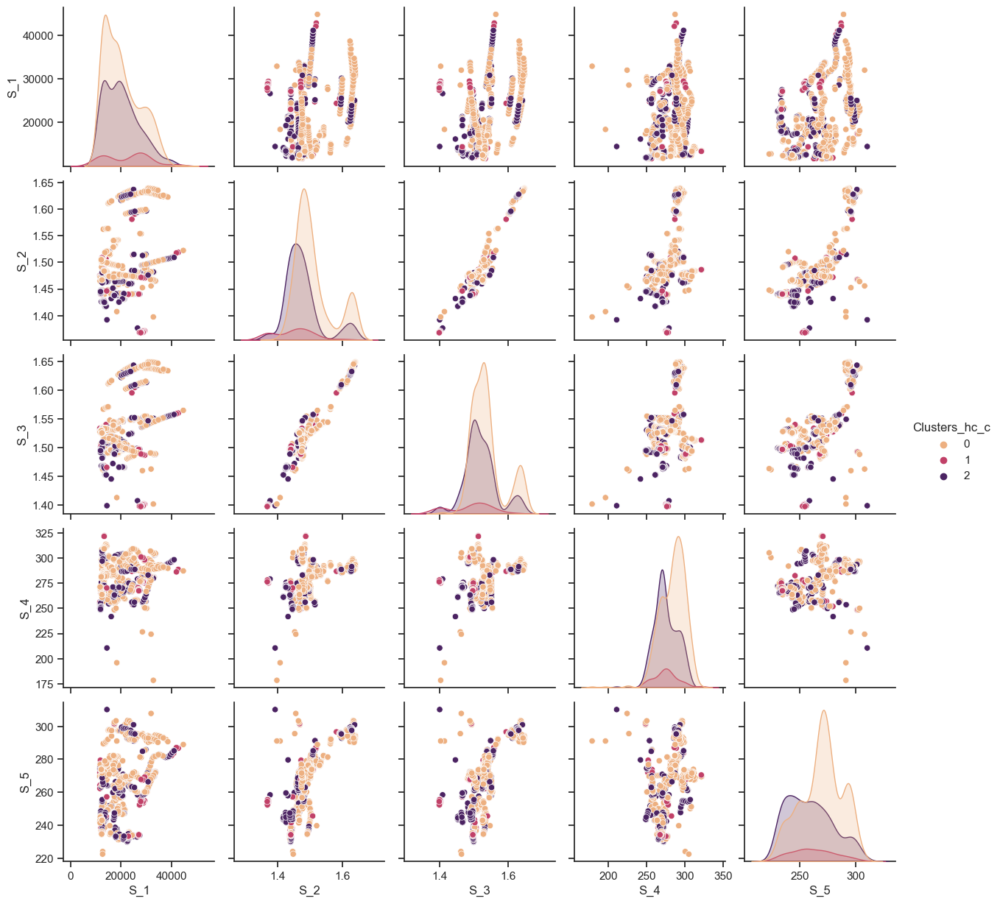

In [43]:
sns.set(style = 'ticks') # Set the background to ticks

data['Clusters_hc_c'] = y_hc_c

sns.pairplot(data, vars=['S_1','S_2','S_3','S_4','S_5'], hue = 'Clusters_hc_c', palette = 'flare') # Create a matrix scatterplot

<Axes: xlabel='Clusters_hc_c', ylabel='S_1'>

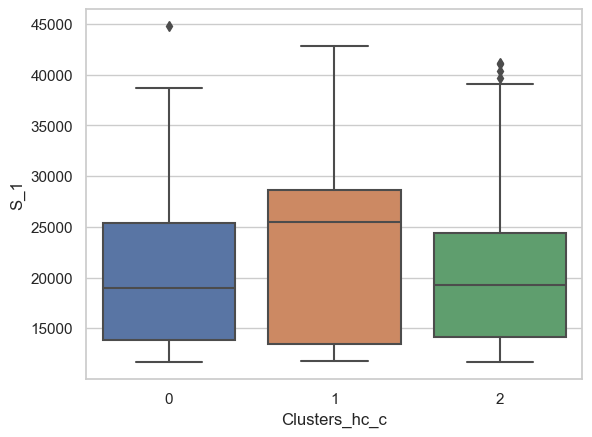

In [44]:
sns.set(style="whitegrid")
sns.boxplot(x=data['Clusters_hc_c'], y=data['S_1'])

<Axes: xlabel='Clusters_hc_c', ylabel='S_2'>

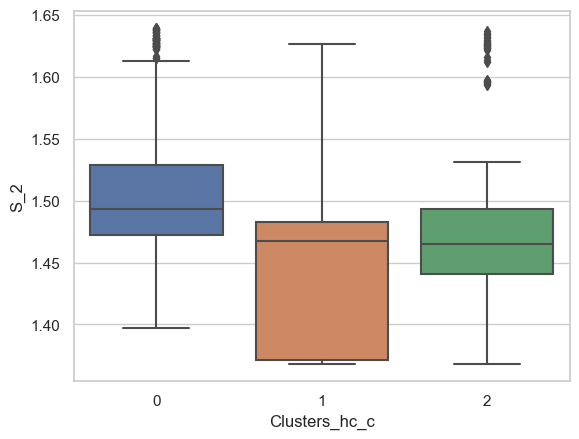

In [45]:
sns.set(style="whitegrid")
sns.boxplot(x=data['Clusters_hc_c'], y=data['S_2'])

<Axes: xlabel='Clusters_hc_c', ylabel='S_3'>

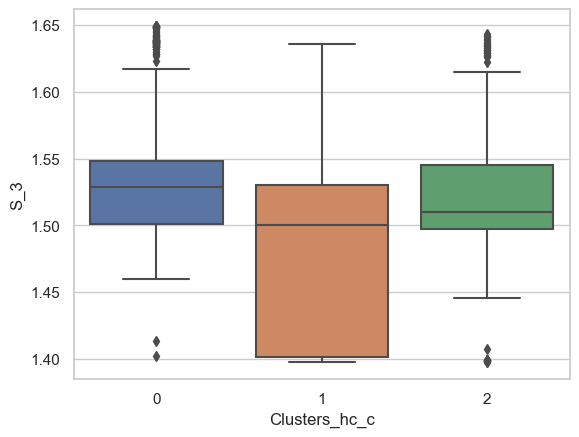

In [46]:
sns.set(style="whitegrid")
sns.boxplot(x=data['Clusters_hc_c'], y=data['S_3'])

In [47]:
from sklearn.cluster import AgglomerativeClustering
hc_w = AgglomerativeClustering(n_clusters=3, affinity = 'euclidean', linkage = 'ward')

In [48]:
# Apply the model to the scaled data and predict the clusters
df_s_hc_w = df_s_hc.loc[:, 'S_1':'S_456']
y_hc_w = hc_w.fit_predict(df_s_hc_w)
print(y_hc_w)

C:\Users\EBEN\anaconda3\lib\site-packages\sklearn\cluster\_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


[1 1 1 1 0 1 0 1 0 1 0 0 0 1 1 1 0 1 0 1 1 1 1 1 1 1 0 1 0 0 0 1 0 0 0 1 1
 1 0 0 0 1 1 1 0 1 1 0 0 0 1 1 1 0 1 0 0 0 1 1 1 0 0 1 1 1 0 0 0 0 1 0 0 0
 0 1 1 1 1 1 1 1 1 0 0 1 1 1 1 1 0 2 1 1 1 0 0 2 1 1 2 2 0 2 1 1 0 0 0 0 0
 1 0 0 0 0 0 2 0 0 1 0 0 0 2 1 2 0 0 0 0 0 0 1 1 1 1 0 0 0 0 0 0 0 0 1 0 0
 0 0 0 0 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 2 2 2 0 1 1 1 1 1 1 2 2 2
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 0 2 2 2 0 0 0 0 0 0 0 0 1 0 2 0 0 0 1
 1 1 1 1 1 2 2 0 2 2 0 2 2 2 1 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 2 2 2 2
 1 2 1 1 1 1 0 0 1 1 1 0 0 0 1 1 1 1 1 1 1 0 0 0 2 2 0 1 0 0 2 2 2 1 1 1 1
 1 0 0 0 0 2 2 1 0 1 1 0 1 1 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1
 1 1 1 1 1 1 0 2 2 1 1 1 1 1 0 0 0 0 0 2 0 0 1 1 0 0 0 0 0 0 1 1 1 1 1 0 1
 1 0 2 0 0 2 0 0 0 2 1 1 0 0 1 0 1 0 1 0 0 2 0 0 0 0 2 0 2 1 2 0 2 0 0 0 2
 2 0 2 2 2 0 1 1 2 2 1 0 2 0 1 2 0 2 0 1 0 0 0 0 0 0 0 2 1 1 1 0 2 0 0 0 2
 1 1 0 0 0 2 0 0 0 2 0 0 0 2 0 1 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 2 2 2 2 2 2 

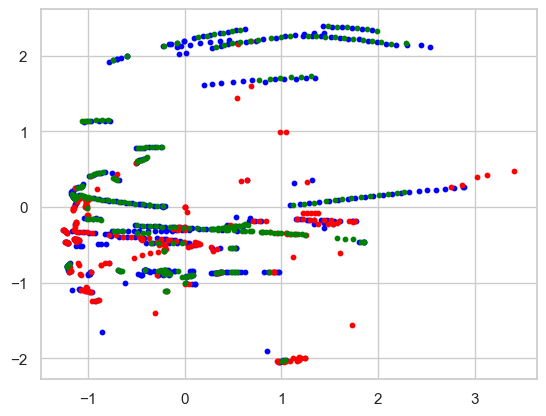

In [49]:
# Make a scatter plot to view the clusters
plt.scatter(df_s_hc_w.iloc[y_hc_w ==0,0],df_s_hc_w.iloc[y_hc_w ==0,1], s=10, c='blue')
plt.scatter(df_s_hc_w.iloc[y_hc_w ==1,0],df_s_hc_w.iloc[y_hc_w ==1,1], s=10, c='red')
plt.scatter(df_s_hc_w.iloc[y_hc_w ==2,0],df_s_hc_w.iloc[y_hc_w ==2,1], s=10, c='green')

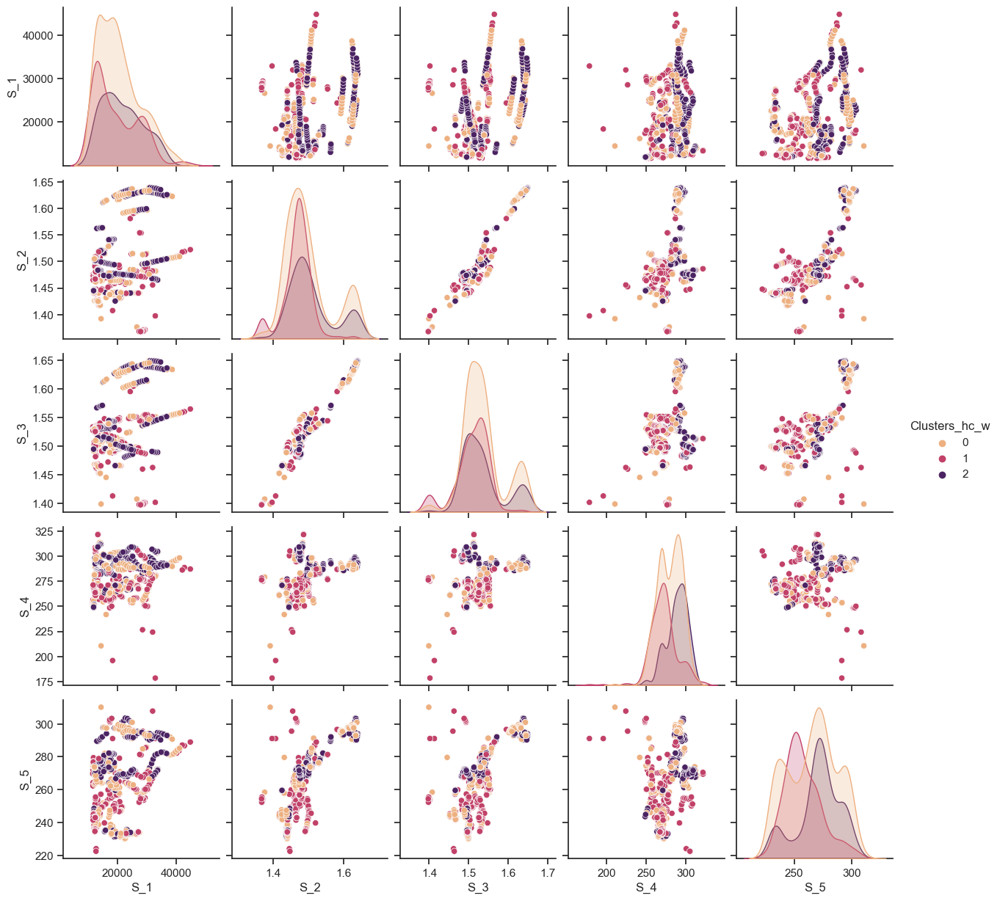

In [50]:
sns.set(style = 'ticks') # Set the background to ticks

data['Clusters_hc_w'] = y_hc_w

sns.pairplot(data, vars=['S_1','S_2','S_3','S_4','S_5'], hue = 'Clusters_hc_w', palette = 'flare') # Create a matrix scatterplot

<Axes: xlabel='Clusters_hc_w', ylabel='S_1'>

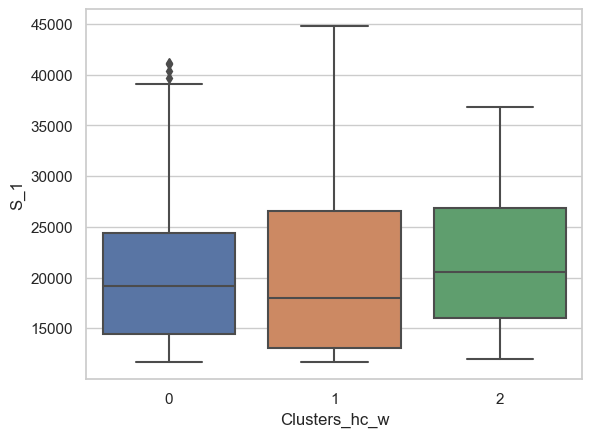

In [51]:
sns.set(style="whitegrid")
sns.boxplot(x=data['Clusters_hc_w'], y=data['S_1'])

<Axes: xlabel='Clusters_hc_w', ylabel='S_2'>

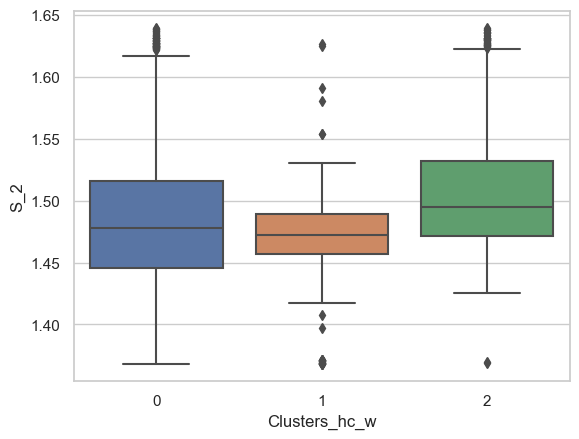

In [52]:
sns.set(style="whitegrid")
sns.boxplot(x=data['Clusters_hc_w'], y=data['S_2'])

<Axes: xlabel='Clusters_hc_w', ylabel='S_3'>

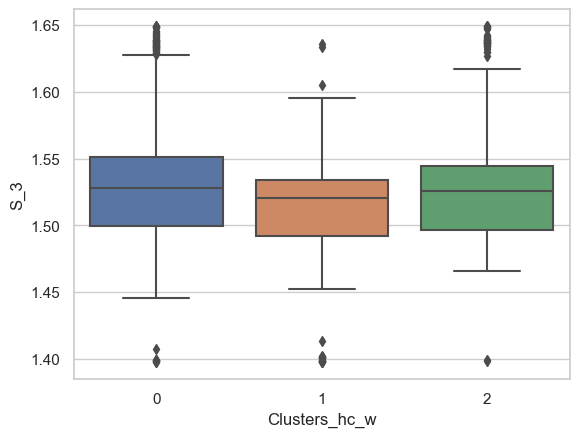

In [53]:
sns.set(style="whitegrid")
sns.boxplot(x=data['Clusters_hc_w'], y=data['S_3'])

**Comments**

From the above plots, we can clearly see that using the ward linkage had better clustering than the complete likage.

## **STEP 4**

Apply dimensionality reduction techniques.

**Principal Component Analysis (PCA) dimensionality reduction technique.**

First, Determine optimal number of PCA features

In [56]:
df_s.shape[1]

456

Text(0.5, 1.0, "Variance Explained by PCA's")

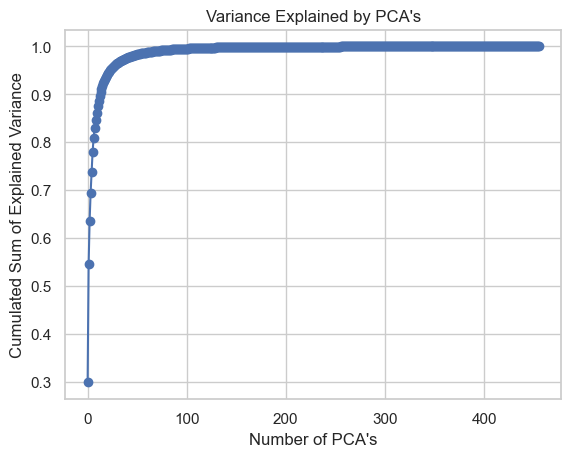

In [57]:
# Find the optimal number of PCA 
df_s1 = df_s.loc[:, 'S_1':'S_456'] # Define the required data for this analysis
from sklearn.decomposition import PCA
pca = PCA(n_components=df_s1.shape[1])
pca.fit(df_s1)
ratios = pca.explained_variance_ratio_
 
# Plot the explained variance ratios
x = np.arange(df_s1.shape[1])
plt.plot(x, np.cumsum(ratios), '-o')
plt.xlabel("Number of PCA's")
plt.ylabel("Cumulated Sum of Explained Variance")
plt.title("Variance Explained by PCA's")

In [58]:
pca.explained_variance_ratio_

array([2.98510956e-01, 2.46384503e-01, 9.03774208e-02, 5.85358388e-02,
       4.45426928e-02, 4.09910654e-02, 2.85520551e-02, 2.17269892e-02,
       1.71879579e-02, 1.48726932e-02, 1.37603480e-02, 1.13324942e-02,
       9.53109378e-03, 7.98711534e-03, 7.34260717e-03, 6.19265488e-03,
       5.52926748e-03, 4.81644022e-03, 4.59165960e-03, 4.11919557e-03,
       3.71164839e-03, 3.44965456e-03, 3.41290453e-03, 2.97402912e-03,
       2.64759186e-03, 2.50742249e-03, 2.20727064e-03, 1.94843984e-03,
       1.85582741e-03, 1.67686559e-03, 1.54670901e-03, 1.44660465e-03,
       1.39431862e-03, 1.30872565e-03, 1.25711388e-03, 1.17134498e-03,
       1.13362696e-03, 1.06363764e-03, 9.81000219e-04, 9.60223789e-04,
       8.82431358e-04, 8.31415042e-04, 8.29148298e-04, 7.83963914e-04,
       7.51133602e-04, 7.39325455e-04, 7.09698448e-04, 6.41966044e-04,
       5.99736857e-04, 5.30664428e-04, 5.24610087e-04, 5.18755790e-04,
       4.92162939e-04, 4.68018405e-04, 4.62371985e-04, 4.37176480e-04,
      

**Comment**

From the above, we can see that reducing the 456 features to about 50 features explained nearly 99% of the variability by considerably reducing the complexity of the dataset while using 50 features, with only a 1% loss of information. However, the use of 50 features is still a very high number, hence the need to consider a lower cummulative sum of explained variance. With 3 components, cummulative sum is about 63.49%, 5 components is about 73.8% and using 10 features will give us an 86.2% cummulative sum of the explained variance. For this application, we will be making use of 5 principal components.

In [59]:
# Importing PCA from Sklearn
from sklearn.decomposition import PCA

# Creating PCA object
pca1 = PCA(n_components=5)               
principalComponents = pca1.fit_transform(df_s1)
principalComponents

array([[ 23.26407063, -12.83219455,  -1.69531849,   9.00352904,
         -0.61084545],
       [ 23.5173573 , -12.62168444,  -1.95217546,   9.29208006,
         -1.61012568],
       [ 14.23099104, -21.69023342,   2.27052176,   0.83211501,
         15.02173125],
       ...,
       [  5.47607394,  -3.59444136,  -0.16239399,  -1.11613519,
         -3.39355647],
       [  6.46096542,  -3.46903158,   0.89294731,  -1.31007796,
         -3.82748089],
       [  6.54024174,  -4.04262299,   0.90653423,  -1.86003085,
         -3.19473363]])

In [60]:
#Creating the dataframe
PCA_data = pd.DataFrame(data = principalComponents, columns = ['PC1', 'PC2', 'PC3', 'PC4', 'PC5'])

# Print PCA data head
PCA_data.head()

,PC1,PC2,PC3,PC4,PC5
0,23.264071,-12.832195,-1.695318,9.003529,-0.610845
1,23.517357,-12.621684,-1.952175,9.292080,-1.610126
2,14.230991,-21.690233,2.270522,0.832115,15.021731
3,14.135704,-21.264668,3.373552,-1.717742,15.898264
4,-2.415874,29.282390,-15.958818,-1.611500,9.256735


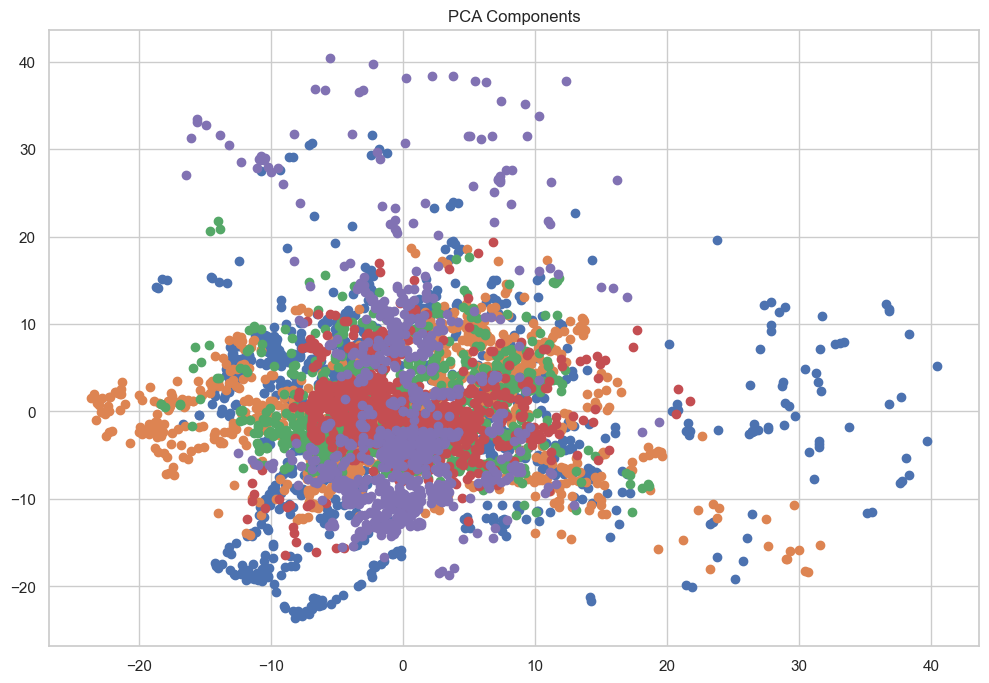

In [61]:
# Make a scatter plot of each of the components against the other
plt.figure(figsize=(12,8))
plt.title('PCA Components')
plt.scatter(principalComponents[:,0], principalComponents[:,1])
plt.scatter(principalComponents[:,1], principalComponents[:,2])
plt.scatter(principalComponents[:,2], principalComponents[:,3])
plt.scatter(principalComponents[:,3], principalComponents[:,4])
plt.scatter(principalComponents[:,4], principalComponents[:,0])

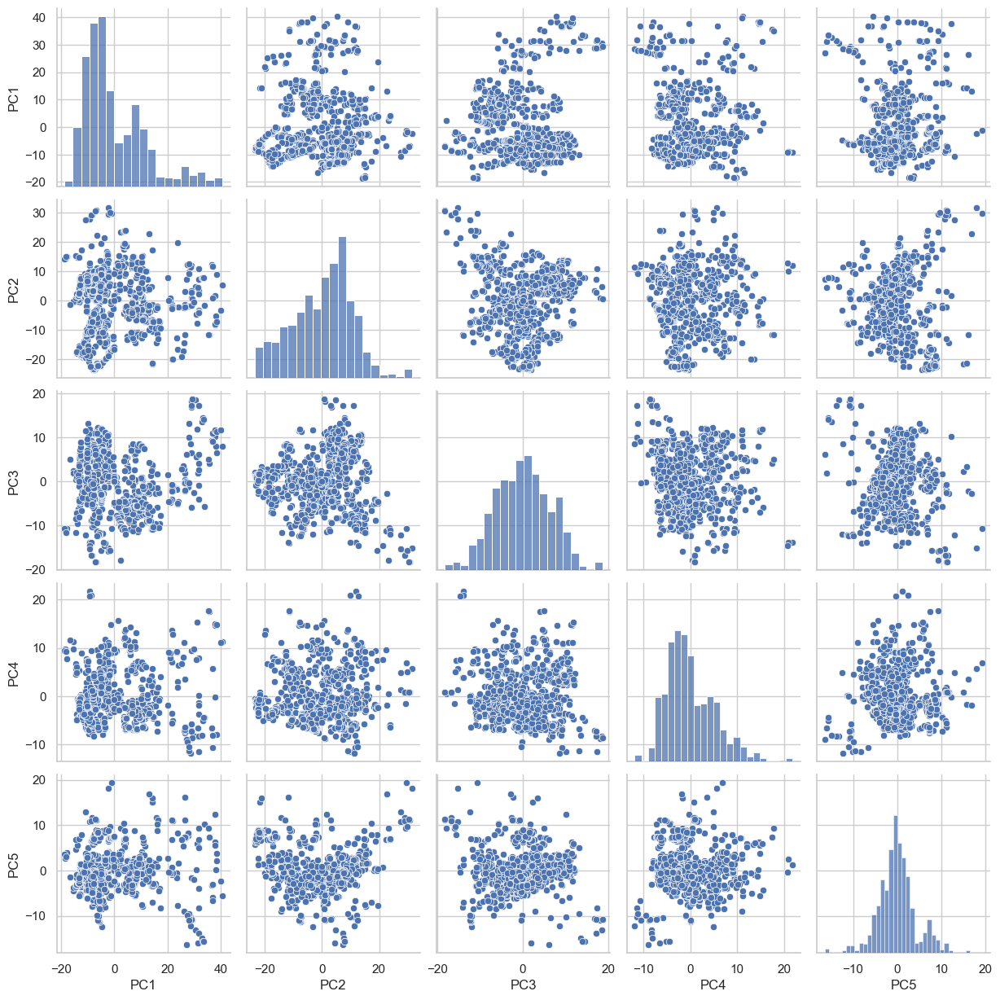

In [62]:
sns.pairplot(PCA_data)

**Reference Link:** https://www.google.com/amp/s/www.edureka.co/blog/principal-component-analysis/amp/

**t-Distributed Stochastic Neighbor Embedding (t-SNE) dimensionality reduction technique.**

In [63]:
# Importing TSNE from Sklearn
from sklearn.manifold import TSNE  
 
df_s2 = df_s.loc[:, 'S_1':'S_456'] # Define the required data for this analysis
# Creating TSNE object
tsne_em = TSNE(n_components=3, perplexity=30.0, n_iter=1000, verbose=1).fit_transform(df_s2)
 
#Creating the dataframe
t_SNE_data = pd.DataFrame(data=tsne_em, columns=['t-SNE1','t-SNE2', 't-SNE3'])
t_SNE_data.head()

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 876 samples in 0.002s...
[t-SNE] Computed neighbors for 876 samples in 0.142s...
[t-SNE] Computed conditional probabilities for sample 876 / 876
[t-SNE] Mean sigma: 7.080060
[t-SNE] KL divergence after 250 iterations with early exaggeration: 56.538250
[t-SNE] KL divergence after 1000 iterations: 0.192714


,t-SNE1,t-SNE2,t-SNE3
0,13.497310,-4.530183,-0.567435
1,13.501004,-4.502037,-0.534571
2,8.384658,-6.959220,-0.740812
3,8.374762,-6.968916,-0.748554
4,0.765515,9.800322,-7.763199


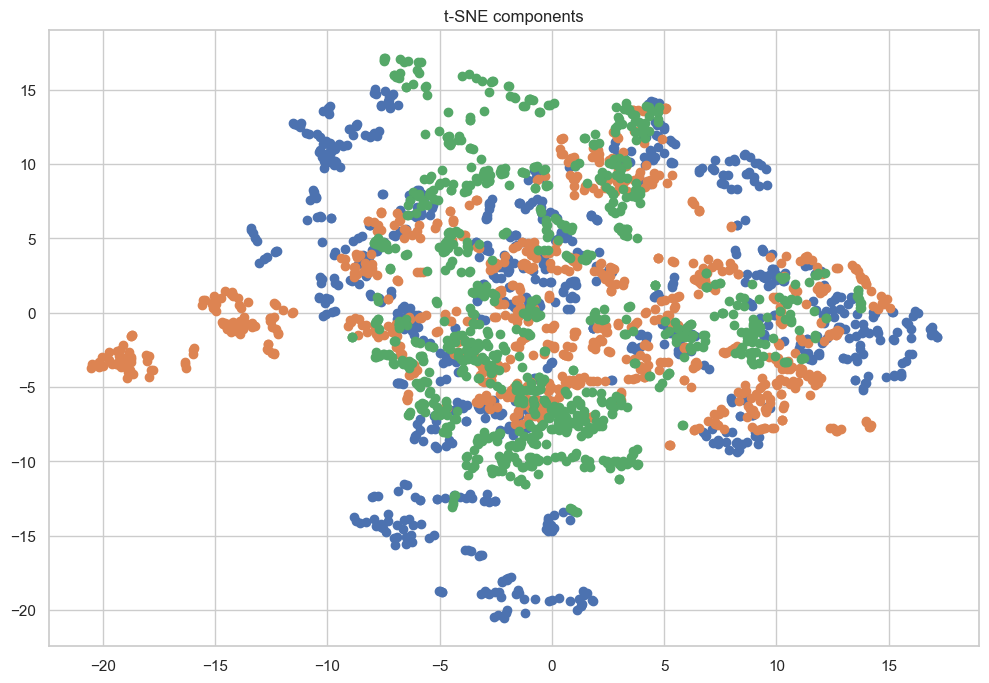

In [65]:
plt.figure(figsize=(12,8))
plt.title('t-SNE components')
plt.scatter(tsne_em[:,0], tsne_em[:,1])
plt.scatter(tsne_em[:,1], tsne_em[:,2])
plt.scatter(tsne_em[:,2], tsne_em[:,0])

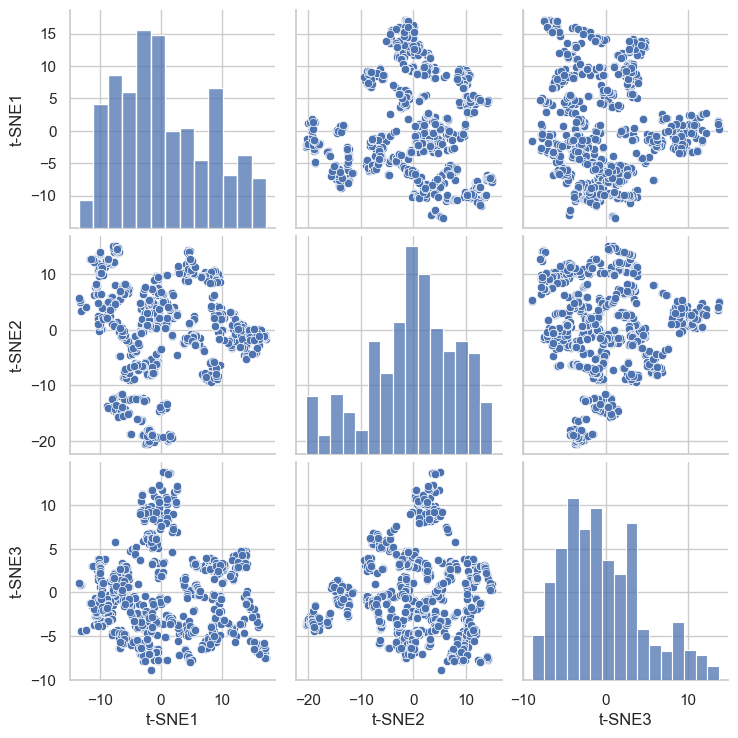

In [66]:
sns.pairplot(t_SNE_data)

**Create another t-SNE dataset using 2 components**

In [67]:
# Create another t-SNE dataset using 2 components
from sklearn.manifold import TSNE  

df_s2_2 = df_s.loc[:, 'S_1':'S_456'] # Define the required data for this analysis
# Creating TSNE object
tsne_em_2 = TSNE(n_components=2, perplexity=30.0, n_iter=1000, verbose=1).fit_transform(df_s2_2)

#Creating the dataframe
t_SNE_data_2 = pd.DataFrame(data=tsne_em_2, columns=['t-SNE1','t-SNE2'])
t_SNE_data_2.head()

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 876 samples in 0.003s...
[t-SNE] Computed neighbors for 876 samples in 0.072s...
[t-SNE] Computed conditional probabilities for sample 876 / 876
[t-SNE] Mean sigma: 7.080060
[t-SNE] KL divergence after 250 iterations with early exaggeration: 56.094940
[t-SNE] KL divergence after 1000 iterations: 0.252511


,t-SNE1,t-SNE2
0,35.286739,-11.789142
1,35.245419,-11.783138
2,28.293240,-15.732413
3,28.291206,-15.748468
4,2.384583,30.589140


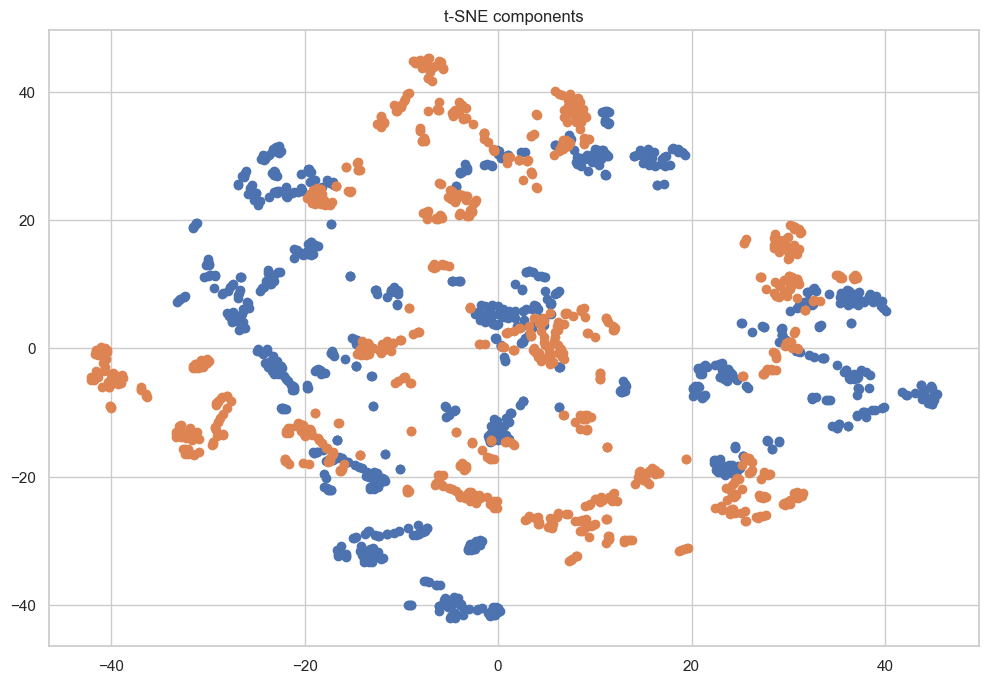

In [68]:
plt.figure(figsize=(12,8))
plt.title('t-SNE components')
plt.scatter(tsne_em_2[:,0], tsne_em_2[:,1])
plt.scatter(tsne_em_2[:,1], tsne_em_2[:,0])

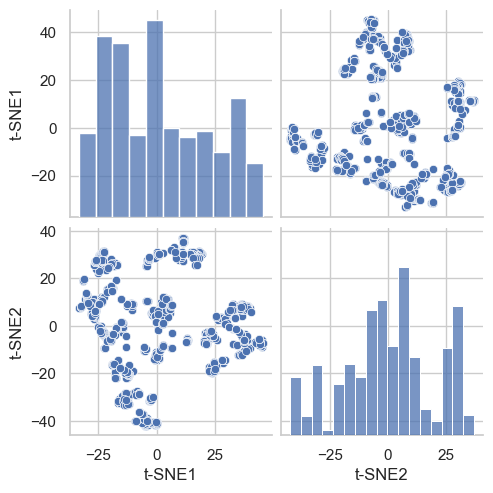

In [69]:
sns.pairplot(t_SNE_data_2)

**Reference Link:** https://www.reneshbedre.com/blog/tsne.html

 **Independent Component Analysis (ICA) dimensionality reduction technique**

In [70]:
# Importing ICP from Sklearn
from sklearn.decomposition import FastICA

df_s3 = df_s.loc[:, 'S_1':'S_456'] # Define the required data for this analysis
# Creating ICA object
ICA = FastICA(n_components=5)
ICA_Values=ICA.fit_transform(df_s3)
 
#Creating the dataframe
ICA_data=pd.DataFrame(data=ICA_Values, columns=['IC1','IC2', 'IC3', 'IC4', 'IC5'])
ICA_data.head()

C:\Users\EBEN\anaconda3\lib\site-packages\sklearn\decomposition\_fastica.py:542: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(


,IC1,IC2,IC3,IC4,IC5
0,-0.001155,0.017467,-0.025036,0.007754,-0.093734
1,0.003078,0.019963,-0.026362,0.001929,-0.095363
2,-0.087899,-0.009886,-0.011622,0.096087,-0.046277
3,-0.090171,-0.005137,-0.011593,0.107627,-0.032278
4,0.039581,-0.122993,-0.035972,0.037176,0.037052


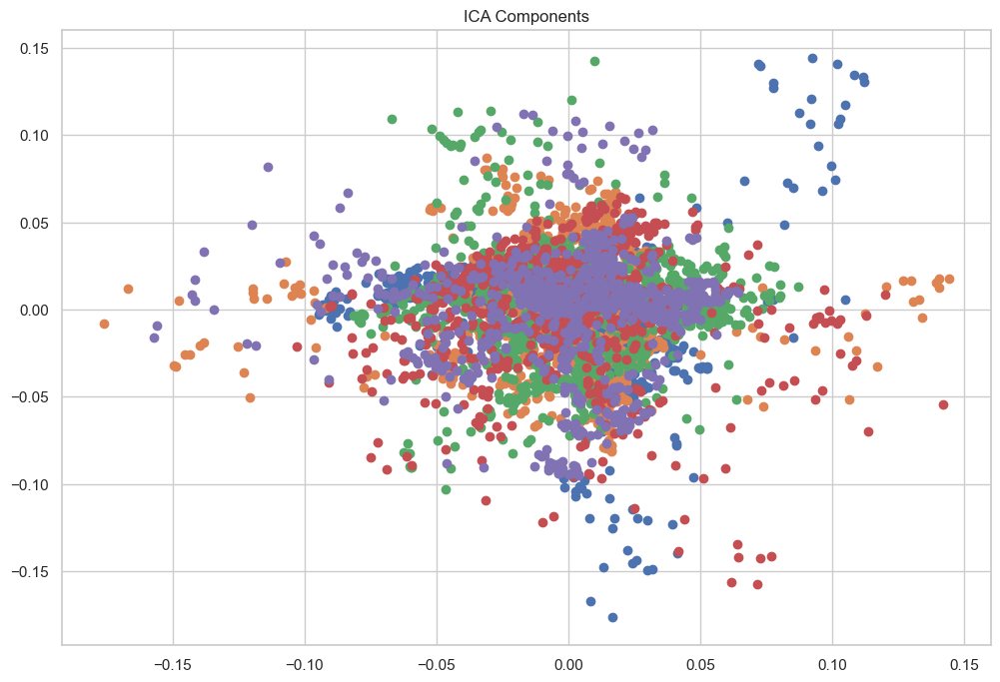

In [71]:
plt.figure(figsize=(12,8))
plt.title('ICA Components')
plt.scatter(ICA_Values[:,0], ICA_Values[:,1])
plt.scatter(ICA_Values[:,1], ICA_Values[:,2])
plt.scatter(ICA_Values[:,2], ICA_Values[:,3])
plt.scatter(ICA_Values[:,3], ICA_Values[:,4])
plt.scatter(ICA_Values[:,4], ICA_Values[:,0])

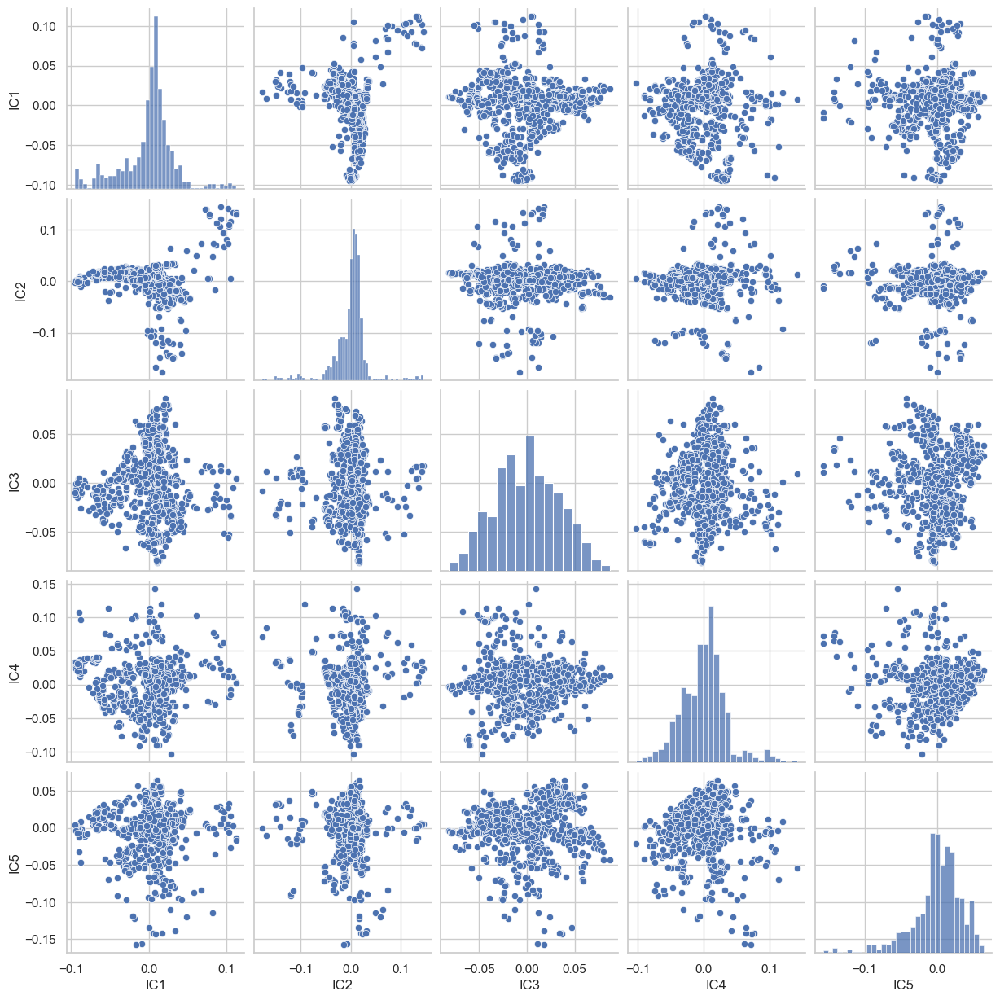

In [72]:
sns.pairplot(ICA_data)

**Create another ICA dataset using 3 components**

In [73]:
# Importing ICP from Sklearn
from sklearn.decomposition import FastICA

df_s3_2 = df_s.loc[:, 'S_1':'S_456'] # Define the required data for this analysis
# Creating ICA object
ICA_2 = FastICA(n_components=3)
ICA_Values_2=ICA_2.fit_transform(df_s3_2)
 
#Creating the dataframe
ICA_data_2=pd.DataFrame(data=ICA_Values_2, columns=['IC1','IC2', 'IC3'])
ICA_data_2.head()

C:\Users\EBEN\anaconda3\lib\site-packages\sklearn\decomposition\_fastica.py:542: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(


,IC1,IC2,IC3
0,-0.020510,0.052395,-0.055907
1,-0.019149,0.052541,-0.056879
2,-0.058869,0.035005,-0.043937
3,-0.060691,0.037392,-0.038780
4,0.120837,-0.032802,-0.011754


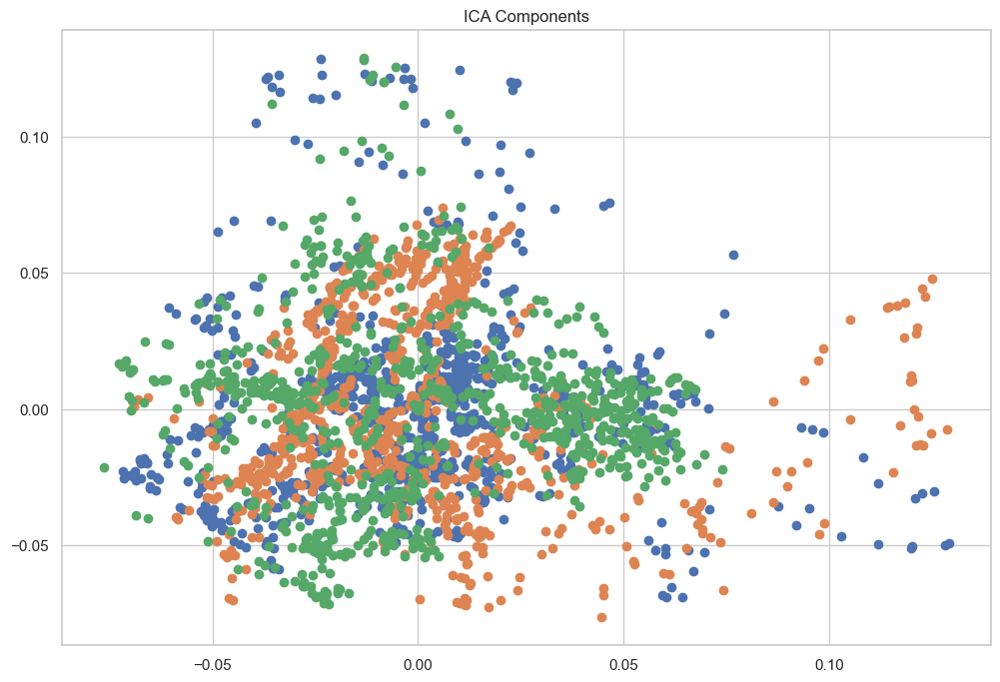

In [74]:
plt.figure(figsize=(12,8))
plt.title('ICA Components')
plt.scatter(ICA_Values_2[:,0], ICA_Values_2[:,1])
plt.scatter(ICA_Values_2[:,1], ICA_Values_2[:,2])
plt.scatter(ICA_Values_2[:,2], ICA_Values_2[:,0])

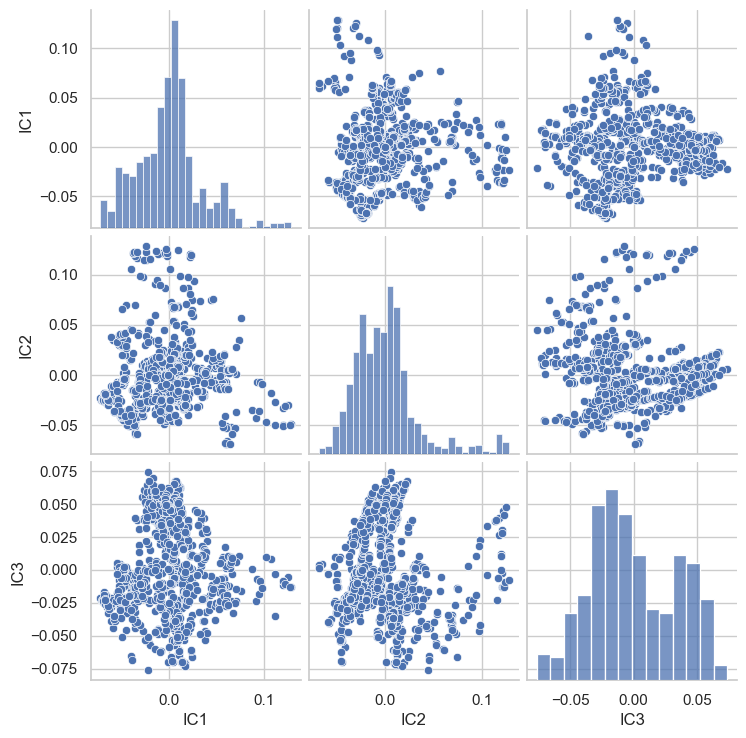

In [75]:
sns.pairplot(ICA_data_2)

**Reference Link:** https://thinkingneuron.com/how-to-perform-independent-component-analysisica-in-python/

## **STEP 4**

Apply Kmeans Clustering on reduced dataset

**Apply Kmeans on PCA data**

In [77]:
PCA_data_K = PCA_data.loc[:, 'PC1':'PC5'] # Define the required data for this analysis

In [78]:
#Using SSW to determine optimum number of clusters
from sklearn.cluster import KMeans
SSW_PCA = np.zeros(10) # Initialize the list SSW to be empty

for k in range(1,10):
    
    kmeans_for_PCA = KMeans(n_clusters = k, random_state=42).fit(PCA_data_K) # All the other K-Means options are defaulted
    
    SSW_PCA[k] = kmeans_for_PCA.inertia_ # Compute the sum of squares within


print('The SSW values are', SSW_PCA[1:10])

C:\Users\EBEN\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\EBEN\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(
C:\Users\EBEN\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\EBEN\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment v

The SSW values are [294938.90154404 209902.29657026 148800.17814838 124747.75189826
 101962.35080282  90476.6474545   81951.1201645   73016.90999166
  67187.72409304]


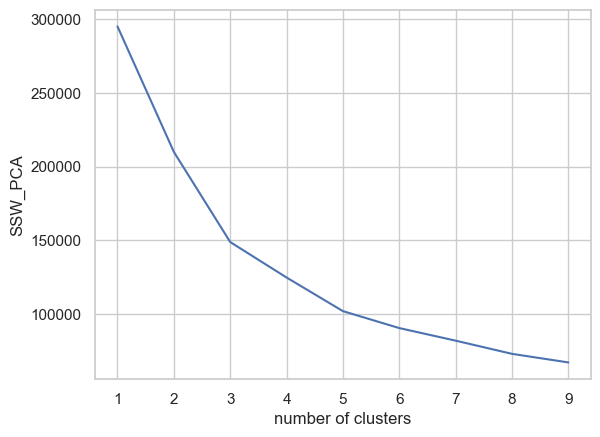

In [79]:
# Plot the SSW values and determine most optimum
clusters = range(1, 10)
plt.ylabel('SSW_PCA')
plt.xlabel('number of clusters')
plt.plot(clusters, SSW_PCA[1:10])

In [80]:
# Create a model using KMeans algorithm with the option of 2 clusters as questions stated
from sklearn.cluster import KMeans
PCA_data_kmeans = KMeans(n_clusters = 3, init = 'k-means++', n_init = 10, max_iter = 300, random_state = 42)
cluster_labels1 = PCA_data_kmeans.fit_predict(PCA_data_K)

print(PCA_data_kmeans.labels_)
print(PCA_data_kmeans.cluster_centers_)

C:\Users\EBEN\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(


[0 0 0 0 1 0 1 0 0 0 1 0 0 2 0 0 1 0 0 0 0 0 0 0 0 0 1 1 0 0 0 2 1 1 0 2 2
 2 0 0 0 2 2 2 0 2 2 1 1 1 2 1 0 0 0 1 1 1 2 2 2 0 0 0 0 0 0 0 0 0 0 1 1 1
 1 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 2 0 0 0 1 1 2 0 0 1 1 1 1 0 0 1 1 1 1 1
 0 1 1 1 1 1 2 1 1 0 1 1 1 1 0 1 1 1 1 1 1 1 0 0 0 0 1 1 1 1 1 1 1 0 0 1 1
 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 2 2 2 1 0 0 0 0 0 0 2 2 2
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 2 2 2 1 1 1 1 1 1 2 1 0 2 2 1 1 1 0
 0 0 0 0 0 2 2 1 2 2 1 2 2 2 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 2 2 2 2
 0 2 0 0 0 0 1 1 0 0 0 1 1 1 0 0 0 0 0 0 0 1 1 1 1 1 0 0 1 1 1 1 1 0 0 0 0
 0 1 1 1 1 0 0 0 1 0 0 1 0 0 0 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0
 0 0 0 0 0 0 1 1 1 0 0 0 0 0 1 1 1 1 1 2 1 1 0 0 1 1 1 1 1 1 0 0 0 0 0 1 0
 0 1 2 1 1 2 1 1 1 2 0 0 1 1 0 1 0 1 0 1 1 2 1 1 1 1 2 1 2 0 2 1 2 1 1 1 2
 2 1 2 2 2 1 0 0 2 1 0 1 2 1 1 2 1 2 1 0 1 1 1 1 1 1 1 2 0 0 0 1 2 1 1 1 2
 0 0 1 1 1 2 1 1 1 2 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 2 2 2 2 2 2 

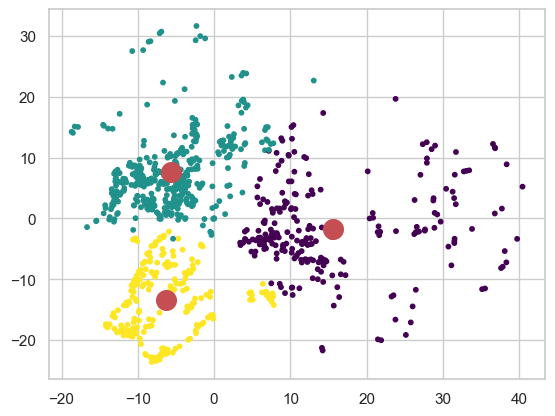

In [81]:
# Make a scatter plot to view clusters
plt.scatter(PCA_data_K.iloc[:, 0], PCA_data_K.iloc[:, 1], c=cluster_labels1, s=10, cmap='viridis')
plt.scatter(PCA_data_kmeans.cluster_centers_[:, 0], PCA_data_kmeans.cluster_centers_[:, 1], c='r', s=200);

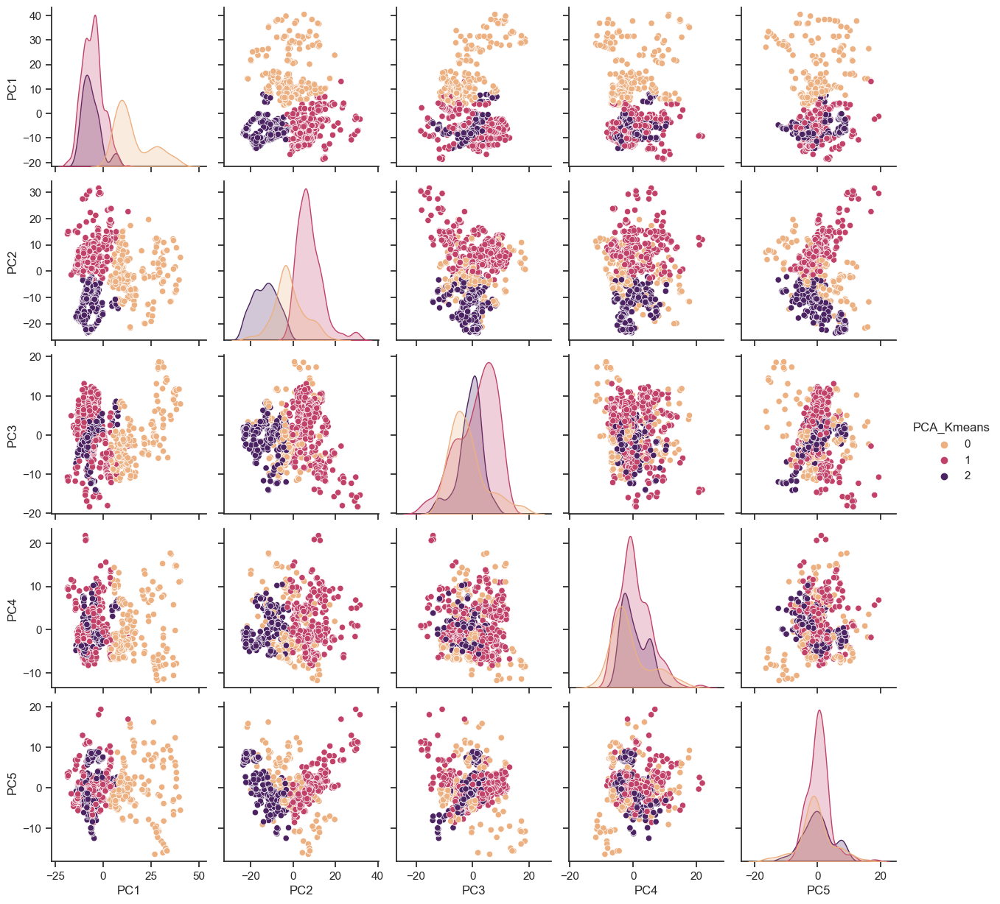

In [82]:
# Add the KMeans labels to the Pandas Dataframe and plot all data colored by cluster label
sns.set(style = 'ticks') # Set the background to ticks

PCA_data['PCA_Kmeans'] = cluster_labels1
sns.pairplot(PCA_data, vars = ['PC1', 'PC2', 'PC3', 'PC4', 'PC5'], hue = 'PCA_Kmeans', palette = 'flare' )# Create a matrix scatterplot


<Axes: xlabel='PCA_Kmeans', ylabel='PC1'>

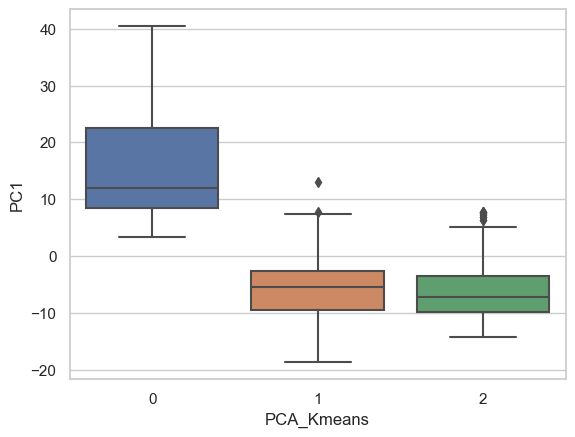

In [83]:
sns.set(style="whitegrid")
sns.boxplot(x=PCA_data['PCA_Kmeans'], y=PCA_data['PC1'])

<Axes: xlabel='PCA_Kmeans', ylabel='PC2'>

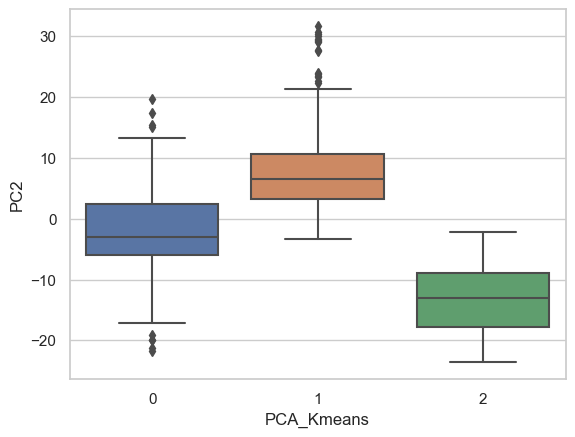

In [84]:
sns.set(style="whitegrid")
sns.boxplot(x=PCA_data['PCA_Kmeans'], y=PCA_data['PC2'])

<Axes: xlabel='PCA_Kmeans', ylabel='PC3'>

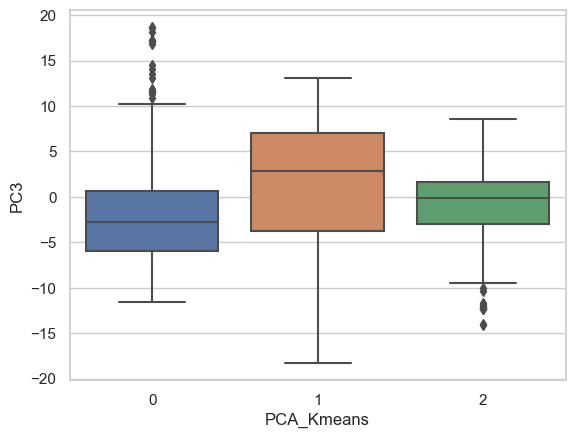

In [85]:
sns.set(style="whitegrid")
sns.boxplot(x=PCA_data['PCA_Kmeans'], y=PCA_data['PC3'])

<Axes: xlabel='PCA_Kmeans', ylabel='PC4'>

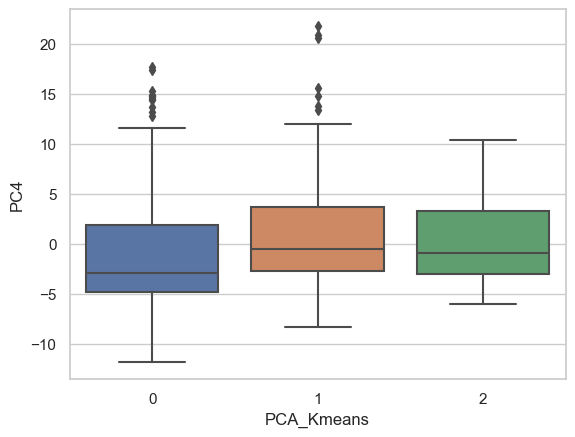

In [86]:
sns.set(style="whitegrid")
sns.boxplot(x=PCA_data['PCA_Kmeans'], y=PCA_data['PC4'])

<Axes: xlabel='PCA_Kmeans', ylabel='PC5'>

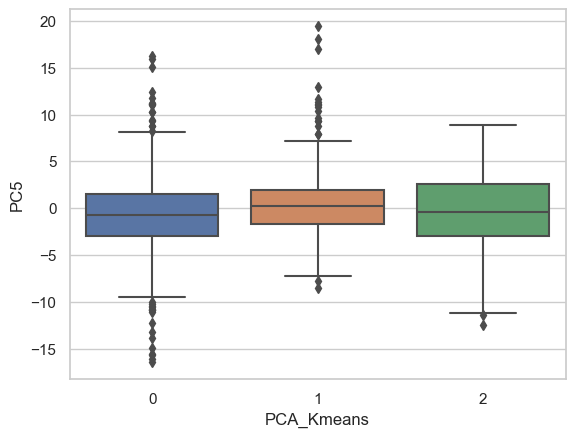

In [87]:
sns.set(style="whitegrid")
sns.boxplot(x=PCA_data['PCA_Kmeans'], y=PCA_data['PC5'])

**Apply Kmeans on ICA data**

In [88]:
ICA_data_K = ICA_data.loc[:, 'IC1':'IC5'] # Define the required data for this analysis

In [89]:
#Using SSW to determine optimum number of clusters
from sklearn.cluster import KMeans
SSW_ICA = np.zeros(10) # Initialize the list SSW to be empty

for k in range(1,10):
    
    kmeans_for_ICA = KMeans(n_clusters = k, random_state=42).fit(ICA_data_K) # All the other K-Means options are defaulted
    
    SSW_ICA[k] = kmeans_for_ICA.inertia_ # Compute the sum of squares within


print('The SSW values are', SSW_ICA[1:10])

C:\Users\EBEN\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\EBEN\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(
C:\Users\EBEN\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\EBEN\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment v

The SSW values are [5.         4.18437023 3.57340264 3.06823612 2.63481958 2.24078986
 1.88857848 1.6993211  1.5048174 ]


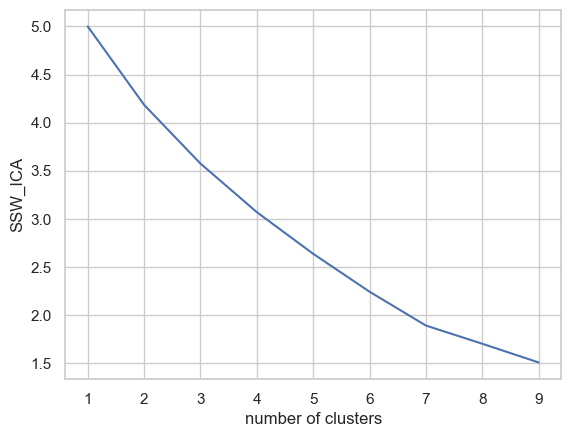

In [78]:
# Plot the SSW values and determine most optimum
clusters = range(1, 10)
plt.ylabel('SSW_ICA')
plt.xlabel('number of clusters')
plt.plot(clusters, SSW_ICA[1:10])

In [90]:
# Create a model using KMeans algorithm with the option of 5 clusters as determined
from sklearn.cluster import KMeans
ICA_data_kmeans = KMeans(n_clusters = 7, init = 'k-means++', n_init = 10, max_iter = 300, random_state = 42)
cluster_labels2 = ICA_data_kmeans.fit_predict(ICA_data_K)

print(ICA_data_kmeans.labels_)
print(ICA_data_kmeans.cluster_centers_)

C:\Users\EBEN\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(


[6 6 2 2 0 6 0 6 3 3 0 3 3 6 3 6 0 3 3 3 3 3 3 3 3 3 3 1 3 3 3 6 3 3 3 6 6
 6 3 3 3 6 6 6 3 6 6 3 3 3 6 1 3 3 2 0 3 3 6 6 6 3 3 6 6 6 3 3 3 3 6 0 3 3
 3 6 6 6 6 3 6 6 6 3 3 6 6 6 6 6 1 5 3 4 3 1 1 5 3 4 5 5 0 5 6 3 1 1 0 1 0
 3 1 1 5 0 5 5 1 1 3 1 1 1 5 3 5 1 1 1 1 1 1 3 3 3 3 1 1 1 1 1 1 1 3 3 1 1
 1 1 1 1 5 1 0 0 1 1 1 1 1 0 1 1 1 1 1 1 1 1 3 3 5 5 5 1 3 3 3 3 3 3 5 5 5
 6 6 5 5 3 3 3 3 3 3 3 3 3 3 3 3 1 4 1 5 5 5 1 1 1 1 1 1 1 1 4 1 5 1 1 1 3
 3 3 3 3 3 5 5 1 5 5 1 5 5 5 3 3 1 5 3 3 3 3 3 3 3 3 3 3 3 3 1 3 3 5 5 5 5
 4 5 4 6 6 6 1 1 4 4 4 1 1 1 6 6 6 6 6 6 6 1 1 1 5 5 3 6 1 1 5 5 5 3 3 3 6
 6 6 6 6 6 6 5 6 6 6 6 6 6 6 6 1 1 1 5 1 1 1 1 1 1 1 1 1 1 1 1 3 3 3 6 4 6
 5 5 5 5 5 5 1 5 5 4 3 4 3 6 1 1 1 0 1 2 1 0 3 4 0 1 1 1 5 5 4 4 4 4 3 3 3
 3 1 2 1 1 2 0 0 0 2 3 3 3 0 3 3 3 3 3 0 3 5 1 0 1 1 2 1 2 3 2 1 2 1 5 5 2
 2 1 2 2 5 1 3 6 5 5 3 1 2 1 3 2 1 2 0 3 1 0 1 1 0 1 1 2 6 3 4 1 2 1 1 1 2
 4 3 1 0 1 2 1 1 1 5 1 1 1 2 1 3 3 1 1 1 1 3 3 5 5 1 1 1 3 3 3 3 3 3 3 3 3
 3 3 3 1 1 1 2 2 2 2 2 2 

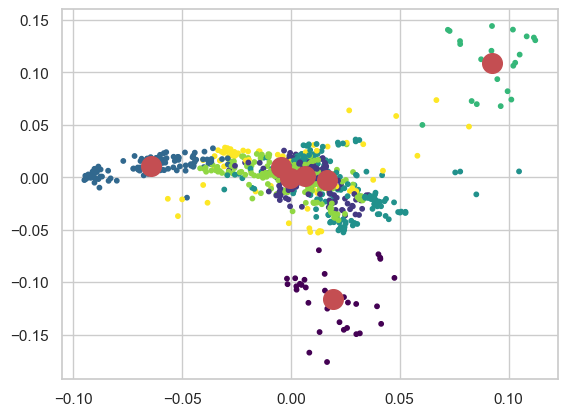

In [91]:
# Make a scatter plot to view clusters
plt.scatter(ICA_data_K.iloc[:, 0], ICA_data_K.iloc[:, 1], c=cluster_labels2, s=10, cmap='viridis')
plt.scatter(ICA_data_kmeans.cluster_centers_[:, 0], ICA_data_kmeans.cluster_centers_[:, 1], c='r', s=200);

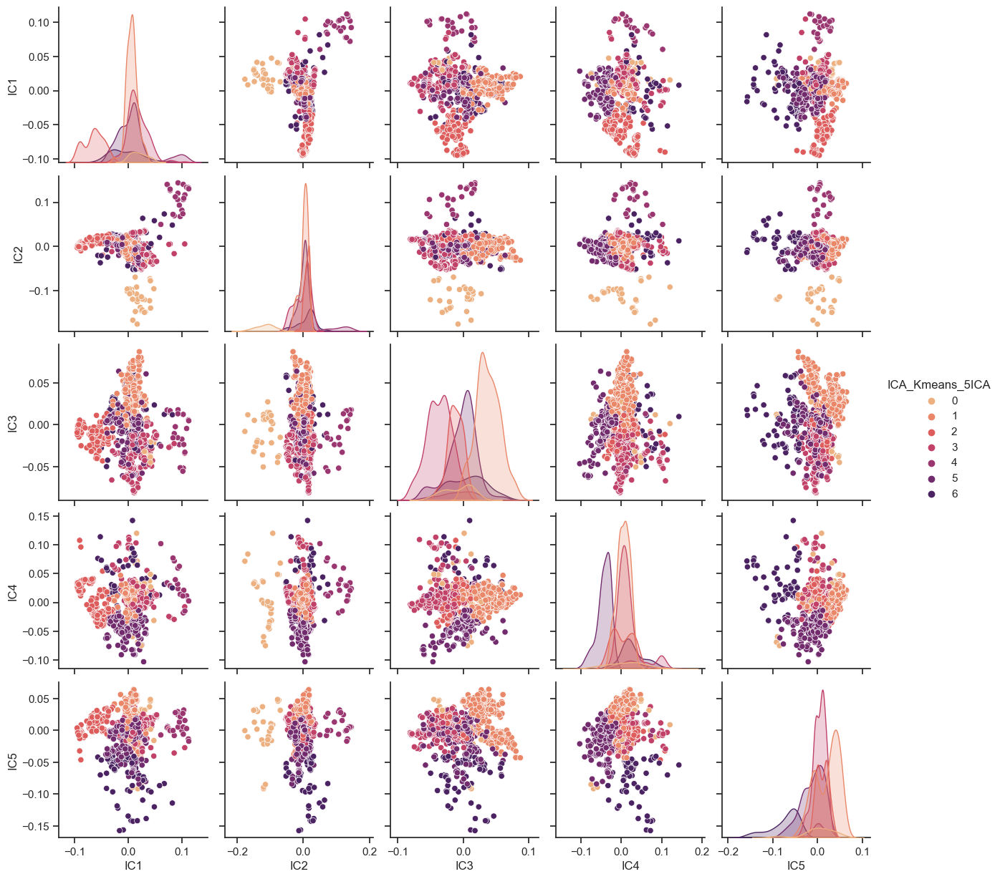

In [92]:
                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                # Add the KMeans labels to the Pandas Dataframe and plot all data colored by cluster label
sns.set(style = 'ticks') # Set the background to ticks

ICA_data['ICA_Kmeans_5ICA'] = cluster_labels2
sns.pairplot(ICA_data, vars = ['IC1', 'IC2', 'IC3', 'IC4', 'IC5'], hue = 'ICA_Kmeans_5ICA', palette = 'flare' )# Create a matrix scatterplot


<Axes: xlabel='ICA_Kmeans_5ICA', ylabel='IC1'>

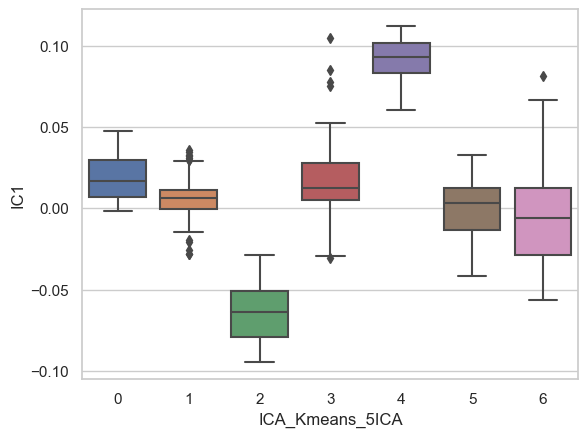

In [93]:
sns.set(style="whitegrid")
sns.boxplot(x=ICA_data['ICA_Kmeans_5ICA'], y=ICA_data['IC1'])

<Axes: xlabel='ICA_Kmeans_5ICA', ylabel='IC2'>

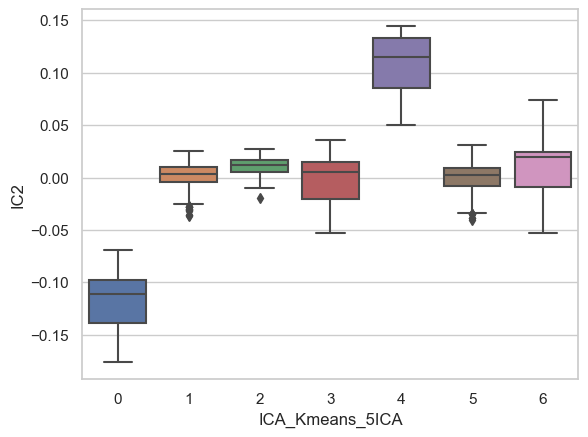

In [94]:
sns.set(style="whitegrid")
sns.boxplot(x=ICA_data['ICA_Kmeans_5ICA'], y=ICA_data['IC2'])

<Axes: xlabel='ICA_Kmeans_5ICA', ylabel='IC3'>

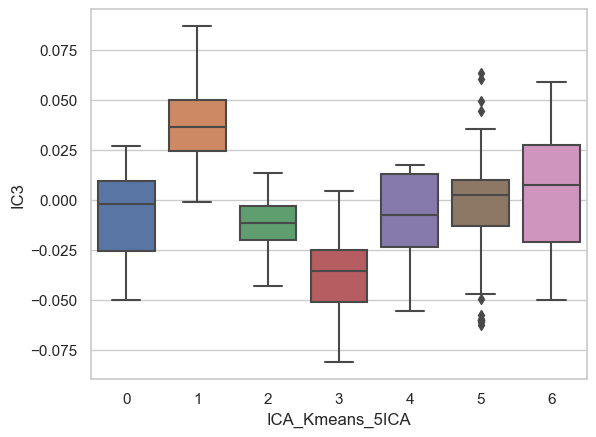

In [95]:
sns.set(style="whitegrid")
sns.boxplot(x=ICA_data['ICA_Kmeans_5ICA'], y=ICA_data['IC3'])

<Axes: xlabel='ICA_Kmeans_5ICA', ylabel='IC4'>

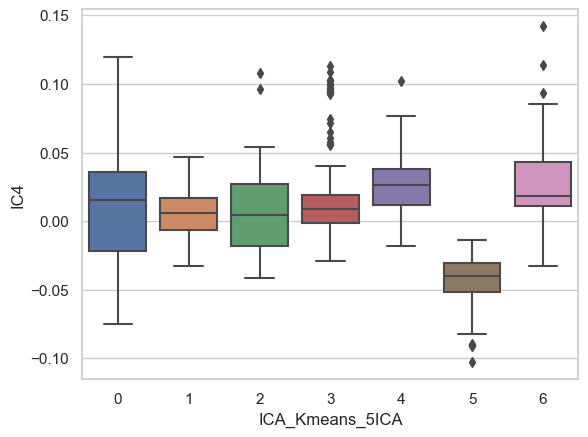

In [96]:
sns.set(style="whitegrid")
sns.boxplot(x=ICA_data['ICA_Kmeans_5ICA'], y=ICA_data['IC4'])

<Axes: xlabel='ICA_Kmeans_5ICA', ylabel='IC5'>

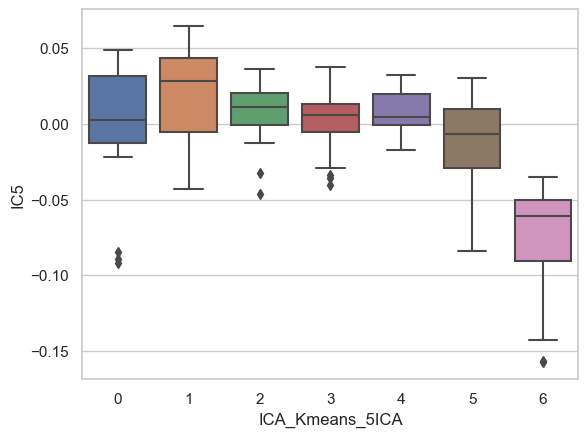

In [97]:
sns.set(style="whitegrid")
sns.boxplot(x=ICA_data['ICA_Kmeans_5ICA'], y=ICA_data['IC5'])

**Apply Kmeans using the datset with 3 ICA components**

In [98]:
ICA_data_K_3ica = ICA_data_2.loc[:, 'IC1':'IC3'] # Define the required data for this analysis
#Using SSW to determine optimum number of clusters
from sklearn.cluster import KMeans
SSW_ICA_3ica = np.zeros(10) # Initialize the list SSW to be empty

for k in range(1,10):
    
    kmeans_for_ICA_3ica = KMeans(n_clusters = k, random_state=42).fit(ICA_data_K_3ica) # All the other K-Means options are defaulted
    
    SSW_ICA_3ica[k] = kmeans_for_ICA_3ica.inertia_ # Compute the sum of squares within


print('The SSW values are', SSW_ICA_3ica[1:10])

C:\Users\EBEN\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\EBEN\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(
C:\Users\EBEN\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\EBEN\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment v

The SSW values are [3.         2.1970001  1.60868357 1.13111626 0.87767473 0.75287201
 0.67308912 0.59867127 0.53299265]


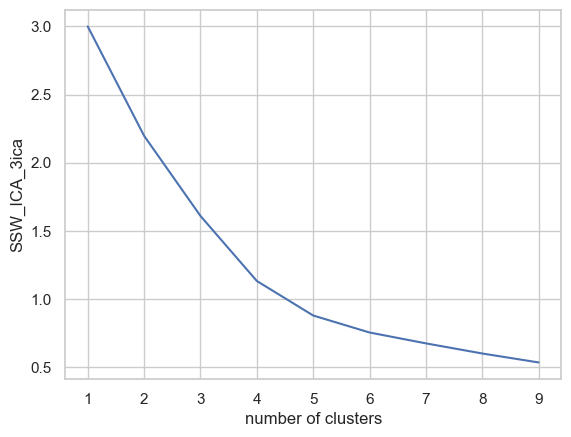

In [99]:
# Plot the SSW values and determine most optimum
clusters = range(1, 10)
plt.ylabel('SSW_ICA_3ica')
plt.xlabel('number of clusters')
plt.plot(clusters, SSW_ICA_3ica[1:10])

In [100]:
# Create a model using KMeans algorithm with the ICA dataset that has 3 components

from sklearn.cluster import KMeans
ICA_data_kmeans1_3ica = KMeans(n_clusters = 4, init = 'k-means++', n_init = 10, max_iter = 300, random_state = 42)
cluster_labels3_3ica = ICA_data_kmeans1_3ica.fit_predict(ICA_data_K_3ica)

print(ICA_data_kmeans1_3ica.labels_)
print(ICA_data_kmeans1_3ica.cluster_centers_)

C:\Users\EBEN\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(


[1 1 3 3 2 1 2 1 2 1 2 2 2 3 1 1 2 1 2 1 1 1 1 1 1 1 0 2 2 2 2 3 2 2 2 3 3
 3 2 2 2 3 3 3 2 3 3 2 2 2 3 2 2 1 2 2 2 2 3 3 3 2 2 3 3 3 2 2 2 2 1 2 2 2
 2 3 1 1 1 1 1 1 1 2 2 1 1 1 2 1 0 2 2 1 2 0 0 2 1 1 2 2 2 0 1 1 0 0 2 0 2
 2 0 0 0 2 0 3 0 0 2 0 0 0 2 2 2 0 0 0 0 0 0 2 2 2 2 0 0 0 0 0 0 0 2 2 0 0
 0 0 0 0 3 0 2 2 0 0 0 0 0 2 0 0 0 0 0 0 0 0 2 2 3 3 3 0 2 2 2 2 2 2 3 3 3
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 0 1 0 3 3 3 0 0 0 0 0 0 0 0 1 3 3 0 0 0 2
 2 2 2 2 2 3 3 0 3 3 0 3 3 3 2 2 0 0 2 2 2 2 2 2 2 2 2 2 2 2 0 2 2 3 3 3 3
 1 3 1 1 1 1 0 0 1 1 1 0 0 0 1 1 1 1 1 1 1 0 0 0 0 0 2 1 0 0 0 0 0 2 2 2 1
 1 0 0 0 0 2 2 1 0 1 1 0 1 1 1 0 0 0 2 0 0 0 0 0 0 0 0 0 0 0 0 2 2 2 1 1 1
 2 2 2 2 2 2 0 0 0 1 2 1 2 1 0 0 0 2 0 3 0 2 1 1 2 0 0 0 0 0 1 1 1 1 2 2 1
 1 0 3 0 0 3 2 2 2 3 2 2 2 2 2 2 2 2 2 2 2 3 0 2 0 0 3 0 3 2 3 0 3 0 0 0 3
 3 0 3 3 3 0 2 1 3 2 2 0 3 0 2 3 0 3 2 1 0 2 0 0 2 0 0 3 1 2 1 0 3 0 0 0 3
 1 1 0 2 0 3 0 0 0 3 0 0 0 3 0 2 2 0 0 0 0 2 2 0 0 0 0 0 2 2 2 2 2 2 2 2 2
 2 2 2 0 0 0 3 3 3 3 3 3 

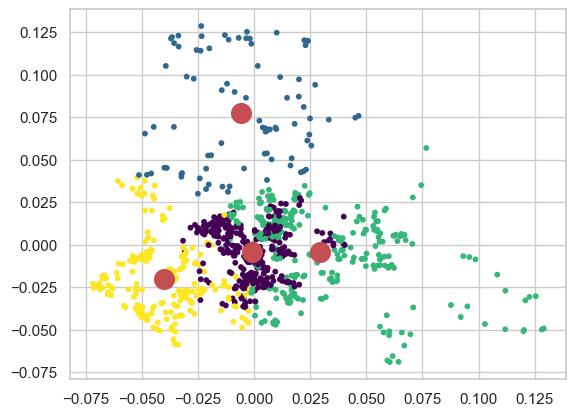

In [101]:
# Make a scatter plot to view clusters
plt.scatter(ICA_data_K_3ica.iloc[:, 0], ICA_data_K_3ica.iloc[:, 1], c=cluster_labels3_3ica, s=10, cmap='viridis')
plt.scatter(ICA_data_kmeans1_3ica.cluster_centers_[:, 0], ICA_data_kmeans1_3ica.cluster_centers_[:, 1], c='r', s=200);

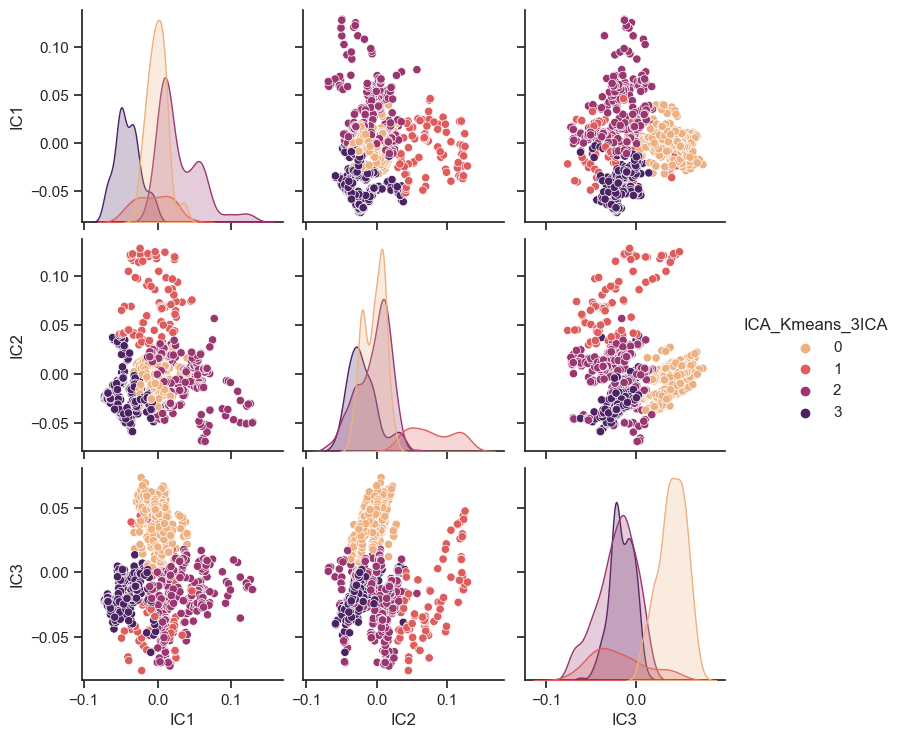

In [102]:
# Add the KMeans labels to the Pandas Dataframe and plot all data colored by cluster label
sns.set(style = 'ticks') # Set the background to ticks

ICA_data_2['ICA_Kmeans_3ICA'] = cluster_labels3_3ica
sns.pairplot(ICA_data_2, vars = ['IC1', 'IC2', 'IC3'], hue = 'ICA_Kmeans_3ICA', palette = 'flare' )# Create a matrix scatterplot

<Axes: xlabel='ICA_Kmeans_3ICA', ylabel='IC1'>

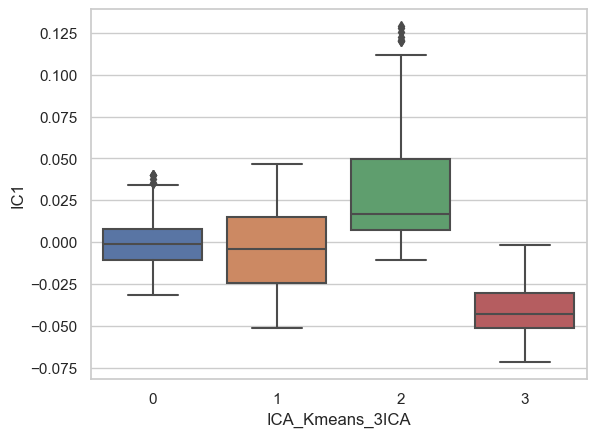

In [103]:
sns.set(style="whitegrid")
sns.boxplot(x=ICA_data_2['ICA_Kmeans_3ICA'], y=ICA_data_2['IC1'])

<Axes: xlabel='ICA_Kmeans_3ICA', ylabel='IC2'>

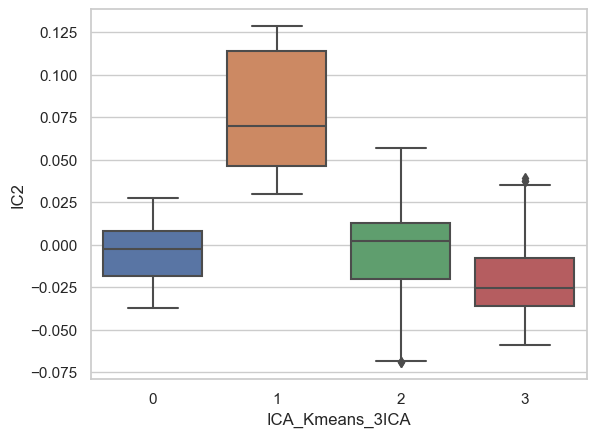

In [104]:
sns.set(style="whitegrid")
sns.boxplot(x=ICA_data_2['ICA_Kmeans_3ICA'], y=ICA_data_2['IC2'])

<Axes: xlabel='ICA_Kmeans_3ICA', ylabel='IC3'>

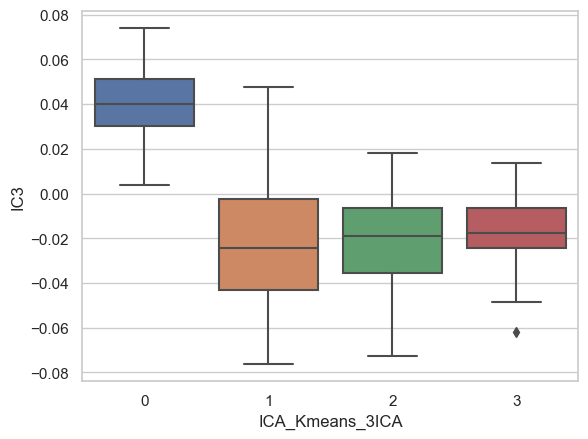

In [105]:
sns.set(style="whitegrid")
sns.boxplot(x=ICA_data_2['ICA_Kmeans_3ICA'], y=ICA_data_2['IC3'])

**Comments**

Although from the above boxplots, it was difficult to select which was more distinct as here were significant overlap in both, we can however deduce that using 3 number of components has more distinct clustering compared to when using 5 independent components. This clearly is supported by the matrix plot having little overlap in the data. 

**Apply Kmeans on t-SNE data**

In [106]:
t_SNE_data_K = t_SNE_data[['t-SNE1','t-SNE2', 't-SNE3']] # Define the required data for this analysis

In [107]:
#Using SSW to determine optimum number of clusters
from sklearn.cluster import KMeans
SSW_t_SNE = np.zeros(10) # Initialize the list SSW to be empty

for k in range(1,10):
    
    kmeans_for_TSNE = KMeans(n_clusters = k, random_state=42).fit(t_SNE_data_K) # All the other K-Means options are defaulted
    
    SSW_t_SNE[k] = kmeans_for_TSNE.inertia_ # Compute the sum of squares within


print('The SSW values are', SSW_t_SNE[1:10])

C:\Users\EBEN\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\EBEN\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(
C:\Users\EBEN\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\EBEN\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment v

The SSW values are [132792.171875    88103.6484375   56365.83203125  41865.48828125
  31032.55859375  24288.28515625  20925.20703125  18207.94335938
  16313.54785156]


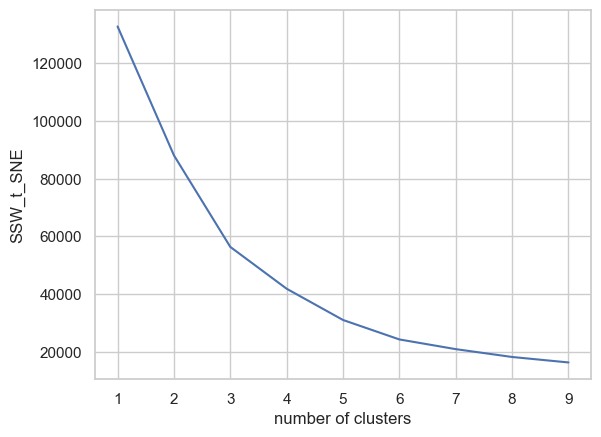

In [108]:
# Plot the SSW values and determine most optimum
clusters = range(1, 10)
plt.ylabel('SSW_t_SNE')
plt.xlabel('number of clusters')
plt.plot(clusters, SSW_t_SNE[1:10])

In [109]:
# Create a model using KMeans algorithm with the option of 3 clusters as determined
from sklearn.cluster import KMeans
t_SNE_data_kmeans = KMeans(n_clusters = 3, init = 'k-means++', n_init = 10, max_iter = 300, random_state = 42)
cluster_labels4 = t_SNE_data_kmeans.fit_predict(t_SNE_data_K)

print(t_SNE_data_kmeans.labels_)
print(t_SNE_data_kmeans.cluster_centers_)

C:\Users\EBEN\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(


[2 2 2 2 0 2 0 2 2 2 0 2 2 2 2 2 0 2 2 2 2 2 2 2 2 2 0 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 0 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 0 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 0 1 2 2 2 0 0 1 2 2 1 1 0 1 2 2 0 0 0 0 0
 2 0 0 0 0 0 1 0 0 2 0 0 0 1 2 1 0 0 0 0 0 0 2 2 2 2 0 0 0 0 0 0 0 2 2 0 0
 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 2 1 1 1 0 2 2 2 2 2 2 1 1 1
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 0 2 0 1 1 1 0 0 0 0 0 0 0 0 2 0 1 0 0 0 2
 2 2 2 2 2 1 1 0 1 1 0 1 1 1 2 2 0 0 2 2 2 2 2 2 2 2 2 2 2 2 0 2 2 1 1 1 1
 2 1 2 2 2 2 0 0 2 2 2 0 0 0 2 2 2 2 2 2 2 0 0 0 1 1 2 2 0 0 1 1 1 2 2 2 2
 2 0 0 0 0 2 2 2 0 2 2 0 2 2 2 0 0 0 2 0 0 0 0 0 0 0 0 0 0 0 0 2 2 2 2 2 2
 2 2 2 2 2 2 0 1 1 2 2 2 2 2 0 0 0 0 0 1 0 0 2 2 0 0 0 0 0 0 2 2 2 2 2 0 2
 2 0 1 0 0 1 0 0 0 1 2 2 0 0 2 0 2 0 2 0 0 1 0 0 0 0 1 0 1 2 1 0 1 0 0 0 1
 1 0 1 1 1 0 2 2 1 1 2 0 1 0 0 1 0 1 0 2 0 0 0 0 0 0 0 1 2 2 2 0 1 0 0 0 1
 2 2 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 1 1 1 1 1 1 

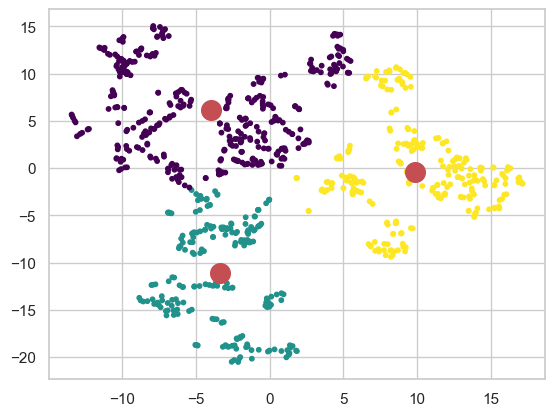

In [110]:
# Make a scatter plot to view clusters
plt.scatter(t_SNE_data_K.iloc[:, 0], t_SNE_data_K.iloc[:, 1], c=cluster_labels4, s=10, cmap='viridis')
plt.scatter(t_SNE_data_kmeans.cluster_centers_[:, 0], t_SNE_data_kmeans.cluster_centers_[:, 1], c='r', s=200);

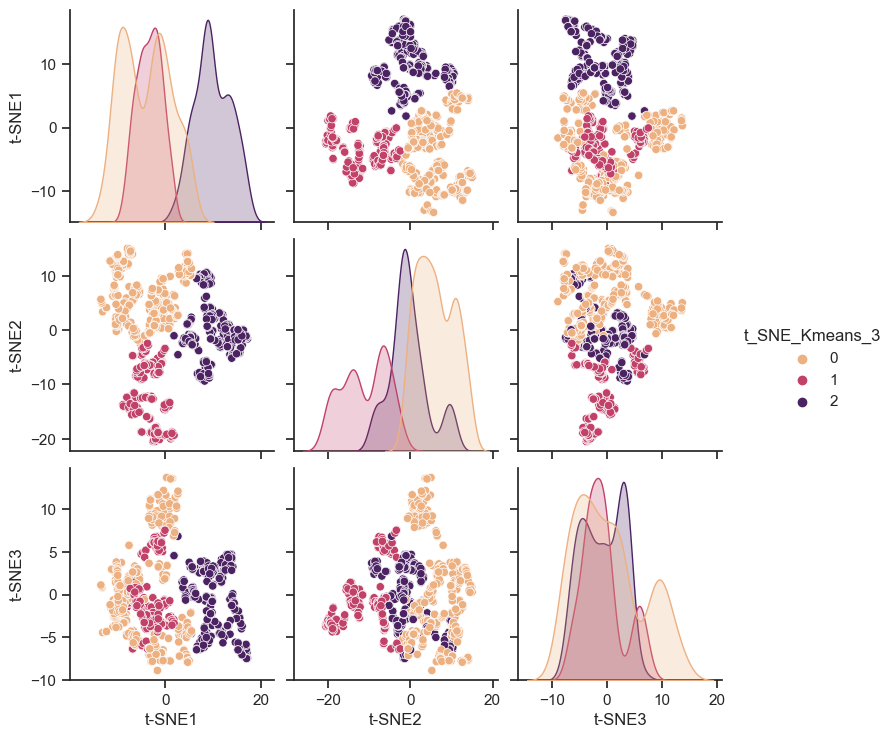

In [111]:
# Add the KMeans labels to the Pandas Dataframe and plot all data colored by cluster label
sns.set(style = 'ticks') # Set the background to ticks

t_SNE_data['t_SNE_Kmeans_3'] = cluster_labels4
sns.pairplot(t_SNE_data, vars = ['t-SNE1','t-SNE2', 't-SNE3'], hue = 't_SNE_Kmeans_3', palette = 'flare' )# Create a matrix scatterplot


<Axes: xlabel='t_SNE_Kmeans_3', ylabel='t-SNE1'>

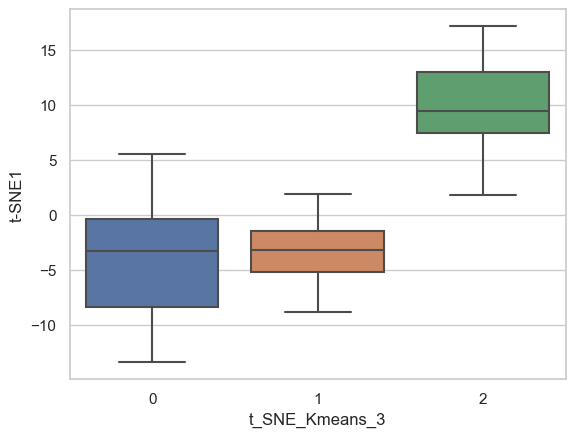

In [112]:
sns.set(style="whitegrid")
sns.boxplot(x=t_SNE_data['t_SNE_Kmeans_3'], y=t_SNE_data['t-SNE1'])

<Axes: xlabel='t_SNE_Kmeans_3', ylabel='t-SNE2'>

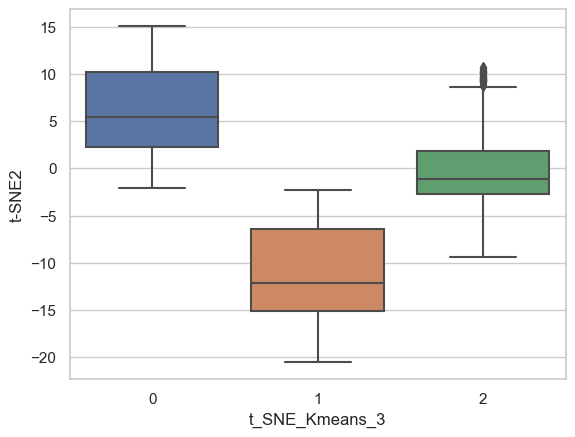

In [113]:
sns.set(style="whitegrid")
sns.boxplot(x=t_SNE_data['t_SNE_Kmeans_3'], y=t_SNE_data['t-SNE2'])

<Axes: xlabel='t_SNE_Kmeans_3', ylabel='t-SNE3'>

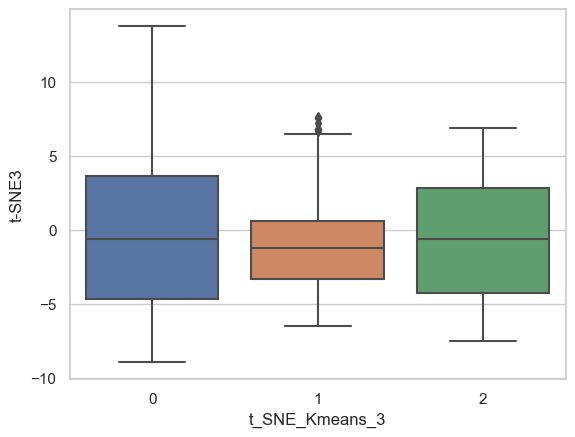

In [114]:
sns.set(style="whitegrid")
sns.boxplot(x=t_SNE_data['t_SNE_Kmeans_3'], y=t_SNE_data['t-SNE3'])

**Apply Kmeans on t-SNE data with 2 components**

In [115]:
t_SNE_data_K_2 = t_SNE_data_2[['t-SNE1','t-SNE2']] # Define the required data for this analysis

In [116]:
#Using SSW to determine optimum number of clusters
from sklearn.cluster import KMeans
SSW_t_SNE_2 = np.zeros(10) # Initialize the list SSW to be empty

for k in range(1,10):
    
    kmeans_for_TSNE_2 = KMeans(n_clusters = k, random_state=42).fit(t_SNE_data_K_2) # All the other K-Means options are defaulted
    
    SSW_t_SNE_2[k] = kmeans_for_TSNE_2.inertia_ # Compute the sum of squares within


print('The SSW values are', SSW_t_SNE_2[1:10])

C:\Users\EBEN\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\EBEN\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(
C:\Users\EBEN\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\EBEN\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment v

The SSW values are [743005.         434076.34375    231102.84375    141798.765625
 101228.9453125   77024.640625    63908.578125    50869.15625
  43876.38671875]


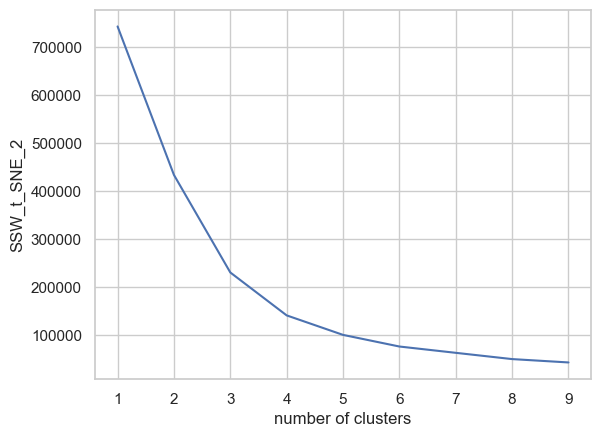

In [117]:
# Plot the SSW values and determine most optimum
clusters = range(1, 10)
plt.ylabel('SSW_t_SNE_2')
plt.xlabel('number of clusters')
plt.plot(clusters, SSW_t_SNE_2[1:10])

In [118]:
# Create a model using KMeans algorithm with the option of 3 clusters as determined
from sklearn.cluster import KMeans
t_SNE_data_kmeans_2 = KMeans(n_clusters = 3, init = 'k-means++', n_init = 10, max_iter = 300, random_state = 42)
cluster_labels4_2 = t_SNE_data_kmeans_2.fit_predict(t_SNE_data_K_2)

print(t_SNE_data_kmeans_2.labels_)
print(t_SNE_data_kmeans_2.cluster_centers_)

C:\Users\EBEN\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(


[2 2 2 2 1 2 1 2 1 2 1 1 1 2 2 2 1 2 1 2 2 2 2 2 2 2 1 1 1 1 1 2 1 1 1 2 2
 2 1 1 1 2 2 2 1 2 2 1 1 1 2 1 2 2 2 1 1 1 2 2 2 1 1 2 2 2 1 1 1 1 2 1 1 1
 1 2 2 2 2 2 2 2 2 1 1 2 2 2 2 2 1 0 2 2 2 1 1 0 2 2 0 0 1 0 2 2 1 1 1 1 1
 2 1 1 1 1 1 0 1 1 2 1 1 1 0 2 0 1 1 1 1 1 1 2 2 2 2 1 1 1 1 1 1 1 1 2 1 1
 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 0 0 0 1 2 2 2 2 2 2 0 0 0
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 1 0 0 0 1 1 1 1 1 1 1 1 2 1 0 1 1 1 2
 2 2 2 2 2 0 0 1 0 0 1 0 0 0 2 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 0 0 0 0
 2 0 2 2 2 2 1 1 2 2 2 1 1 1 2 2 2 2 2 2 2 1 1 1 0 0 1 2 1 1 0 0 0 2 2 2 2
 2 1 1 1 1 0 0 2 1 2 2 1 2 2 2 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2
 2 2 2 2 2 2 1 0 0 2 2 2 2 2 1 1 1 1 1 0 1 1 2 2 1 1 1 1 1 1 2 2 2 2 2 1 2
 2 1 0 1 1 0 1 1 1 0 2 2 1 1 2 1 2 1 2 1 1 0 1 1 1 1 0 1 0 2 0 1 0 1 1 1 0
 0 1 0 0 0 1 2 2 0 0 2 1 0 1 1 0 1 0 1 2 1 1 1 1 1 1 1 0 2 2 2 1 0 1 1 1 0
 2 2 1 1 1 0 1 1 1 0 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 0 0 0 0 0 0 

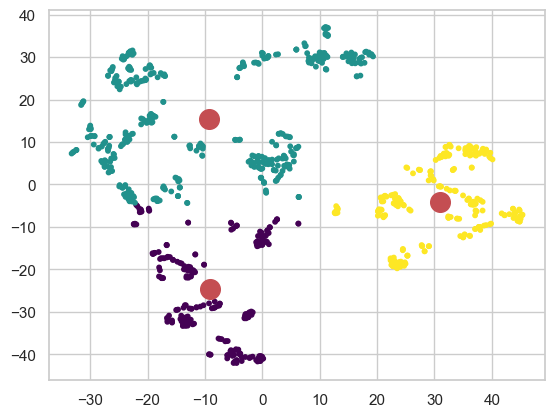

In [119]:
# Make a scatter plot to view clusters
plt.scatter(t_SNE_data_K_2.iloc[:, 0], t_SNE_data_K_2.iloc[:, 1], c=cluster_labels4_2, s=10, cmap='viridis')
plt.scatter(t_SNE_data_kmeans_2.cluster_centers_[:, 0], t_SNE_data_kmeans_2.cluster_centers_[:, 1], c='r', s=200);

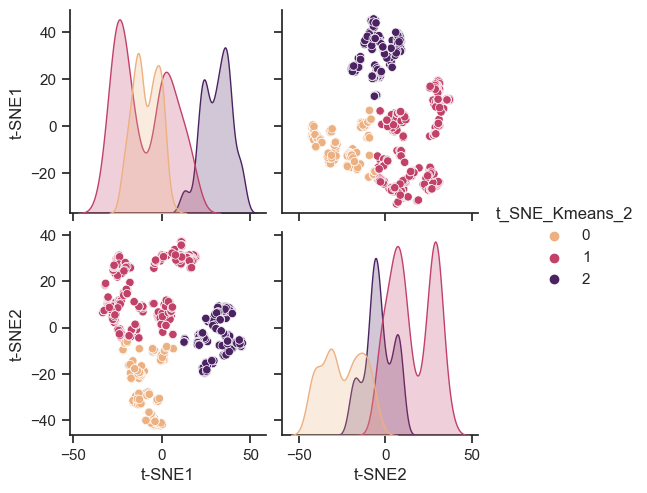

In [109]:
# Add the KMeans labels to the Pandas Dataframe and plot all data colored by cluster label
sns.set(style = 'ticks') # Set the background to ticks

t_SNE_data_2['t_SNE_Kmeans_2'] = cluster_labels4_2
sns.pairplot(t_SNE_data_2, vars = ['t-SNE1','t-SNE2'], hue = 't_SNE_Kmeans_2', palette = 'flare' )# Create a matrix scatterplot


<Axes: xlabel='t_SNE_Kmeans_2', ylabel='t-SNE1'>

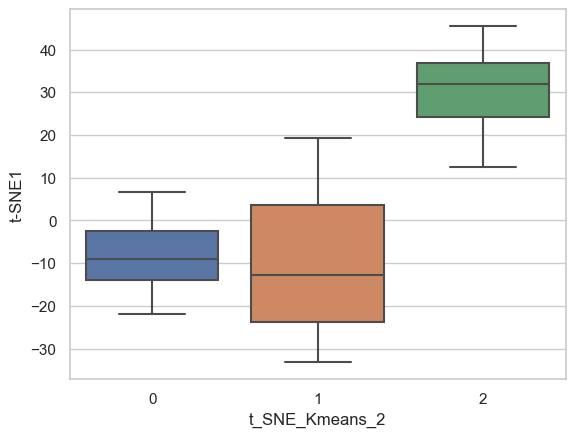

In [110]:
sns.set(style="whitegrid")
sns.boxplot(x=t_SNE_data_2['t_SNE_Kmeans_2'], y=t_SNE_data_2['t-SNE1'])

<Axes: xlabel='t_SNE_Kmeans_2', ylabel='t-SNE2'>

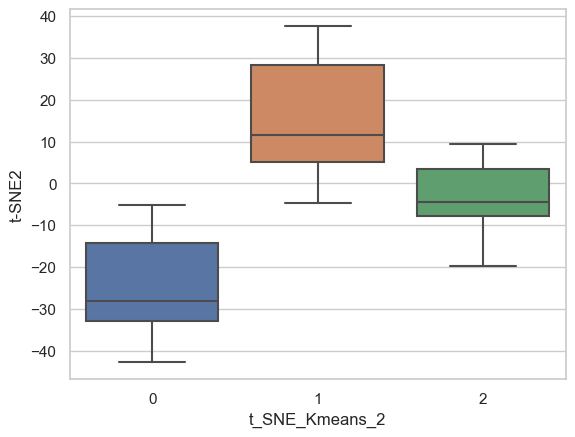

In [111]:
sns.set(style="whitegrid")
sns.boxplot(x=t_SNE_data_2['t_SNE_Kmeans_2'], y=t_SNE_data_2['t-SNE2'])

**Comments**

From the above, we can clearly see that using 2 as the number of components has more distinct clustering compared to when using 3 independent components. This clearly is supported by the matrix plot as well as the scatter plot having little or no overlap in the data. 

## **STEP 6**

Apply Hierarchical clustering on reduced datasets

**Apply Hierarchical Clustering on PCA data**

In [112]:
PCA_data2 = PCA_data.loc[:, 'PC1':'PC5'] # Define the required data for this analysis

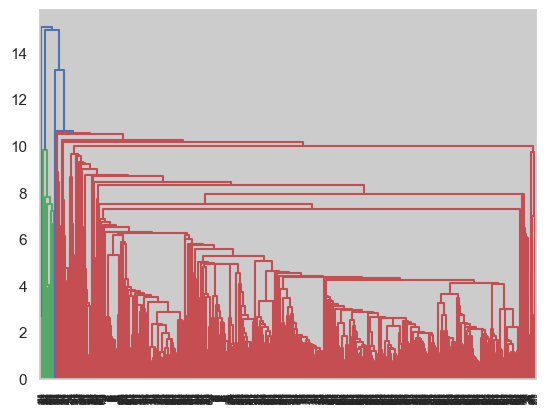

In [113]:
#Visualize the trees using dendogram using single linkage
dendrogram = sch.dendrogram(sch.linkage(PCA_data2, method='single'))

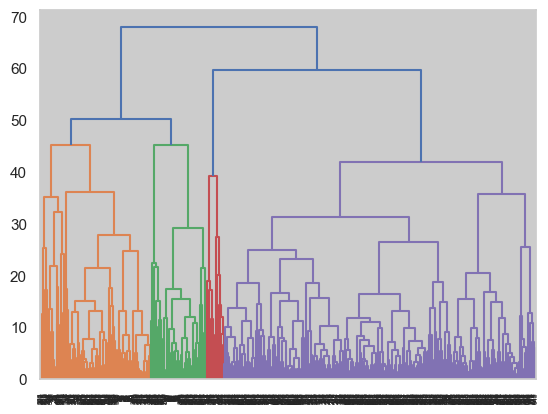

In [114]:
#Visualize the trees using dendogram using complete linkage
dendrogram = sch.dendrogram(sch.linkage(PCA_data2, method='complete'))

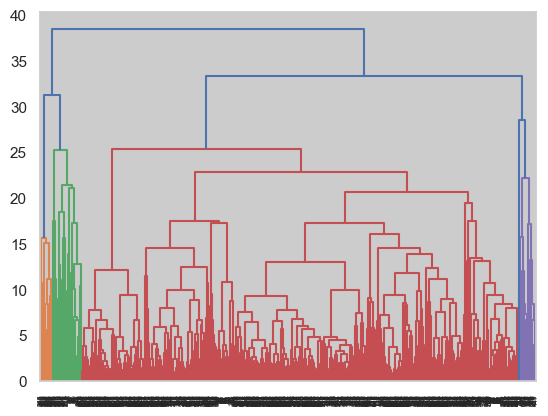

In [115]:
#Visualize the trees using dendogram using average linkage
dendrogram = sch.dendrogram(sch.linkage(PCA_data2, method='average'))

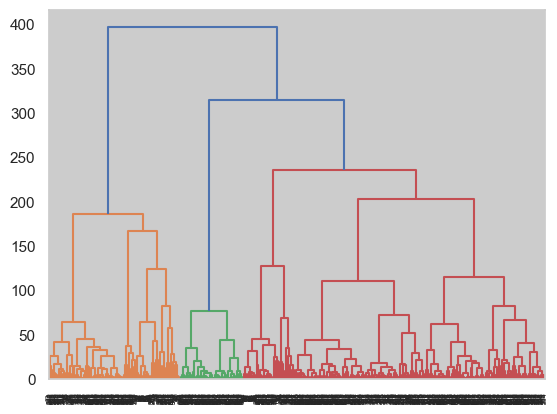

In [116]:
#Visualize the trees using dendogram using average linkage
dendrogram = sch.dendrogram(sch.linkage(PCA_data2, method='ward'))

In [117]:
# Define the model using complete and ward linkage since it had a better balance. Also using 3 clusters since we had determined 3 clusters to be the optimum number using SSW.
from sklearn.cluster import AgglomerativeClustering
hc_PCA_c = AgglomerativeClustering(n_clusters=3, affinity = 'euclidean', linkage = 'complete')

In [118]:
# Apply the model to the scaled data and predict the clusters
y_hc_PCA_c = hc_PCA_c.fit_predict(PCA_data2)
print(y_hc_PCA_c)

[0 0 0 0 2 0 2 0 0 0 2 0 0 0 0 0 2 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 1 1 1 0 0 1 1 2 1 0 0 1 1 2 1 2
 0 1 1 1 2 1 1 1 1 0 1 1 1 1 0 1 1 1 1 1 1 1 0 0 0 0 1 1 1 1 1 1 1 0 0 1 1
 1 1 1 1 1 1 2 2 1 1 1 1 1 2 1 1 1 1 1 1 1 1 0 0 1 1 1 1 0 0 0 0 0 0 1 1 1
 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 0
 0 0 0 0 0 1 1 1 1 1 1 1 1 1 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 1 1 1
 0 1 0 0 0 0 1 1 0 0 0 1 1 1 0 0 0 0 0 0 0 1 1 1 1 1 0 0 1 1 1 1 1 0 0 0 0
 0 1 1 1 1 1 1 0 1 0 0 1 0 0 0 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0
 1 1 1 1 1 1 1 1 1 0 0 0 0 0 1 1 1 2 1 1 1 2 0 0 2 1 1 1 1 1 0 0 0 0 0 0 0
 0 1 1 1 1 1 2 2 2 1 0 0 0 2 0 0 0 0 0 2 0 1 1 2 1 1 1 1 1 0 1 1 1 1 1 1 1
 1 1 1 1 1 1 0 0 1 1 0 1 1 1 0 1 1 1 2 0 1 2 1 1 2 1 1 1 0 0 0 1 1 1 1 1 1
 0 0 1 2 1 1 1 1 1 1 1 1 1 1 1 0 0 1 1 1 1 0 0 1 1 1 1 1 0 0 0 0 0 0 0 0 0
 0 0 0 1 1 1 1 1 1 1 1 1 

C:\Users\EBEN\anaconda3\lib\site-packages\sklearn\cluster\_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


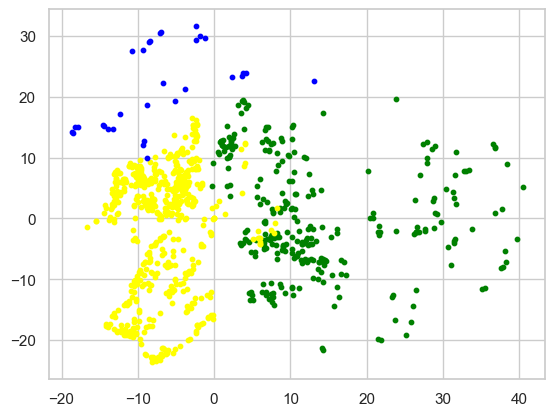

In [119]:
# Make a scatter plot to view the 3 clusters
plt.scatter(PCA_data2.iloc[y_hc_PCA_c ==0,0],PCA_data2.iloc[y_hc_PCA_c ==0,1], s=10, c='green')
plt.scatter(PCA_data2.iloc[y_hc_PCA_c ==1,0],PCA_data2.iloc[y_hc_PCA_c ==1,1], s=10, c='yellow')
plt.scatter(PCA_data2.iloc[y_hc_PCA_c ==2,0],PCA_data2.iloc[y_hc_PCA_c ==2,1], s=10, c='blue')

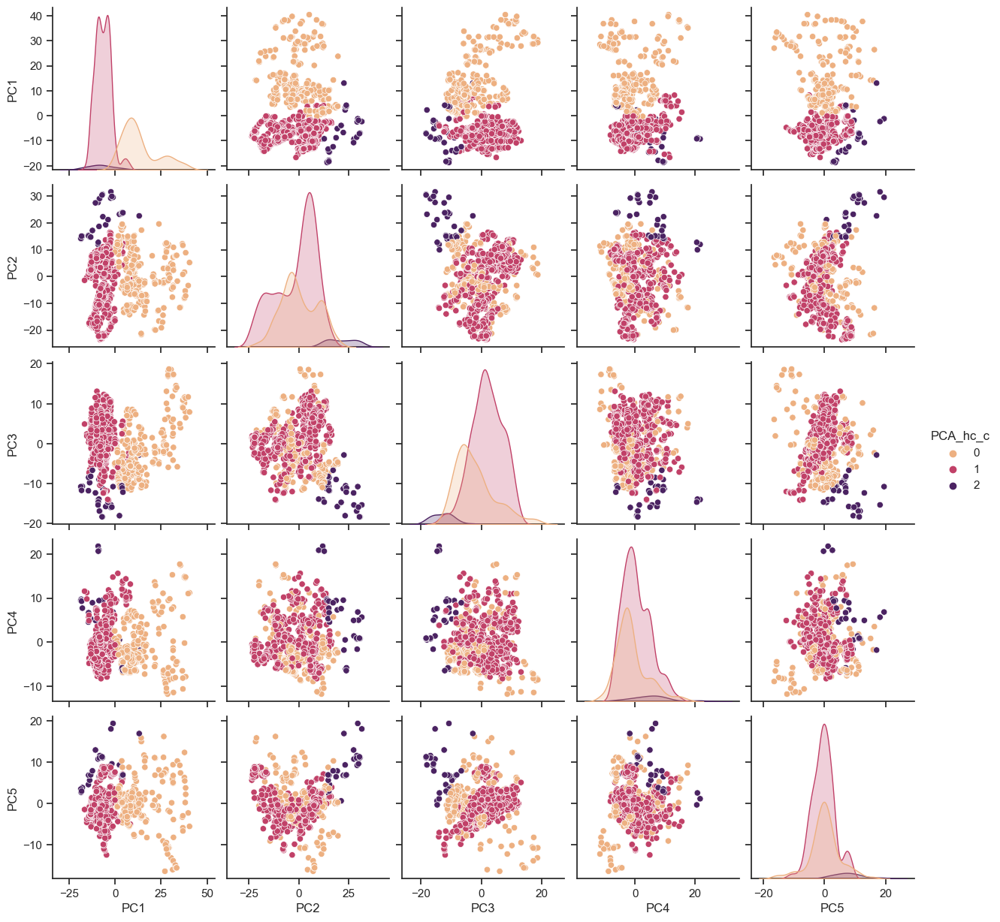

In [120]:
# Add the Hierarchical labels to the Pandas Dataframe and plot all data colored by cluster label
sns.set(style = 'ticks') # Set the background to ticks

PCA_data['PCA_hc_c'] = y_hc_PCA_c
sns.pairplot(PCA_data, vars = ['PC1', 'PC2', 'PC3', 'PC4', 'PC5'], hue = 'PCA_hc_c', palette = 'flare' )# Create a matrix scatterplot

<Axes: xlabel='PCA_hc_c', ylabel='PC1'>

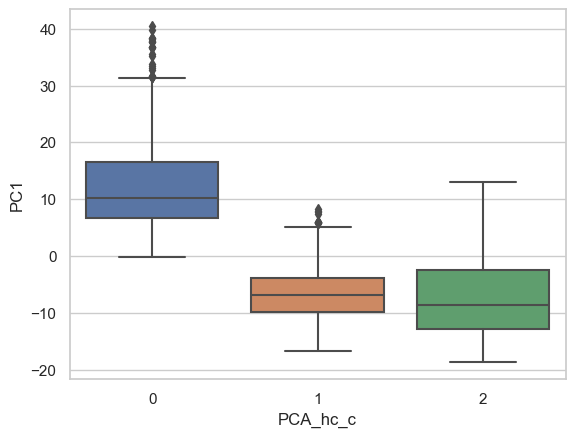

In [121]:
sns.set(style="whitegrid")
sns.boxplot(x=PCA_data['PCA_hc_c'], y=PCA_data['PC1'])

<Axes: xlabel='PCA_hc_c', ylabel='PC2'>

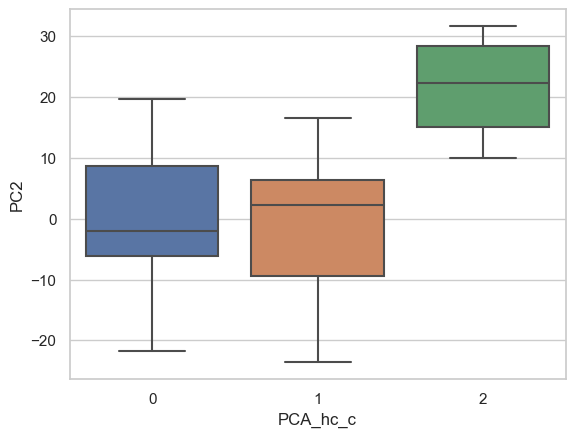

In [122]:
sns.set(style="whitegrid")
sns.boxplot(x=PCA_data['PCA_hc_c'], y=PCA_data['PC2'])

<Axes: xlabel='PCA_hc_c', ylabel='PC3'>

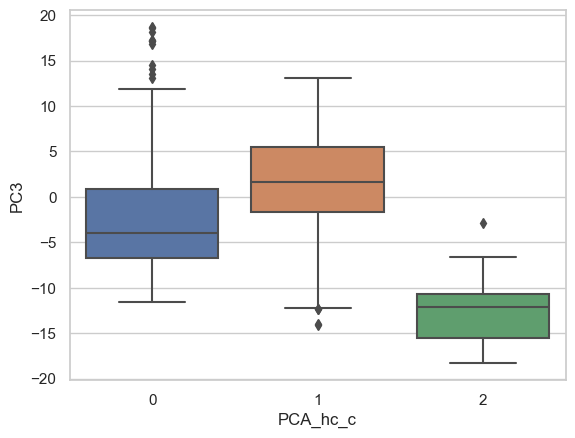

In [123]:
sns.set(style="whitegrid")
sns.boxplot(x=PCA_data['PCA_hc_c'], y=PCA_data['PC3'])

<Axes: xlabel='PCA_hc_c', ylabel='PC4'>

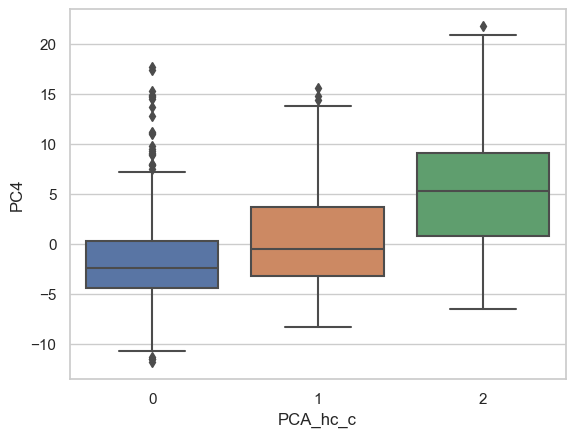

In [124]:
sns.set(style="whitegrid")
sns.boxplot(x=PCA_data['PCA_hc_c'], y=PCA_data['PC4'])

<Axes: xlabel='PCA_hc_c', ylabel='PC5'>

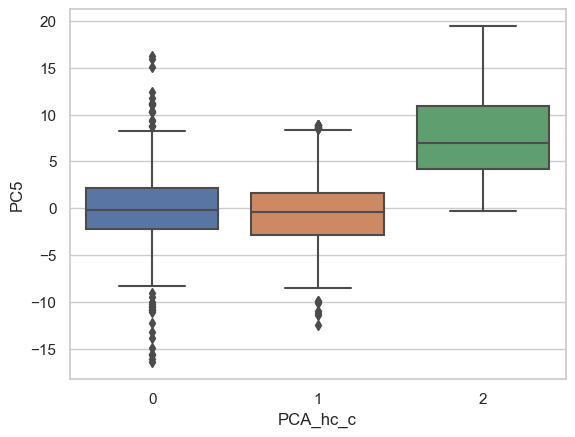

In [125]:
sns.set(style="whitegrid")
sns.boxplot(x=PCA_data['PCA_hc_c'], y=PCA_data['PC5'])

**Apply Hierarchy clustering using ward Linkage**

In [126]:
from sklearn.cluster import AgglomerativeClustering
hc_PCA_w = AgglomerativeClustering(n_clusters=3, affinity = 'euclidean', linkage = 'ward')

In [127]:
# Apply the model to the scaled data and predict the clusters
y_hc_PCA_w = hc_PCA_w.fit_predict(PCA_data2)
print(y_hc_PCA_w)

[1 1 1 1 0 1 0 1 1 1 0 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 0 0 0 1 1
 1 0 0 0 1 1 1 0 1 1 0 0 0 1 1 1 1 1 0 0 0 1 1 1 0 0 1 1 1 0 0 0 0 1 0 0 0
 0 1 1 1 1 1 1 1 1 0 0 1 1 1 1 1 0 0 1 1 1 0 0 0 1 1 0 0 0 0 1 1 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 1 1 1 1 0 0 0 0 0 0 0 0 1 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 1 1 1 1 1 1 0 0 0
 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1
 1 1 1 1 1 0 0 0 0 0 0 0 0 0 1 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 0 0 0 0
 1 0 1 1 1 1 0 0 1 1 1 0 0 0 1 1 1 1 1 1 1 0 0 0 0 0 0 1 0 0 0 0 0 1 1 1 1
 1 0 0 0 0 0 0 1 0 1 1 0 1 1 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1
 0 0 0 0 0 0 0 0 0 1 1 1 1 1 0 0 0 0 0 2 0 0 1 1 0 0 0 0 0 0 1 1 1 1 1 0 1
 1 0 2 0 0 2 0 0 0 2 1 1 0 0 1 0 1 0 1 0 0 0 0 0 0 0 2 0 2 1 2 0 2 0 0 0 2
 2 0 2 2 0 0 1 1 0 0 1 0 2 0 1 2 0 2 0 1 0 0 0 0 0 0 0 2 1 1 1 0 2 0 0 0 2
 1 1 0 0 0 2 0 0 0 0 0 0 0 2 0 1 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 2 2 2 2 2 2 

C:\Users\EBEN\anaconda3\lib\site-packages\sklearn\cluster\_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


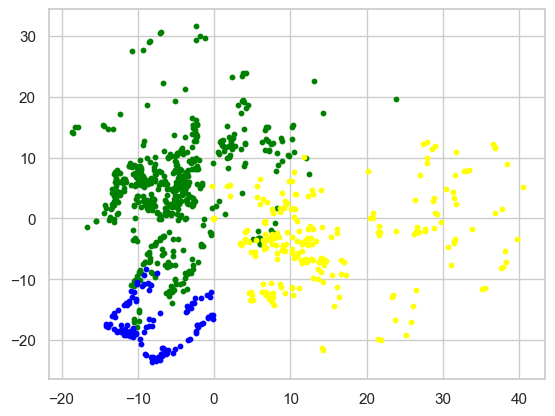

In [128]:
# Make a scatter plot to view the 3 clusters
plt.scatter(PCA_data2.iloc[y_hc_PCA_w ==0,0],PCA_data2.iloc[y_hc_PCA_w ==0,1], s=10, c='green')
plt.scatter(PCA_data2.iloc[y_hc_PCA_w ==1,0],PCA_data2.iloc[y_hc_PCA_w ==1,1], s=10, c='yellow')
plt.scatter(PCA_data2.iloc[y_hc_PCA_w ==2,0],PCA_data2.iloc[y_hc_PCA_w ==2,1], s=10, c='blue')

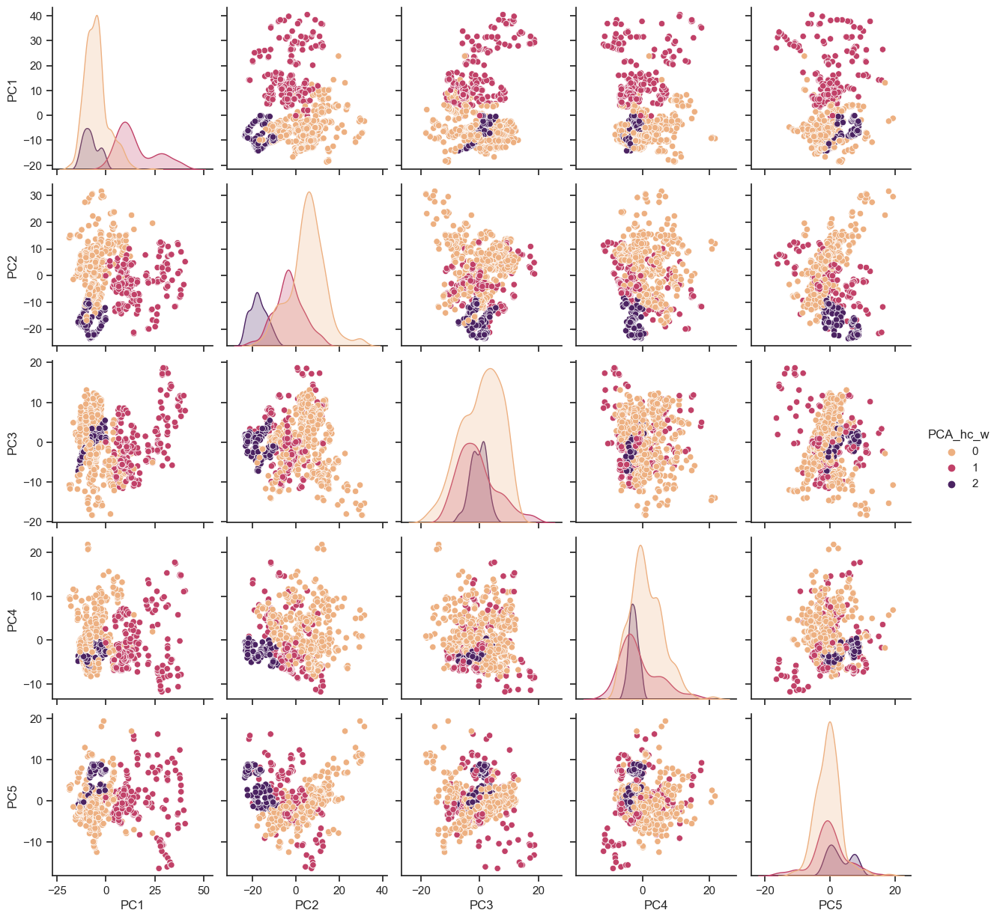

In [129]:
# Add the Hierarchical labels to the Pandas Dataframe and plot all data colored by cluster label
sns.set(style = 'ticks') # Set the background to ticks

PCA_data['PCA_hc_w'] = y_hc_PCA_w
sns.pairplot(PCA_data, vars = ['PC1', 'PC2', 'PC3', 'PC4', 'PC5'], hue = 'PCA_hc_w', palette = 'flare' )# Create a matrix scatterplot

<Axes: xlabel='PCA_hc_w', ylabel='PC1'>

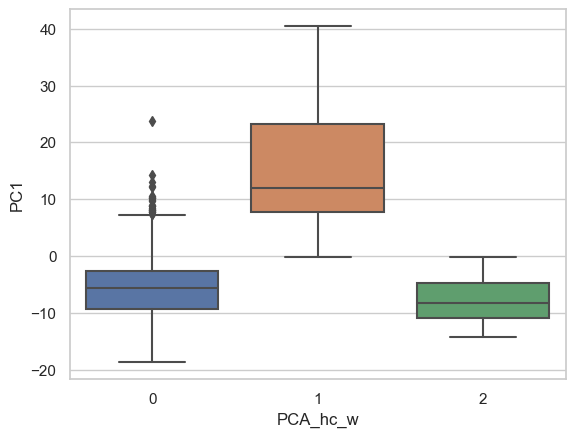

In [130]:
sns.set(style="whitegrid")
sns.boxplot(x=PCA_data['PCA_hc_w'], y=PCA_data['PC1'])

<Axes: xlabel='PCA_hc_w', ylabel='PC2'>

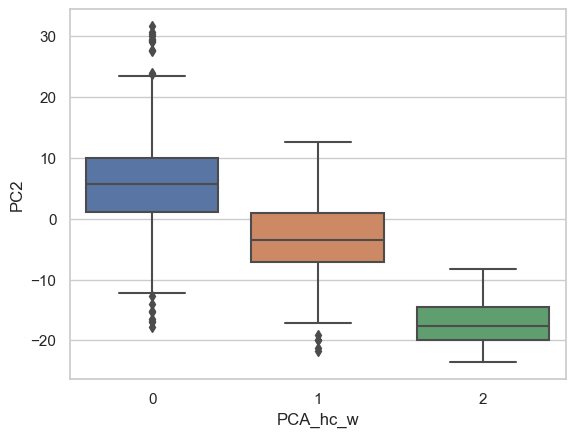

In [131]:
sns.set(style="whitegrid")
sns.boxplot(x=PCA_data['PCA_hc_w'], y=PCA_data['PC2'])

<Axes: xlabel='PCA_hc_w', ylabel='PC3'>

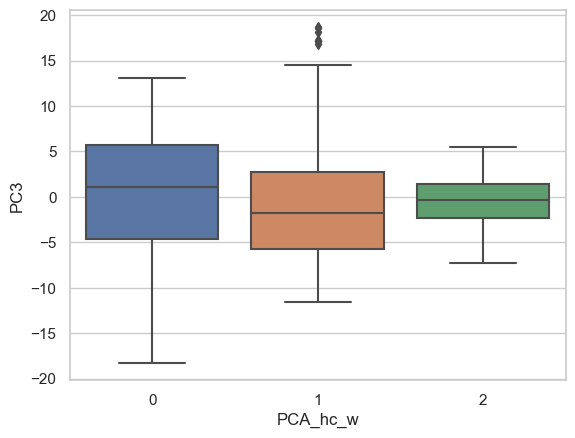

In [132]:
sns.set(style="whitegrid")
sns.boxplot(x=PCA_data['PCA_hc_w'], y=PCA_data['PC3'])

<Axes: xlabel='PCA_hc_w', ylabel='PC4'>

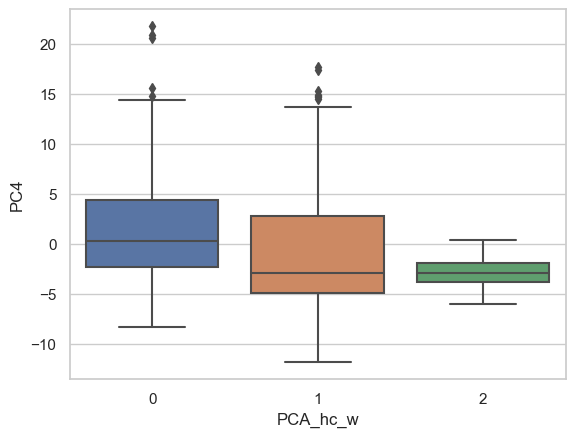

In [133]:
sns.set(style="whitegrid")
sns.boxplot(x=PCA_data['PCA_hc_w'], y=PCA_data['PC4'])

<Axes: xlabel='PCA_hc_w', ylabel='PC5'>

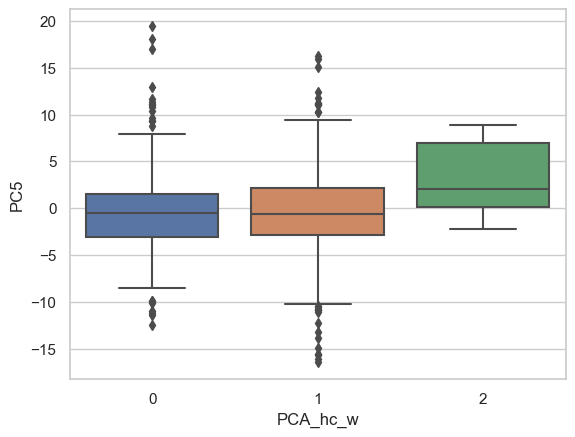

In [134]:
sns.set(style="whitegrid")
sns.boxplot(x=PCA_data['PCA_hc_w'], y=PCA_data['PC5'])

**Comments**

From the above clustering it is observed that using the complete linkage , there was more distinct clustering with less overlap.

**Apply Hierarchical Clustering on ICA data**

In [135]:
ICA_data2 = ICA_data_2.loc[:, 'IC1':'IC5'] # Define the required data for this analysis

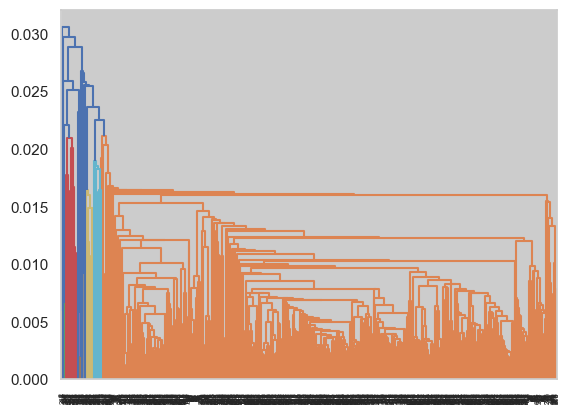

In [136]:
#Visualize the trees using dendogram using single linkage
dendrogram = sch.dendrogram(sch.linkage(ICA_data2, method='single'))

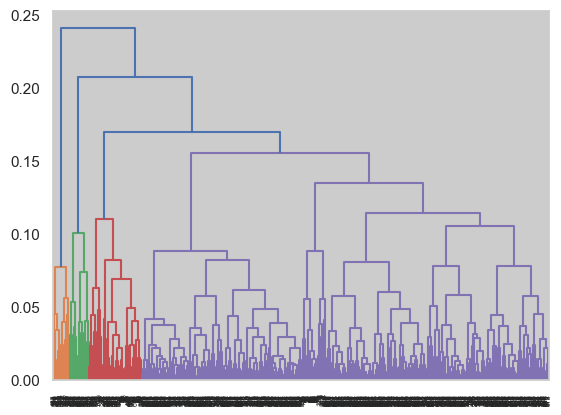

In [137]:
#Visualize the trees using dendogram using complete linkage
dendrogram = sch.dendrogram(sch.linkage(ICA_data2, method='complete'))

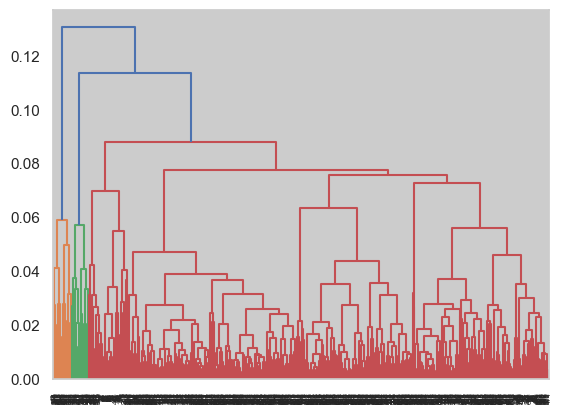

In [138]:
#Visualize the trees using dendogram using average linkage
dendrogram = sch.dendrogram(sch.linkage(ICA_data2, method='average'))

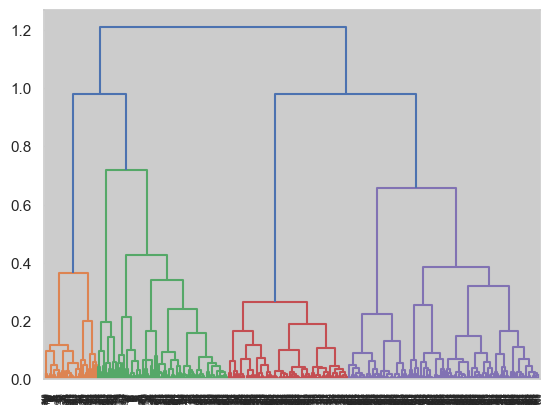

In [139]:
#Visualize the trees using dendogram using complete linkage
dendrogram = sch.dendrogram(sch.linkage(ICA_data2, method='ward'))

In [140]:
# Define the model using complete and ward linkage since it had a better balance. Also using 3 clusters since we had determined 3 clusters to be the optimum number using SSW.
from sklearn.cluster import AgglomerativeClustering
hc_ICA_c = AgglomerativeClustering(n_clusters=4, affinity = 'euclidean', linkage = 'complete')

In [141]:
# Apply the model to the scaled data and predict the clusters
y_hc_ICA_c = hc_ICA_c.fit_predict(ICA_data2)
print(y_hc_ICA_c)

[0 0 0 0 3 0 3 0 1 1 3 1 1 0 1 2 3 1 1 1 1 1 1 1 1 1 0 0 1 1 1 0 1 1 1 0 0
 0 1 1 1 0 0 0 1 0 0 1 1 1 0 0 0 1 0 1 1 1 0 0 0 1 1 0 0 0 1 1 1 1 0 1 1 1
 1 0 0 0 0 1 0 0 0 1 1 0 0 0 0 0 0 0 0 2 0 0 0 0 0 2 0 0 3 0 2 0 0 0 3 0 3
 0 0 0 0 3 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 0 0 0 0 0 3 3 0 0 0 0 0 3 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 0 0 0 0 0 0 0 0 0 0 0 0 2 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 2 0 2 0 0 0 0 0 2 2 1 0 0 0 1 1 2 2 1 1 2 0 0 0 0 0 1 2 0 0 0 0 0 0 0 0 1
 2 0 0 0 0 0 0 1 0 2 2 0 1 2 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 0
 0 0 0 0 0 0 0 0 0 2 0 2 0 2 0 0 0 3 0 0 0 3 0 2 3 0 0 0 0 0 2 2 2 2 0 1 1
 1 0 0 0 0 0 3 3 3 0 0 0 1 3 0 1 0 1 0 3 1 0 0 3 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 2 0 0 0 0 0 0 0 0 0 0 3 1 0 3 0 0 3 0 0 0 2 0 2 0 0 0 0 0 0
 2 0 0 3 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 1 1 1 1 1 1 1 1
 1 1 1 0 0 0 0 0 0 0 0 0 

C:\Users\EBEN\anaconda3\lib\site-packages\sklearn\cluster\_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


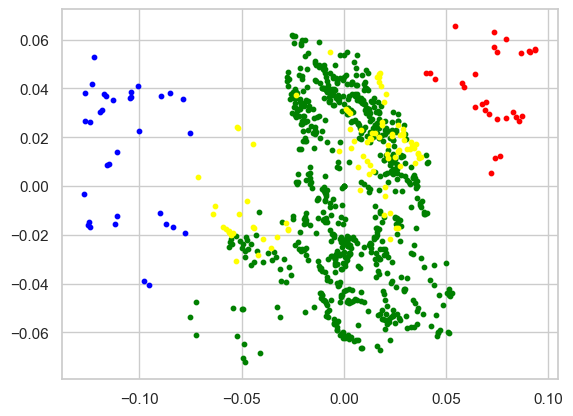

In [142]:
# Make a scatter plot to view the 4 clusters
plt.scatter(ICA_data2.iloc[y_hc_ICA_c ==0,0],ICA_data2.iloc[y_hc_ICA_c ==0,1], s=10, c='green')
plt.scatter(ICA_data2.iloc[y_hc_ICA_c ==1,0],ICA_data2.iloc[y_hc_ICA_c ==1,1], s=10, c='yellow')
plt.scatter(ICA_data2.iloc[y_hc_ICA_c ==2,0],ICA_data2.iloc[y_hc_ICA_c ==2,1], s=10, c='blue')
plt.scatter(ICA_data2.iloc[y_hc_ICA_c ==3,0],ICA_data2.iloc[y_hc_ICA_c ==3,1], s=10, c='red')

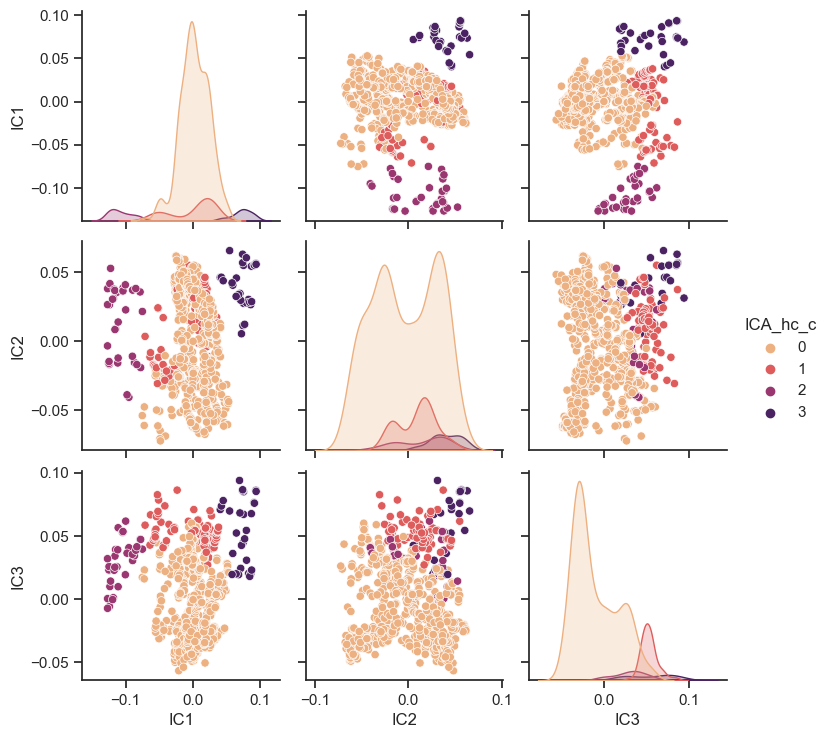

In [143]:
# Add the Hierarchical labels to the Pandas Dataframe and plot all data colored by cluster label
sns.set(style = 'ticks') # Set the background to ticks

ICA_data_2['ICA_hc_c'] = y_hc_ICA_c
sns.pairplot(ICA_data_2, vars = ['IC1', 'IC2', 'IC3'], hue = 'ICA_hc_c', palette = 'flare' )# Create a matrix scatterplot

<Axes: xlabel='ICA_hc_c', ylabel='IC1'>

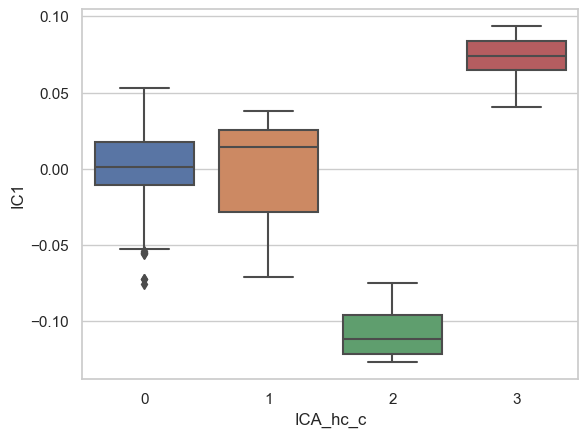

In [144]:
sns.set(style="whitegrid")
sns.boxplot(x=ICA_data_2['ICA_hc_c'], y=ICA_data_2['IC1'])

<Axes: xlabel='ICA_hc_c', ylabel='IC2'>

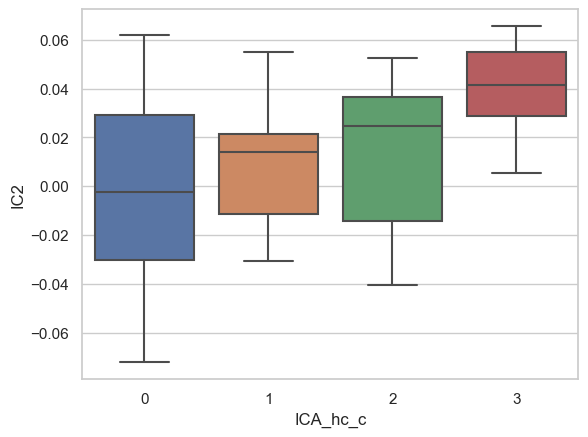

In [145]:
sns.set(style="whitegrid")
sns.boxplot(x=ICA_data_2['ICA_hc_c'], y=ICA_data_2['IC2'])

<Axes: xlabel='ICA_hc_c', ylabel='IC3'>

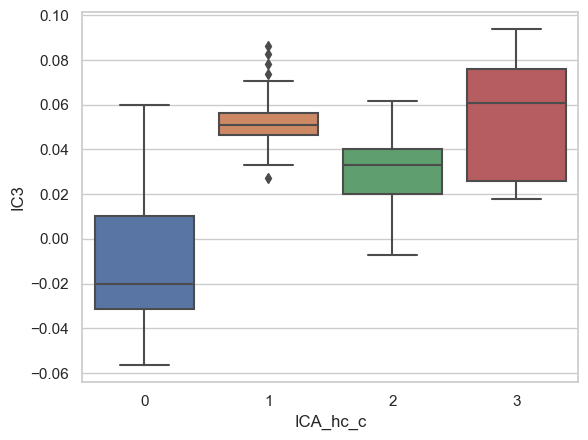

In [146]:
sns.set(style="whitegrid")
sns.boxplot(x=ICA_data_2['ICA_hc_c'], y=ICA_data_2['IC3'])

In [147]:
from sklearn.cluster import AgglomerativeClustering
hc_ICA_w = AgglomerativeClustering(n_clusters=4, affinity = 'euclidean', linkage = 'ward')

In [148]:
# Apply the model to the scaled data and predict the clusters
y_hc_ICA_w = hc_ICA_w.fit_predict(ICA_data2)
print(y_hc_ICA_w)

[0 0 0 0 3 0 3 0 3 0 3 3 3 0 0 0 3 0 3 0 0 0 0 0 0 0 2 1 3 3 3 0 3 3 3 0 0
 0 3 3 3 0 0 0 3 0 0 3 3 3 0 1 0 0 0 3 3 3 0 0 0 3 3 0 0 0 3 3 3 3 0 0 3 3
 3 0 0 0 0 0 0 0 0 3 3 0 0 0 0 0 2 1 0 0 0 2 2 1 0 0 1 1 3 1 0 0 2 2 3 2 3
 0 2 2 1 3 1 1 2 2 0 2 2 2 1 0 1 2 2 2 2 2 2 0 0 0 0 2 2 2 2 2 2 2 3 0 2 2
 2 2 2 2 1 2 3 3 2 2 2 2 2 3 2 2 2 2 2 2 2 2 0 0 1 1 1 2 0 0 0 0 0 0 1 1 1
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 0 2 1 1 1 2 2 2 2 2 2 1 2 0 1 1 2 2 2 0
 0 0 0 0 0 1 1 2 1 1 2 1 1 1 0 3 2 2 0 0 0 0 0 0 0 0 0 0 0 0 2 0 0 1 1 1 1
 0 1 0 0 0 0 2 2 0 0 0 2 2 2 0 0 0 0 0 0 0 2 2 2 1 1 0 0 2 2 1 1 1 0 0 0 0
 0 2 2 2 2 0 0 0 2 0 0 1 0 0 0 2 2 2 0 2 2 2 2 2 2 2 2 2 2 2 2 0 0 0 0 0 0
 0 0 0 0 0 0 2 1 1 0 0 0 0 0 2 2 2 3 2 1 2 3 0 0 3 2 2 2 1 1 0 0 0 0 0 3 0
 0 2 1 2 2 1 3 3 3 1 0 0 3 3 0 3 0 3 0 3 3 1 2 3 2 2 1 2 1 0 1 1 1 1 1 1 1
 1 1 1 1 1 2 0 0 1 1 0 1 1 1 1 1 2 1 3 0 2 3 2 2 3 2 2 1 0 0 0 2 1 2 1 2 1
 0 0 2 3 2 1 2 2 2 1 2 2 2 1 2 1 1 2 2 2 2 1 3 1 1 1 1 1 3 3 3 3 3 3 3 3 3
 3 3 3 2 2 2 1 1 1 1 1 1 

C:\Users\EBEN\anaconda3\lib\site-packages\sklearn\cluster\_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


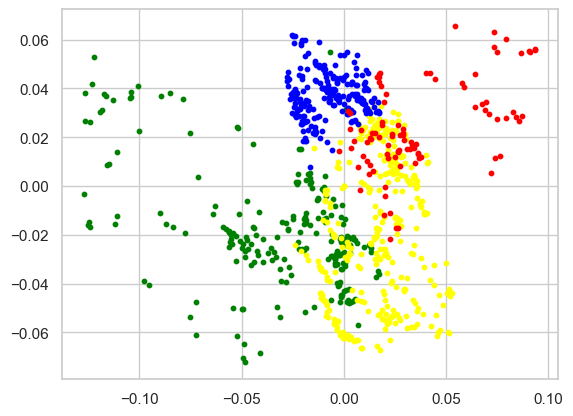

In [149]:
# Make a scatter plot to view the 5 clusters
plt.scatter(ICA_data2.iloc[y_hc_ICA_w ==0,0],ICA_data2.iloc[y_hc_ICA_w ==0,1], s=10, c='green')
plt.scatter(ICA_data2.iloc[y_hc_ICA_w ==1,0],ICA_data2.iloc[y_hc_ICA_w ==1,1], s=10, c='yellow')
plt.scatter(ICA_data2.iloc[y_hc_ICA_w ==2,0],ICA_data2.iloc[y_hc_ICA_w ==2,1], s=10, c='blue')
plt.scatter(ICA_data2.iloc[y_hc_ICA_w ==3,0],ICA_data2.iloc[y_hc_ICA_w ==3,1], s=10, c='red')

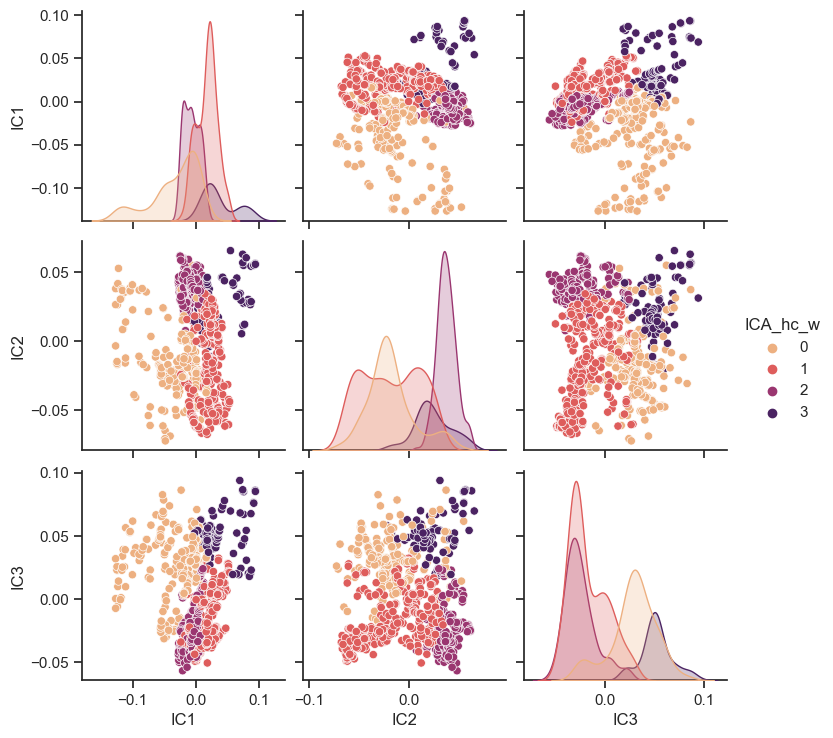

In [150]:
# Add the Hierarchical labels to the Pandas Dataframe and plot all data colored by cluster label
sns.set(style = 'ticks') # Set the background to ticks

ICA_data_2['ICA_hc_w'] = y_hc_ICA_w
sns.pairplot(ICA_data_2, vars = ['IC1', 'IC2', 'IC3'], hue = 'ICA_hc_w', palette = 'flare' )# Create a matrix scatterplot

<Axes: xlabel='ICA_hc_w', ylabel='IC1'>

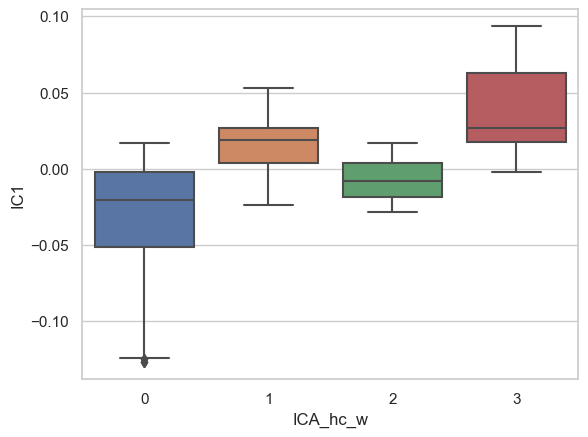

In [151]:
sns.set(style="whitegrid")
sns.boxplot(x=ICA_data_2['ICA_hc_w'], y=ICA_data_2['IC1'])

<Axes: xlabel='ICA_hc_w', ylabel='IC2'>

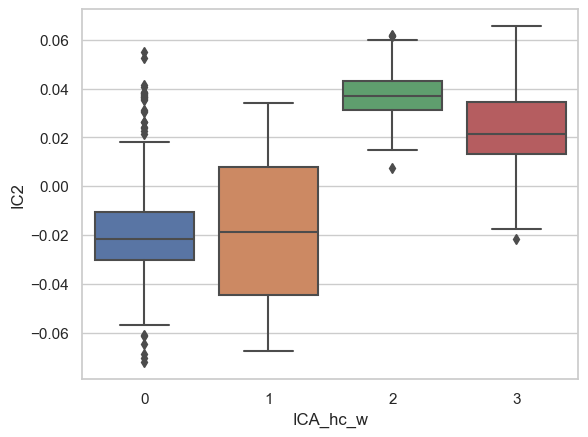

In [152]:
sns.set(style="whitegrid")
sns.boxplot(x=ICA_data_2['ICA_hc_w'], y=ICA_data_2['IC2'])

<Axes: xlabel='ICA_hc_w', ylabel='IC3'>

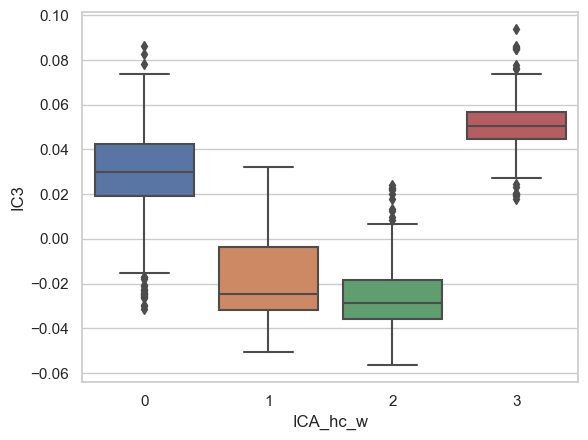

In [153]:
sns.set(style="whitegrid")
sns.boxplot(x=ICA_data_2['ICA_hc_w'], y=ICA_data_2['IC3'])

**Comments**

From the above clustering it is observed that using the complete linkage , there was more distinct clustering with less overlap.

**Apply Hierarchical Clustering on t-SNE data**

In [154]:
t_SNE_data_hc = t_SNE_data_2[['t-SNE1','t-SNE2']] # Define the required data for this analysis, we are using the dataset with two components since Kmeans validated it's distinct clusters better than that with 3 components.

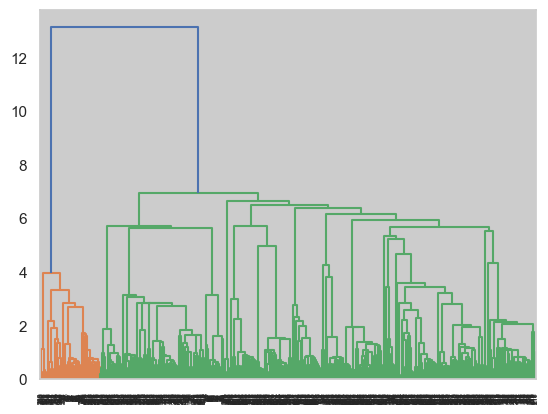

In [155]:
#Visualize the trees using dendogram using single linkage
dendrogram = sch.dendrogram(sch.linkage(t_SNE_data_hc, method='single'))

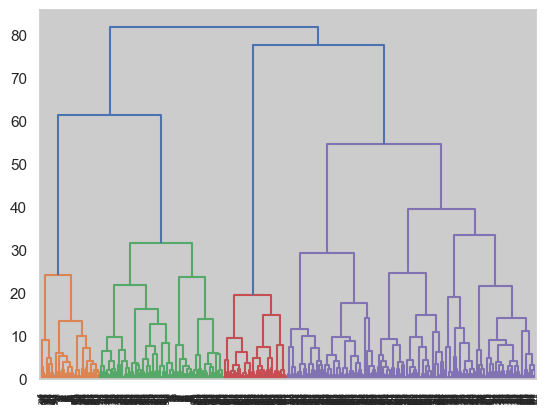

In [156]:
#Visualize the trees using dendogram using complete linkage
dendrogram = sch.dendrogram(sch.linkage(t_SNE_data_hc, method='complete'))

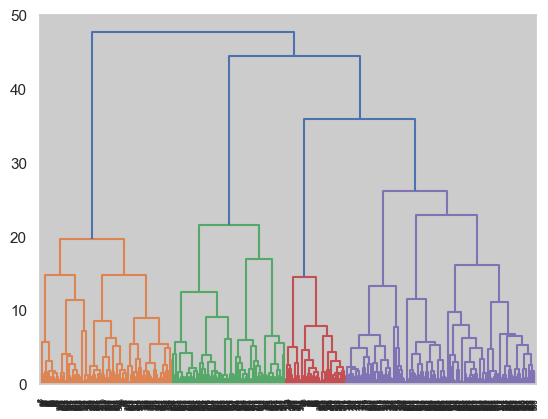

In [157]:
#Visualize the trees using dendogram using average linkage
dendrogram = sch.dendrogram(sch.linkage(t_SNE_data_hc, method='average'))

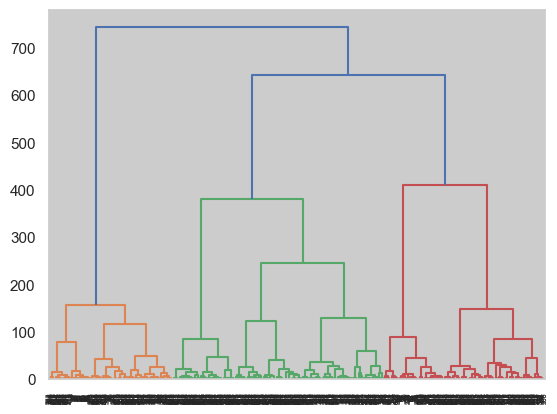

In [158]:
#Visualize the trees using dendogram using wards linkage
dendrogram = sch.dendrogram(sch.linkage(t_SNE_data_hc, method='ward'))

In [159]:
# Define the model using complete and ward linkage since it had a better balance. Also using 3 clusters since we had determined 3 clusters to be the optimum number using SSW.
from sklearn.cluster import AgglomerativeClustering
hc_TSNE_c = AgglomerativeClustering(n_clusters=3, affinity = 'euclidean', linkage = 'complete')

In [160]:
# Apply the model to the scaled data and predict the clusters
y_hc_TSNE_c = hc_TSNE_c.fit_predict(t_SNE_data_hc)
print(y_hc_TSNE_c)

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 1 1 1 0 0 1 1 0 1 0 0 1 1 0 1 0
 0 1 1 1 0 1 1 1 1 0 1 1 1 1 0 1 1 1 1 1 1 1 0 0 0 0 1 1 1 1 1 1 1 0 0 1 1
 1 1 1 1 1 1 0 0 1 1 1 1 1 0 1 1 1 1 1 1 1 1 0 0 1 1 1 1 0 0 0 0 0 0 1 1 1
 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 0
 0 0 0 0 0 1 1 1 1 1 1 1 1 1 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 1 1 1
 0 1 0 0 0 0 1 1 0 0 0 1 1 1 0 0 0 0 0 0 0 1 1 1 1 1 0 0 1 1 1 1 1 0 0 0 0
 0 1 1 1 1 1 1 0 1 0 0 1 0 0 0 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0
 1 1 1 1 1 1 1 1 1 0 0 0 0 0 1 1 1 0 1 2 1 0 0 0 0 1 1 1 1 1 0 0 0 0 0 0 0
 0 1 2 1 1 2 0 0 0 2 0 0 0 0 0 0 0 0 0 0 0 1 1 0 1 1 2 1 2 0 2 1 2 1 1 1 2
 2 1 2 2 1 1 0 0 1 1 0 1 2 1 0 2 1 2 0 0 1 0 1 1 0 1 1 2 0 0 0 1 2 1 1 1 2
 0 0 1 0 1 2 1 1 1 1 1 1 1 2 1 0 0 1 1 1 1 0 0 1 1 1 1 1 0 0 0 0 0 0 0 0 0
 0 0 0 1 1 1 2 2 2 2 2 2 

C:\Users\EBEN\anaconda3\lib\site-packages\sklearn\cluster\_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


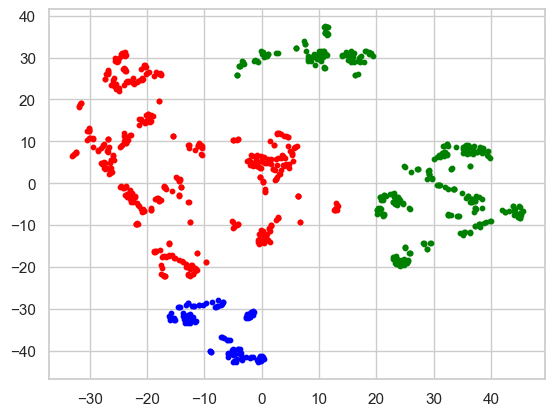

In [161]:
# Make a scatter plot to view the 5 clusters
plt.scatter(t_SNE_data_hc.iloc[y_hc_TSNE_c ==0,0],t_SNE_data_hc.iloc[y_hc_TSNE_c ==0,1], s=10, c='green')
plt.scatter(t_SNE_data_hc.iloc[y_hc_TSNE_c ==1,0],t_SNE_data_hc.iloc[y_hc_TSNE_c ==1,1], s=10, c='red')
plt.scatter(t_SNE_data_hc.iloc[y_hc_TSNE_c ==2,0],t_SNE_data_hc.iloc[y_hc_TSNE_c ==2,1], s=10, c='blue')

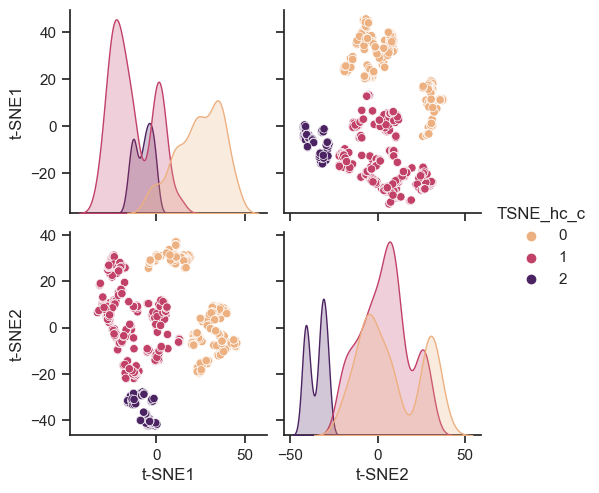

In [162]:
# Add the Hierarchical labels to the Pandas Dataframe and plot all data colored by cluster label
sns.set(style = 'ticks') # Set the background to ticks

t_SNE_data_2['TSNE_hc_c'] = y_hc_TSNE_c
sns.pairplot(t_SNE_data_2, vars = ['t-SNE1','t-SNE2'], hue = 'TSNE_hc_c', palette = 'flare' )# Create a matrix scatterplot

<Axes: xlabel='TSNE_hc_c', ylabel='t-SNE1'>

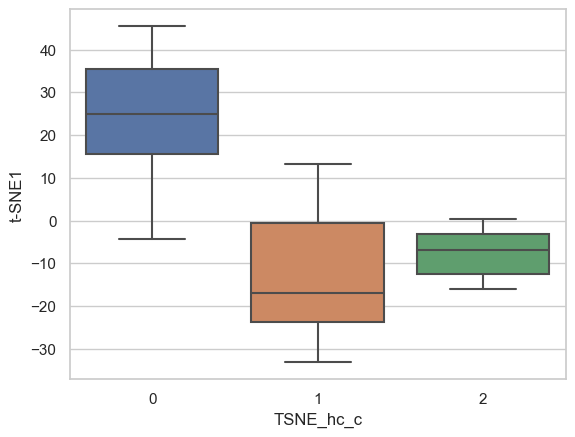

In [163]:
sns.set(style="whitegrid")
sns.boxplot(x=t_SNE_data_2['TSNE_hc_c'], y=t_SNE_data_2['t-SNE1'])

<Axes: xlabel='TSNE_hc_c', ylabel='t-SNE2'>

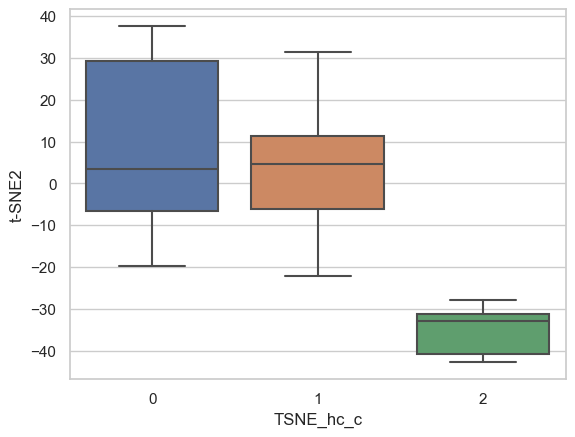

In [164]:
sns.set(style="whitegrid")
sns.boxplot(x=t_SNE_data_2['TSNE_hc_c'], y=t_SNE_data_2['t-SNE2'])

In [165]:
from sklearn.cluster import AgglomerativeClustering
hc_TSNE_w = AgglomerativeClustering(n_clusters=3, affinity = 'euclidean', linkage = 'ward')

In [166]:
# Apply the model to the scaled data and predict the clusters
y_hc_TSNE_w = hc_TSNE_w.fit_predict(t_SNE_data_hc)
print(y_hc_TSNE_w)

[1 1 1 1 0 1 0 1 0 1 0 0 0 1 1 1 0 1 0 1 1 1 1 1 1 1 0 2 0 0 0 1 0 0 0 1 1
 1 0 0 0 1 1 1 0 1 1 0 0 0 1 2 1 1 1 0 0 0 1 1 1 0 0 1 1 1 0 0 0 0 1 0 0 0
 0 1 1 1 1 1 1 1 1 0 0 1 1 1 1 1 0 2 1 1 1 0 0 2 1 1 2 2 0 2 1 1 0 2 0 2 0
 1 2 2 0 0 0 2 2 2 1 2 2 2 2 1 2 2 2 2 2 2 2 1 1 1 1 2 2 2 2 2 2 2 0 1 2 2
 2 2 2 2 2 2 0 0 2 2 2 2 2 0 2 2 2 2 2 2 2 2 1 1 2 2 2 2 1 1 1 1 1 1 2 2 2
 2 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1 2 1 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 1
 1 1 1 1 1 2 2 2 2 2 2 2 2 2 1 0 2 2 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 2 2 2 2
 1 2 1 1 1 1 0 0 1 1 1 2 2 2 1 1 1 1 1 1 1 2 2 2 2 2 0 1 2 2 2 2 2 1 1 1 1
 1 2 2 2 2 2 2 1 2 1 1 2 1 1 1 0 0 0 1 0 0 0 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1
 2 2 2 2 2 2 2 2 2 1 1 1 1 1 2 2 2 0 0 2 0 0 1 1 0 0 0 0 0 0 1 1 1 1 1 0 1
 1 0 2 0 0 2 0 0 0 2 1 1 0 0 1 0 1 0 1 0 0 2 0 0 0 0 2 0 2 1 2 0 2 0 0 0 2
 2 0 2 2 2 0 1 1 2 2 1 0 2 0 0 2 0 2 0 1 0 0 0 0 0 0 0 2 1 1 1 0 2 0 0 0 2
 1 1 0 0 0 2 0 0 0 2 0 0 0 2 0 0 0 0 0 0 0 0 0 2 2 2 2 2 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 2 2 2 2 2 2 

C:\Users\EBEN\anaconda3\lib\site-packages\sklearn\cluster\_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


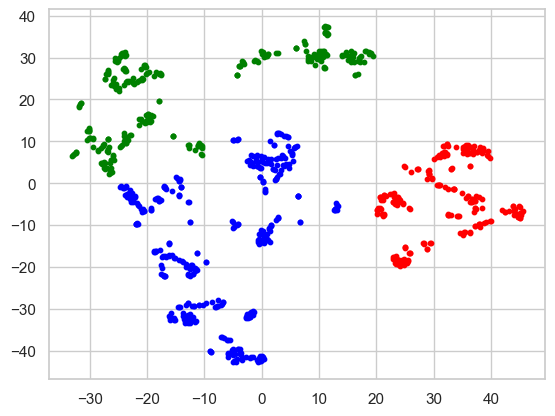

In [167]:
# Make a scatter plot to view the 5 clusters
plt.scatter(t_SNE_data_hc.iloc[y_hc_TSNE_w ==0,0],t_SNE_data_hc.iloc[y_hc_TSNE_w ==0,1], s=10, c='green')
plt.scatter(t_SNE_data_hc.iloc[y_hc_TSNE_w ==1,0],t_SNE_data_hc.iloc[y_hc_TSNE_w ==1,1], s=10, c='red')
plt.scatter(t_SNE_data_hc.iloc[y_hc_TSNE_w ==2,0],t_SNE_data_hc.iloc[y_hc_TSNE_w ==2,1], s=10, c='blue')

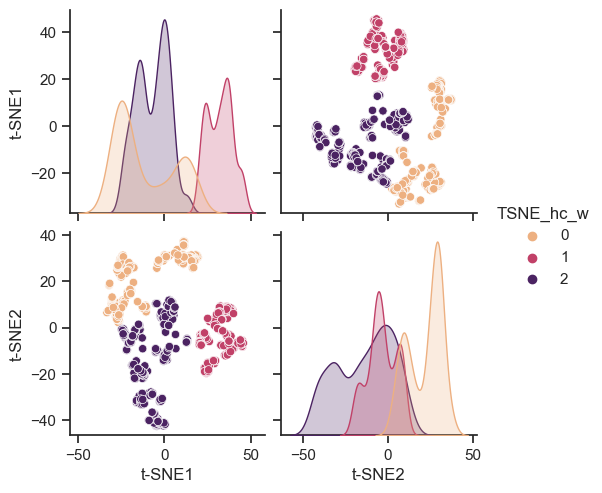

In [168]:
# Add the Hierarchical labels to the Pandas Dataframe and plot all data colored by cluster label
sns.set(style = 'ticks') # Set the background to ticks

t_SNE_data_2['TSNE_hc_w'] = y_hc_TSNE_w
sns.pairplot(t_SNE_data_2, vars = ['t-SNE1','t-SNE2'], hue = 'TSNE_hc_w', palette = 'flare' )# Create a matrix scatterplot

<Axes: xlabel='TSNE_hc_w', ylabel='t-SNE1'>

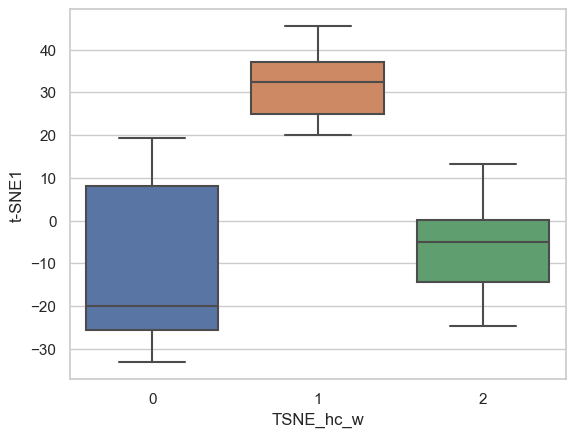

In [169]:
sns.set(style="whitegrid")
sns.boxplot(x=t_SNE_data_2['TSNE_hc_w'], y=t_SNE_data_2['t-SNE1'])

<Axes: xlabel='TSNE_hc_w', ylabel='t-SNE2'>

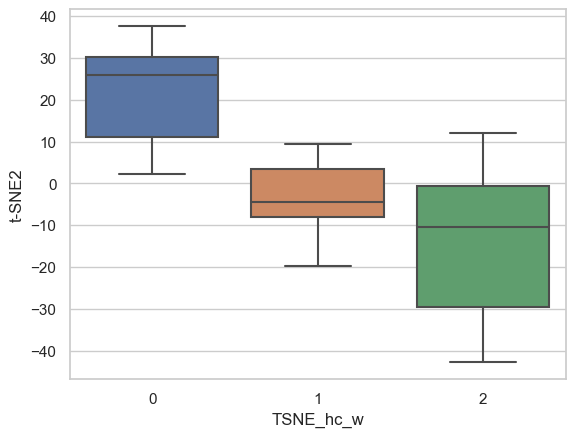

In [170]:
sns.set(style="whitegrid")
sns.boxplot(x=t_SNE_data_2['TSNE_hc_w'], y=t_SNE_data_2['t-SNE2'])

**Comments**

From the above, it can be seen that the clustering with ward linkage had better clustering than the complete linkage for the hierarchy clustering of the t-SNE data.

**Comments**

As explained via email, the UMAP codes didn't work and you permitted that i proceed with my analysis without the UMAP analysis while i make an input on it in my presentation slides.

**Reference Link:** https://www.analyticsvidhya.com/blog/2018/08/dimensionality-reduction-techniques-python/

## **Comments**

After thoroughly analyzing all the results, and developing a quantitative measure to check for similarities in the clusters of each algorithm and technique (the result will be presented in the slides), it was determined that t-SNE had the best performance when using Kmeans and Hierarchical clustering.

**References**

Additional references to the already provided references above.

Deepak Devegowda. Spring 2021. "k-Means Clustering Toy Example & Core Data“

https://stackoverflow.com/questions/55291667/getting-typeerror-slicenone-none-none-0-is-an-invalid-key

Deepak Devegowda. Spring 2021. "k-Means Clustering Toy Example & Core Data“

Deepak Devegowda. Spring 2021. "Univariate Statistics on Core and Well Log Data“

Deepak Devegowda. Spring 2021. "Scaling Algorithms-Illustration on Well Drilling and Log Data"

Deepak Devegowda. Spring 2021. "Hierarchical Clustering Toy Example and Core Data“

https://stackoverflow.com/questions/55291667/getting-typeerror-slicenone-none-none-0-is-an-invalid-key

https://github.com/marcotcr/lime/issues/293
